In [14]:
%pip install pandas numpy matplotlib seaborn scipy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from scipy import stats

warnings.simplefilter(action='ignore', category=FutureWarning)

#Load city data from listings and reviews CSV files
def load_city_data(listings_path, reviews_path):
    listings_df = pd.read_csv(listings_path)
    reviews_df = pd.read_csv(reviews_path)
    return listings_df, reviews_df

#Filter coluimns in dataframes to keep only the potentially relevant features
def filter_columns(listings_df, reviews_df):
    listing_columns_to_keep = [
        'id', 'price', 'minimum_nights', 'maximum_nights', 'availability_365', 
        'neighbourhood_cleansed', 'room_type', 'property_type',
        'number_of_reviews', 'reviews_per_month', 'review_scores_rating', 'review_scores_accuracy',
        'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
        'review_scores_location', 'review_scores_value', 'latitude', 'longitude',
        'first_review', 'last_review', 'calculated_host_listings_count',
        'host_is_superhost', 'instant_bookable'
    ]

    reviews_columns_to_keep = ['listing_id', 'id', 'date', 'comments']

    listings_filtered = listings_df[listing_columns_to_keep]
    reviews_filtered = reviews_df[reviews_columns_to_keep]
    
    return listings_filtered, reviews_filtered

#Price is critical for analysis
#host_is_superhost missing data is relatively small amount of overall entries
def remove_rows_with_missing(listings_df):
    listings_df = listings_df.dropna(subset=['price'])
    listings_df = listings_df.dropna(subset=['host_is_superhost'])
    return listings_df

#Perform data cleaning for future use on listings dataframe
def manipulate_listings_data(listings_df):
    #Convert dates to datetime format
    listings_df['first_review'] = pd.to_datetime(listings_df['first_review'], errors='coerce')
    listings_df['last_review'] = pd.to_datetime(listings_df['last_review'], errors='coerce')

    #Remove $ symbol from price and ensure conversion to numeric value
    listings_df['price'] = listings_df['price'].str.replace(r'[\$,]', '', regex=True).str.strip()
    listings_df['price'] = pd.to_numeric(listings_df['price'], errors='coerce')

    #Convert True/False values with 1/0 from numeric representation
    listings_df['host_is_superhost'] = listings_df['host_is_superhost'].replace({'t': 1, 'f': 0}).astype(int)
    listings_df['instant_bookable'] = listings_df['instant_bookable'].replace({'t': 1, 'f': 0}).astype(int)

    return listings_df

#Perform data cleaning for future use on review dataframe
def manipulate_reviews_data(reviews_df):
    #Fill in missing comments with empty string
    reviews_df['comments'] = reviews_df['comments'].fillna('')

    #Convert dates to datetime format
    reviews_df['date'] = pd.to_datetime(reviews_df['date'], errors='coerce')

    return reviews_df

#Split data on basis of price-based analysis and reviews-based
#Data with no reviews may be helpful for pricing analysis but less useful for review orientated analysis
def split_data(listings_df):
    price_based_df = listings_df.copy()

    #Subset of columns that are part of the review
    review_columns = [
        'review_scores_rating', 'number_of_reviews', 'review_scores_accuracy', 
        'review_scores_cleanliness', 'review_scores_checkin', 
        'review_scores_communication', 'review_scores_location', 'review_scores_value'
    ]

    #Need to drop minor amount of rows that have incomplete reviews
    reviews_based_df = listings_df.dropna(subset=review_columns)

    return price_based_df, reviews_based_df

#Data configuration pipeline
def configure_city_data(listings_path, reviews_path):
    listings_df, reviews_df = load_city_data(listings_path, reviews_path)
    listings_df, reviews_df = filter_columns(listings_df, reviews_df)
    listings_df = remove_rows_with_missing(listings_df)
    listings_df = manipulate_listings_data(listings_df)
    reviews_df = manipulate_reviews_data(reviews_df)
    price_based_listing_df, review_based_listing_df = split_data(listings_df)

    return price_based_listing_df, review_based_listing_df, reviews_df

city_data = {
    "Seattle": {
        "listings_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Seattle\\listings.csv",
        "reviews_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Seattle\\reviews.csv"
    },
    "SanFrancisco": {
        "listings_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\SanFrancisco\\listings.csv",
        "reviews_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\SanFrancisco\\reviews.csv"
    },
    "NewYorkCity": {
        "listings_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\NewYorkCity\\listings.csv",
        "reviews_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\NewYorkCity\\reviews.csv"
    },
    "Hawaii": {
        "listings_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Hawaii\\listings.csv",
        "reviews_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Hawaii\\reviews.csv"
    },
    "Boston": {
        "listings_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Boston\\listings.csv",
        "reviews_path": "c:\\Users\\tyboy\\Desktop\\MSCS\\6140\\A1\\Boston\\reviews.csv"
    }
}


city_dfs = {}

for city, paths in city_data.items():
    # Throw the cities through the data configuration pipeline and get the desired dataframes
    price_based_df, review_based_df, reviews_df = configure_city_data(paths['listings_path'], paths['reviews_path'])
    city_dfs[city] = {
        'listings_price_based_df': price_based_df,
        'listings_review_based_df': review_based_df,
        'reviews_df': reviews_df
    }


Note: you may need to restart the kernel to use updated packages.


In [15]:
"""
This cell is intended to allow for a quick view into each dataframe for each city.
It is not necessary to run for the core purpose of the EDA.
"""

# def display_city_dataframes_head(city_dfs, num_rows=5):
#     for city, dfs in city_dfs.items():
#         print(f"\n===== {city} =====")
#         print("\nPrice-Based Listings DataFrame Head:")
#         print(dfs['listings_price_based_df'].head(num_rows))

#         print("\nReview-Based Listings DataFrame Head:")
#         print(dfs['listings_review_based_df'].head(num_rows))

#         print("\nReviews DataFrame Head:")
#         print(dfs['reviews_df'].head(num_rows))

# display_city_dataframes_head(city_dfs)


'\nThis cell is intended to allow for a quick view into each dataframe for each city.\nIt is not necessary to run for the core purpose of the EDA.\n'

In [16]:
"""
This cell is intended to help count the number of missing entries in each dataframe for each city.
It is not necessary to run for the core purpose of the EDA.
"""

# def count_missing_values(df, df_name):
#     missing_values = df.isnull().sum()
#     total_missing = missing_values.sum()
#     print(f"\nMissing values in {df_name} DataFrame:")
#     print(missing_values[missing_values > 0]) 
#     print(f"Total missing entries: {total_missing}")
#     print("-" * 50)

# for city, dfs in city_dfs.items():
#     print(f"\n===== Missing values for {city} =====")
#     count_missing_values(dfs['listings_price_based_df'], 'listings_price_based_df')
#     count_missing_values(dfs['listings_review_based_df'], 'listings_review_based_df')
#     count_missing_values(dfs['reviews_df'], 'reviews_df')
#     print("=" * 50)


'\nThis cell is intended to help count the number of missing entries in each dataframe for each city.\nIt is not necessary to run for the core purpose of the EDA.\n'

In [17]:
"""
1.) Description Statistics

Attempting to find the following for each city:
Central Tendency: Mean and Median
Dispersion: Standard Deviation and Variance
Distribution: Skewness and Kurtosis
"""

#Calculate the Description Statistics for a specified df
def find_df_description_stats(df, columns):
    stats = df[columns].describe()

    median = df[columns].median()
    variance = df[columns].var() # How far data is from the mean (higher variance is more spread out)
    skewness = df[columns].skew() # Measure of data asymmetry (positve for right tailing, negative for left tailing)
    kurtosis = df[columns].kurt() # Measure intensity of peak in distribution. Larger absolute numbers indicate a heavy tail with many (possible) outliers farther from the mean.
    stats.loc['median'] = median
    stats.loc['variance'] = variance
    stats.loc['skewness'] = skewness
    stats.loc['kurtosis'] = kurtosis

    # Additional columns added may not be of the same data type as the original summary statistics
    stats = stats.apply(pd.to_numeric, errors='coerce').round(2)

    return stats

#Display Description Statistics for each city
def display_city_description_stats(cities, columns):
    city_stats = {}
    for city, dfs in cities.items():
        listings_price_based_df = dfs['listings_price_based_df']
        stats = find_df_description_stats(listings_price_based_df, columns)
        city_stats[city] = stats

    return city_stats

task1_columns = ['price', 'minimum_nights', 'maximum_nights', 'number_of_reviews', 'review_scores_rating']

task1_table = display_city_description_stats(city_dfs, task1_columns)
task1_df = pd.concat(task1_table, axis=1)

print(task1_df)
task1_df.to_csv('task1_report.csv')


           Seattle                                                  \
             price minimum_nights maximum_nights number_of_reviews   
count      5898.00        5898.00        5898.00           5898.00   
mean        207.88          10.73         446.55             76.94   
std         164.75          18.30         461.82            116.67   
min          10.00           1.00           1.00              0.00   
25%         115.00           2.00          30.00              5.00   
50%         166.00           2.00         365.00             31.00   
75%         250.00          30.00        1125.00            100.00   
max        3014.00         365.00       10000.00           1404.00   
median      166.00           2.00         365.00             31.00   
variance  27143.71         334.92      213275.36          13611.91   
skewness      4.87           7.19           2.10              2.91   
kurtosis     50.87         105.93          29.61             12.20   

                   


===== Plotting Distributions for Seattle =====


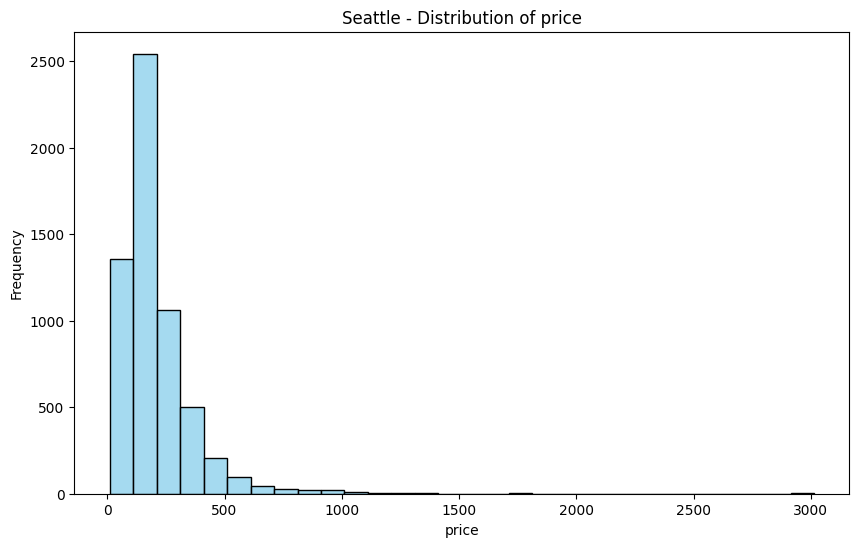

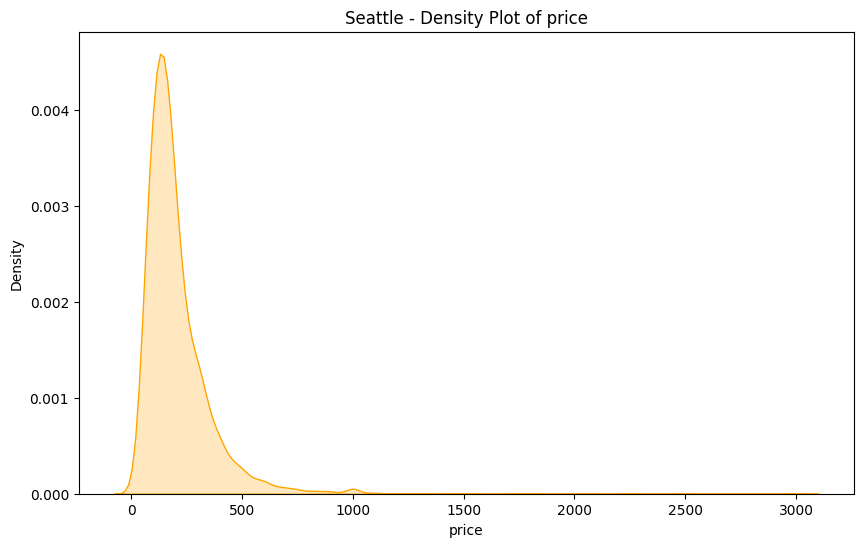

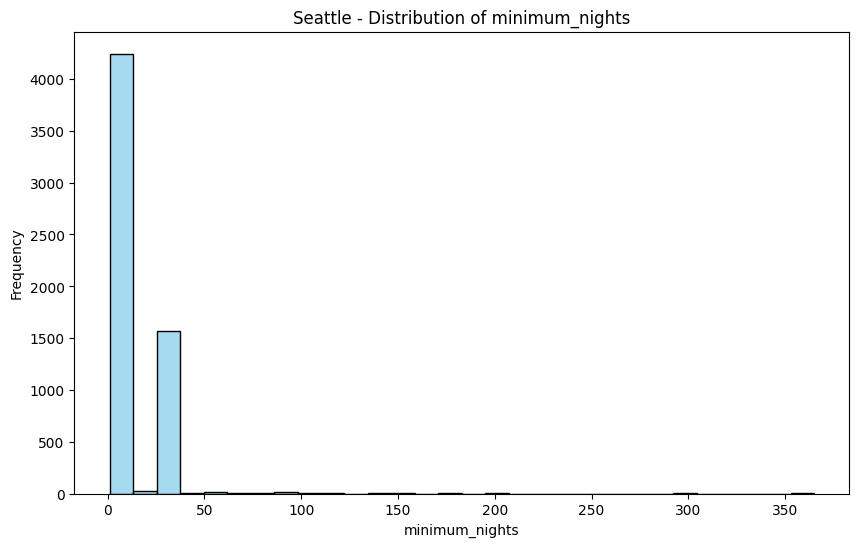

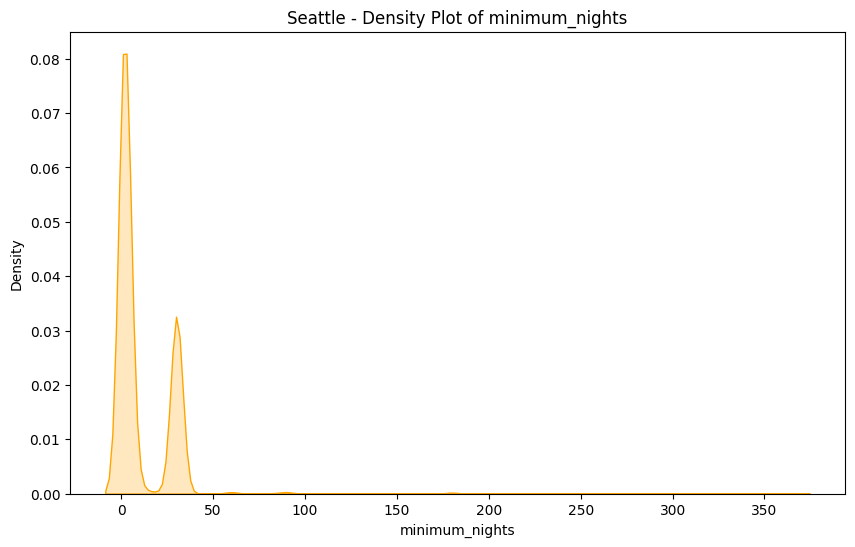

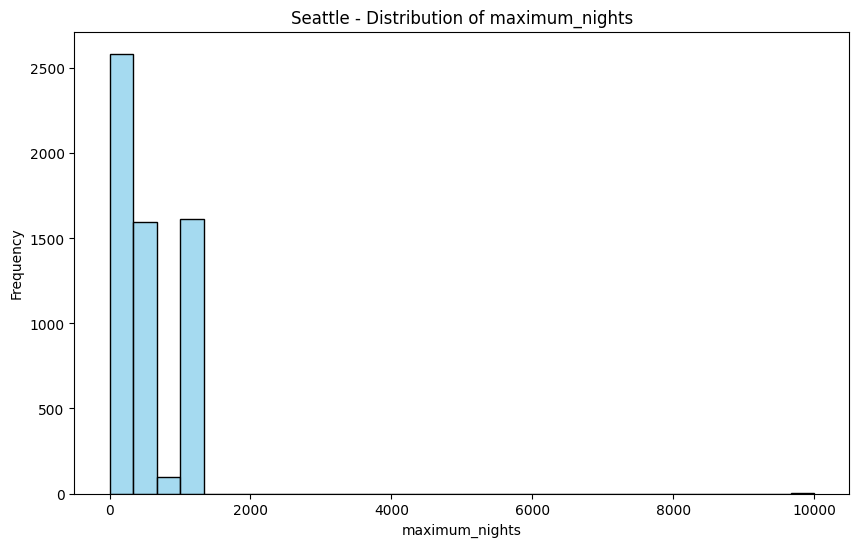

...

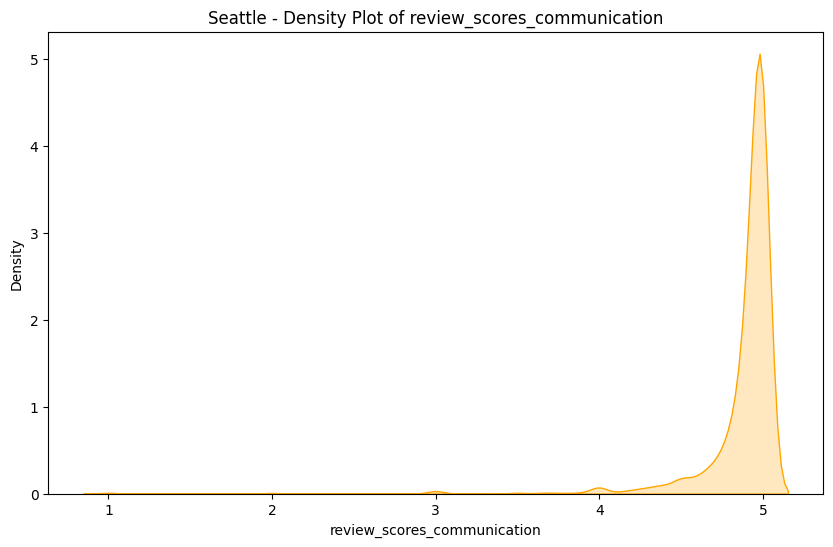

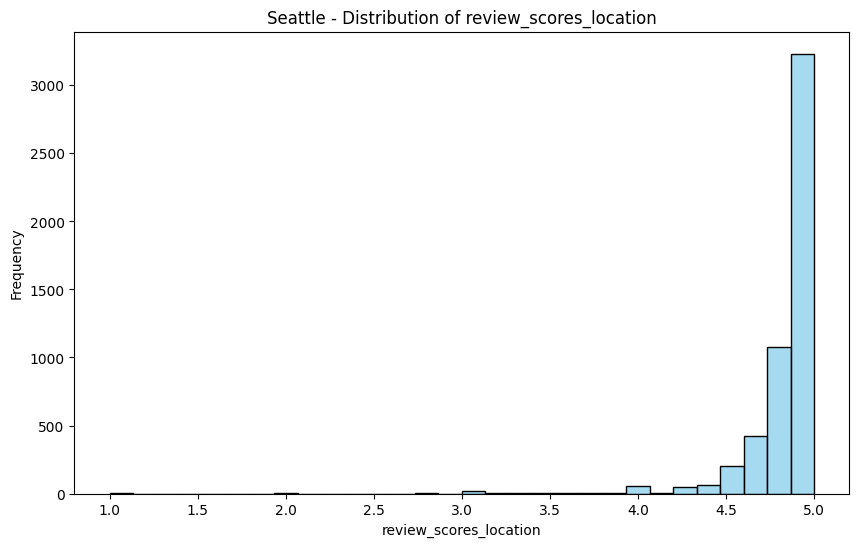

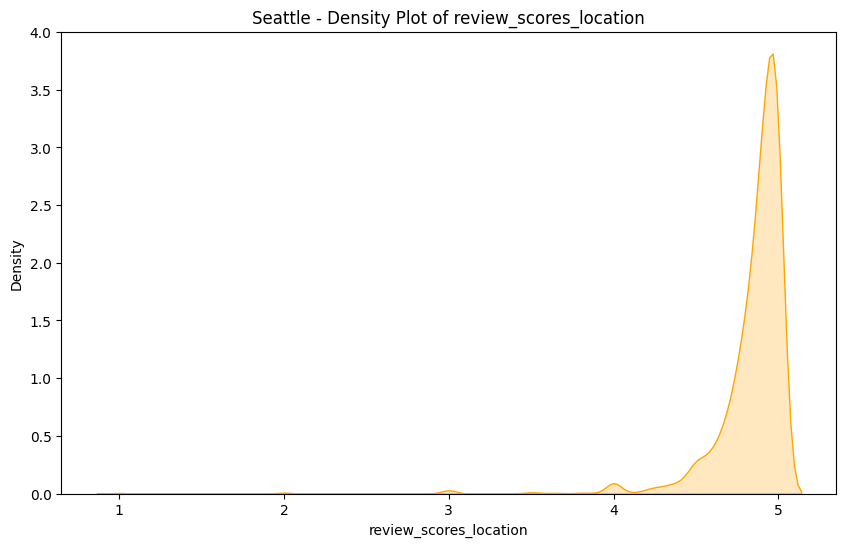

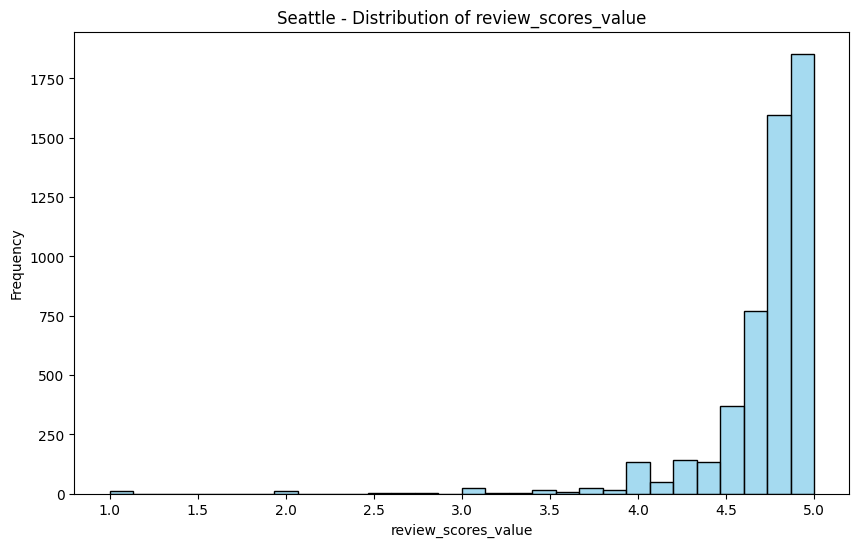

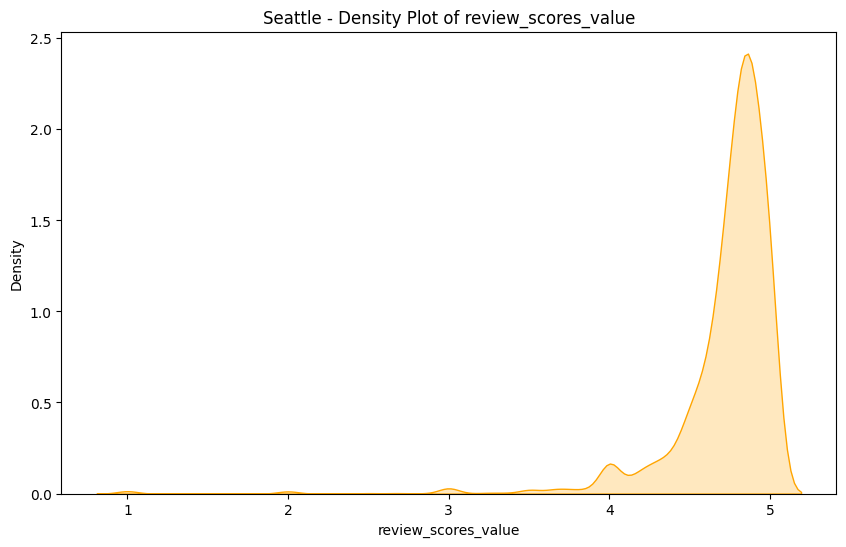


===== Plotting Distributions for SanFrancisco =====


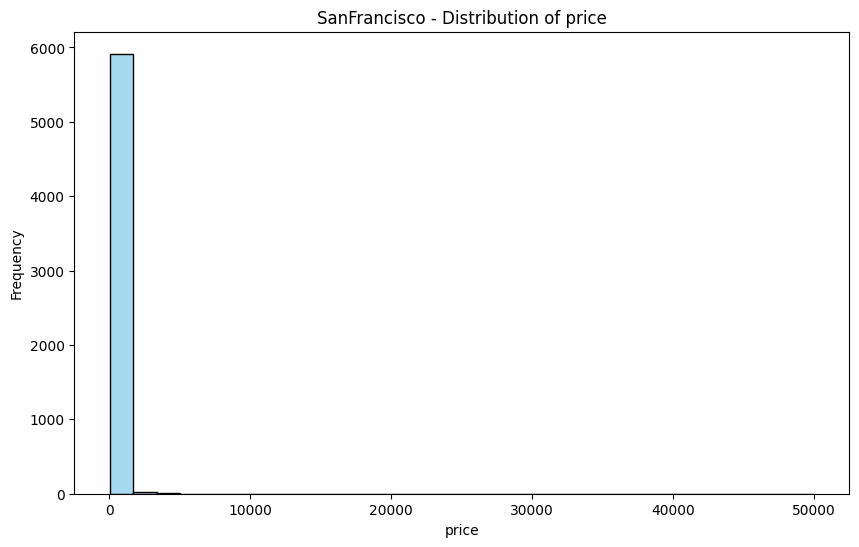

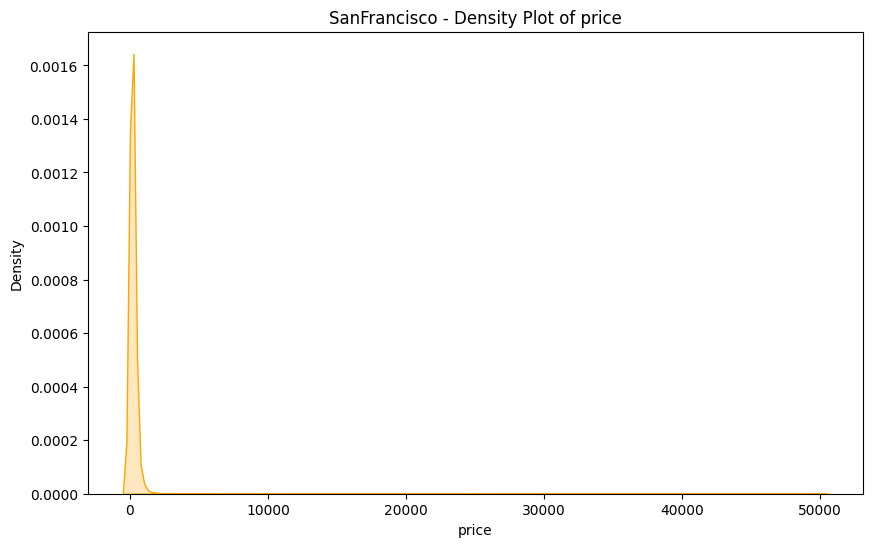

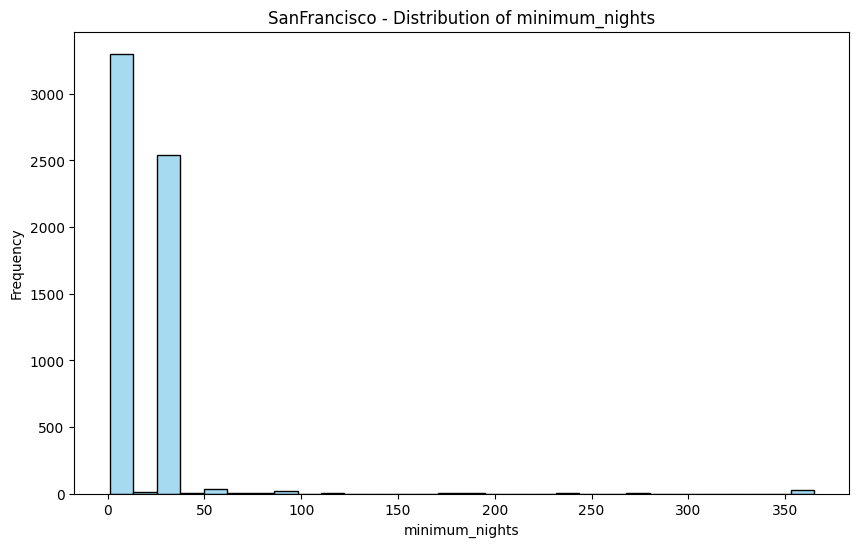

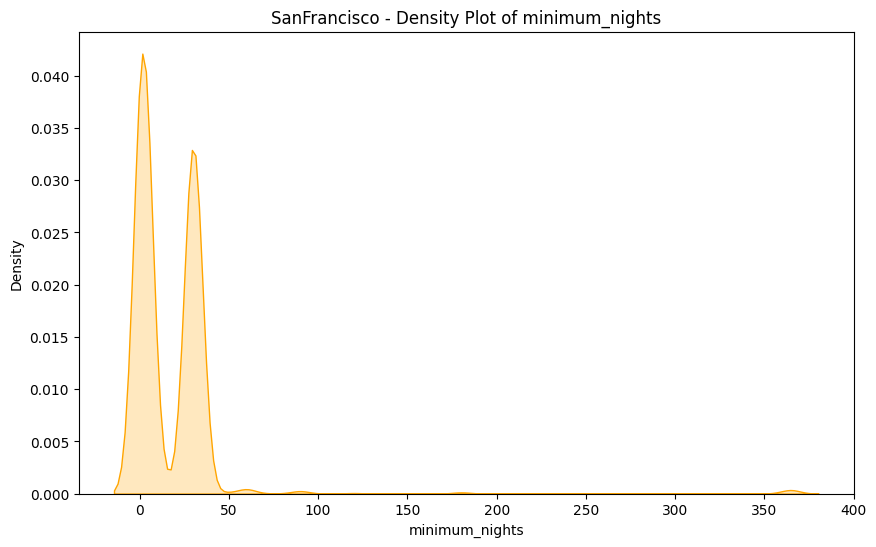

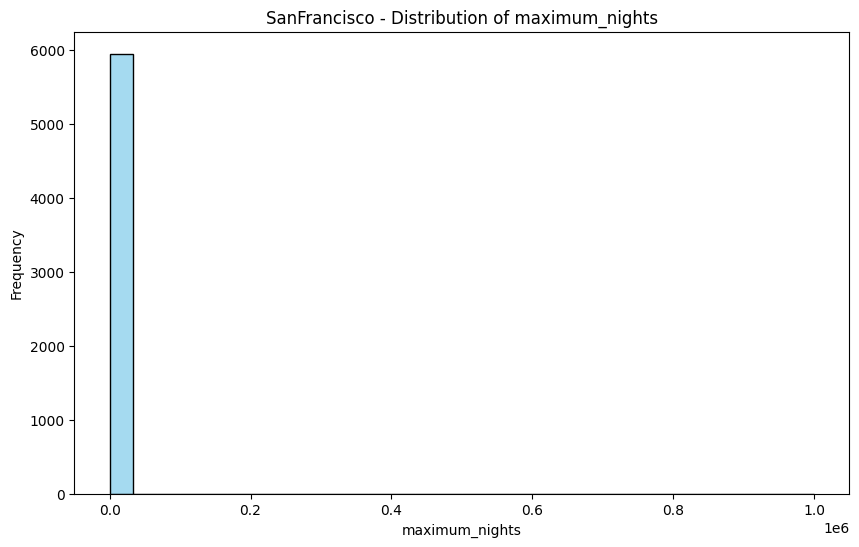

...

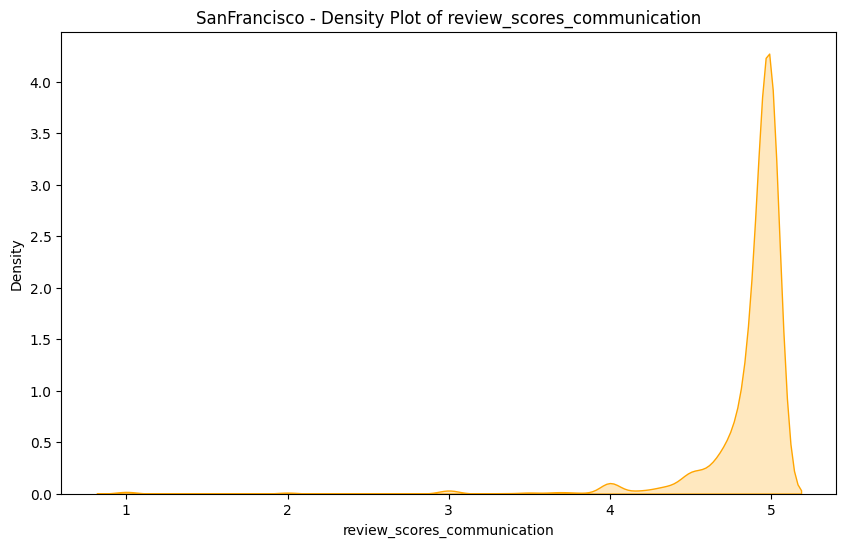

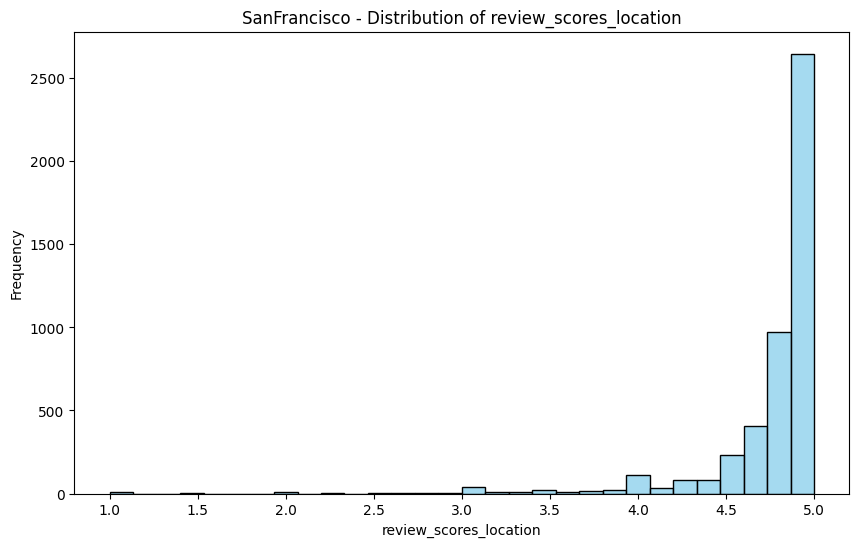

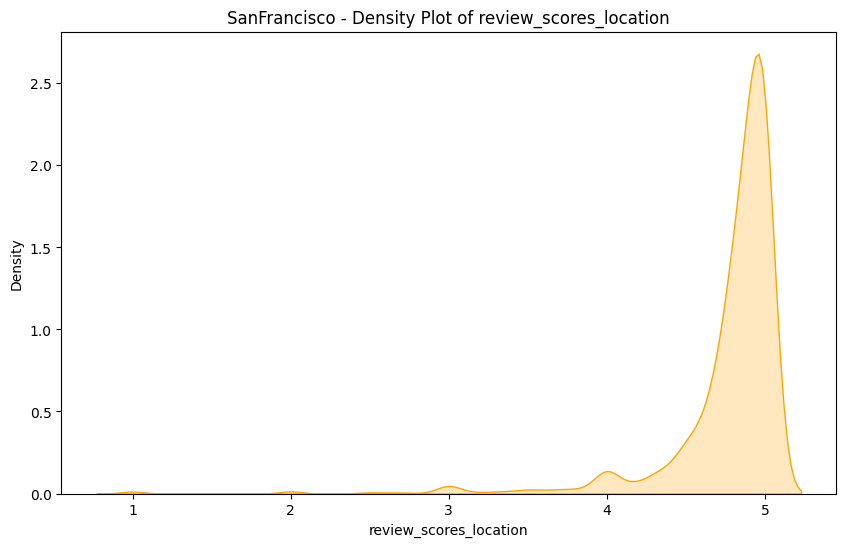

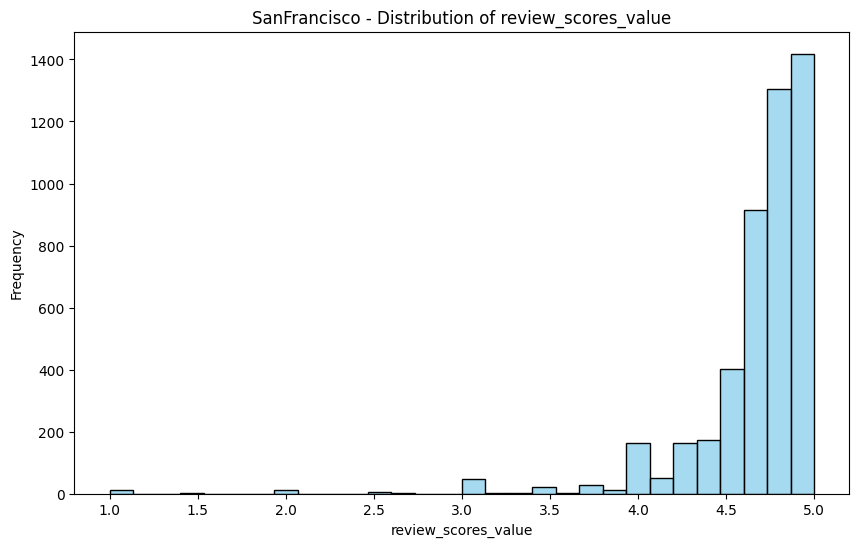

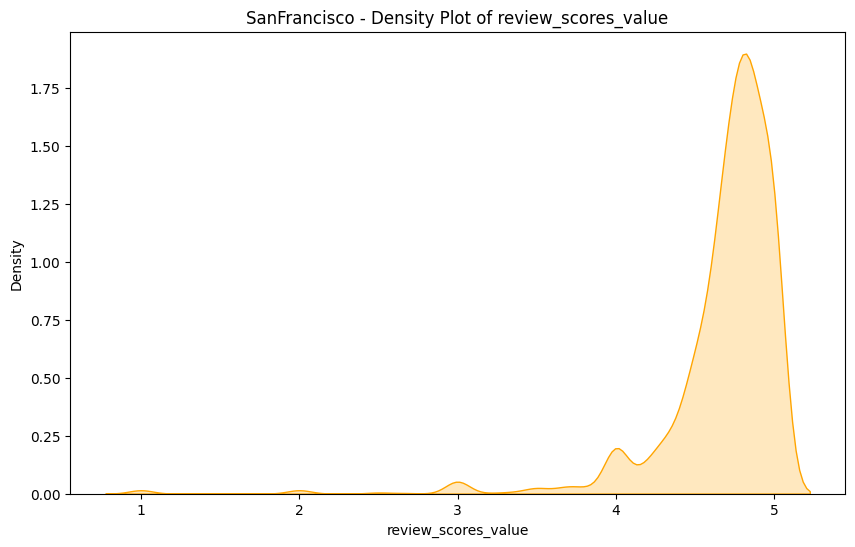


===== Plotting Distributions for NewYorkCity =====


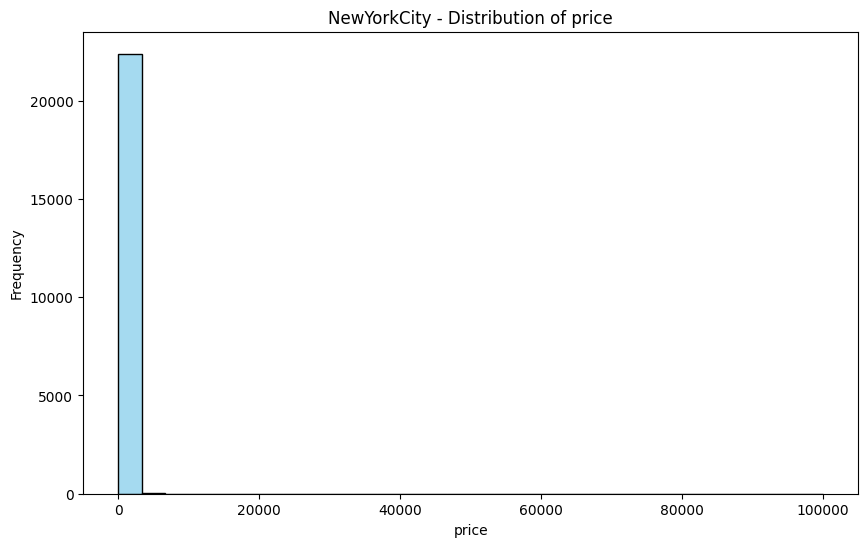

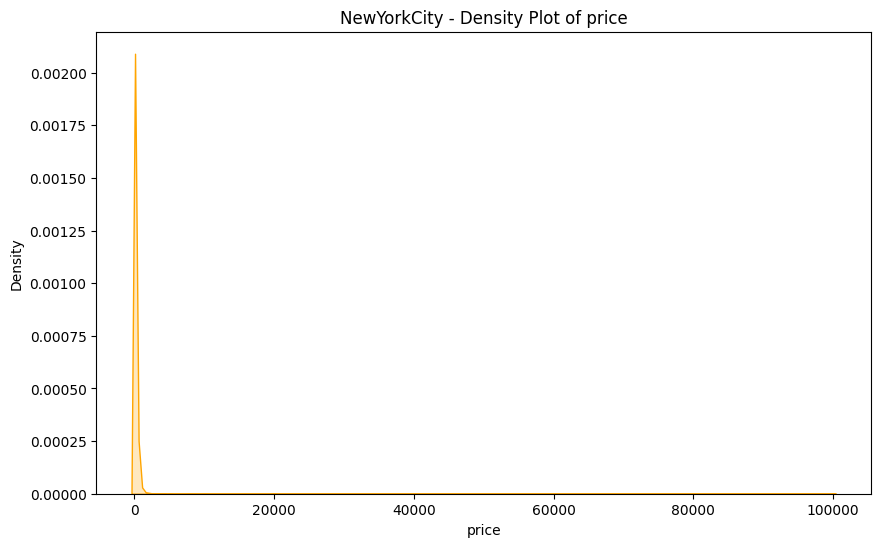

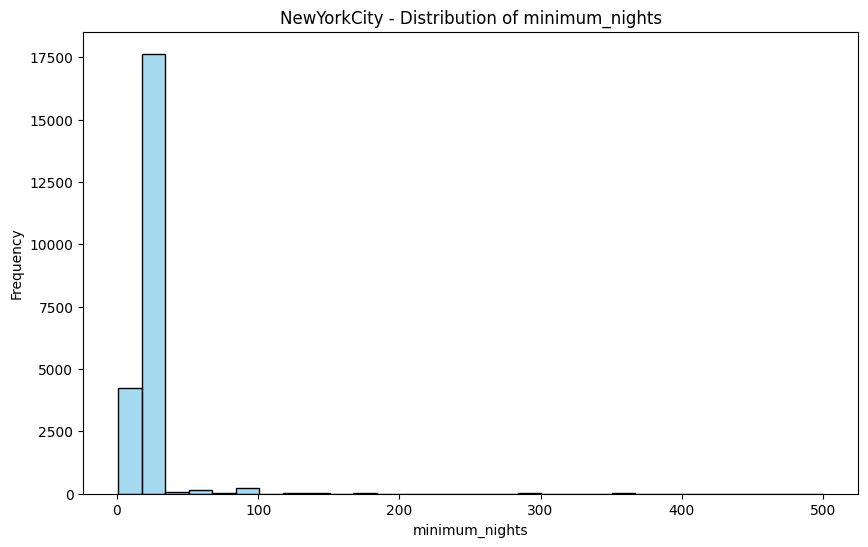

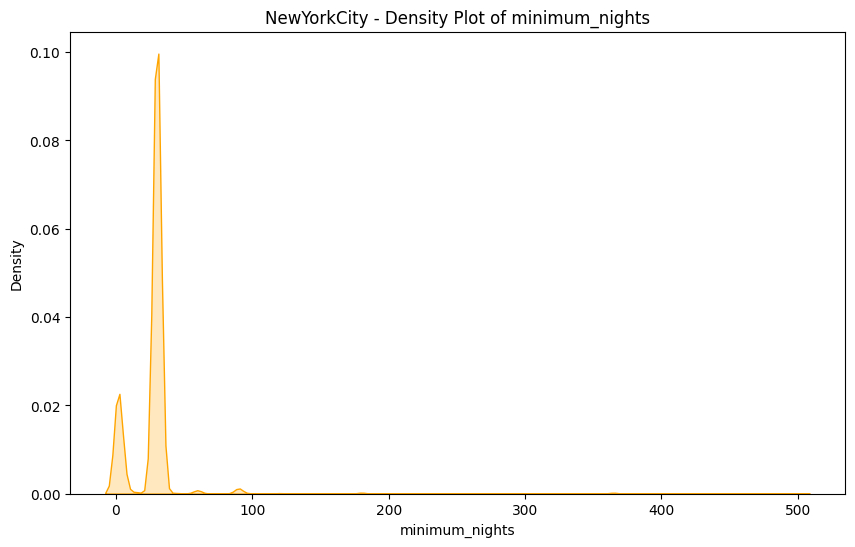

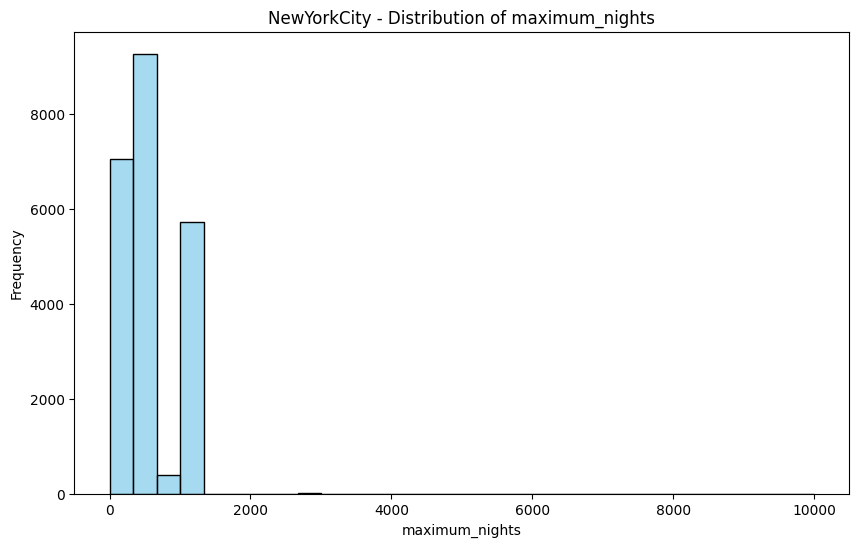

...

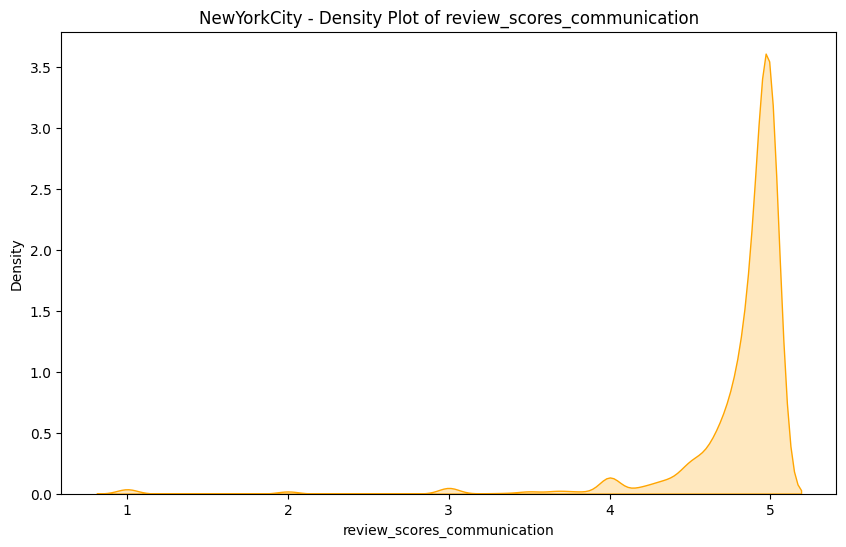

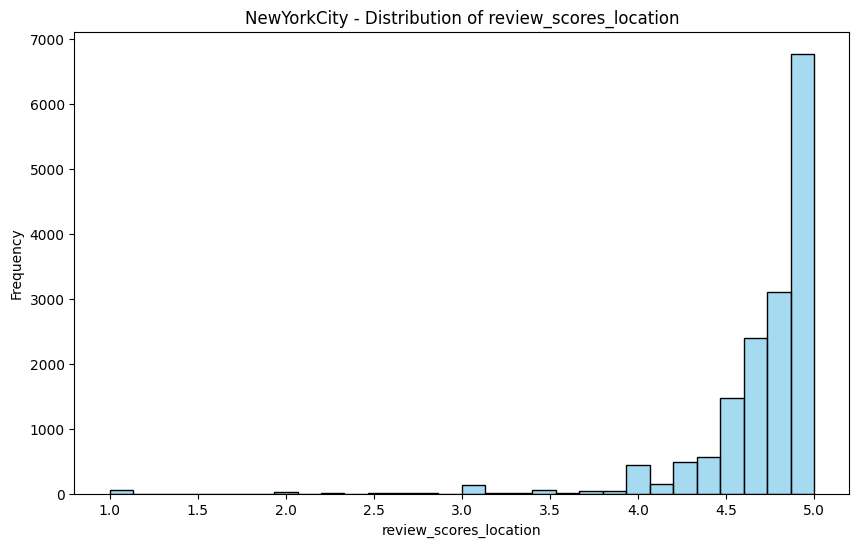

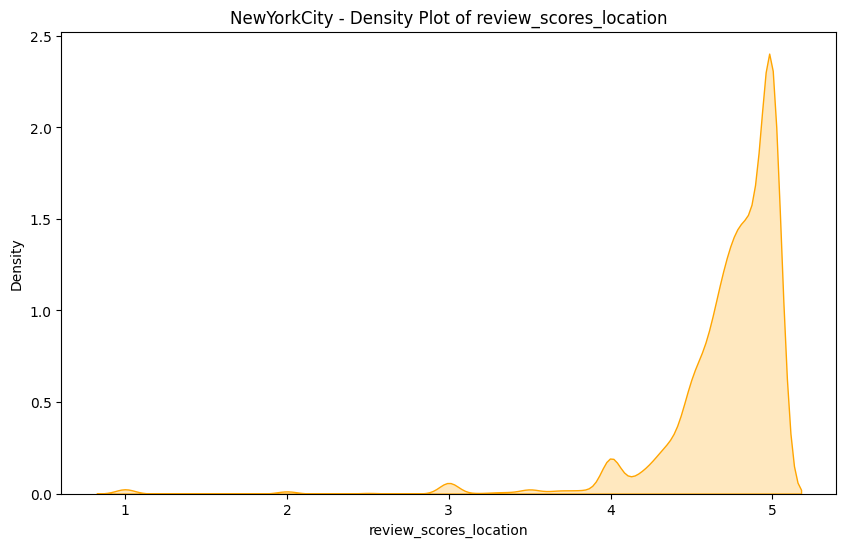

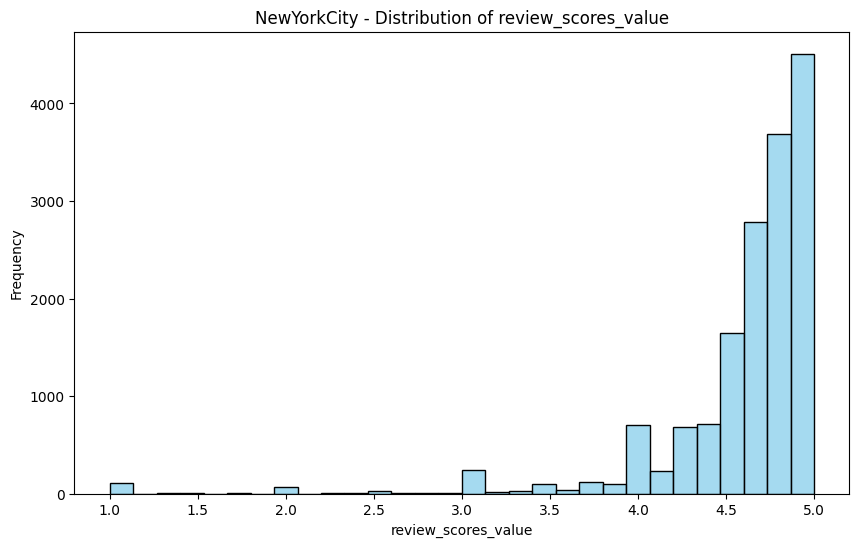

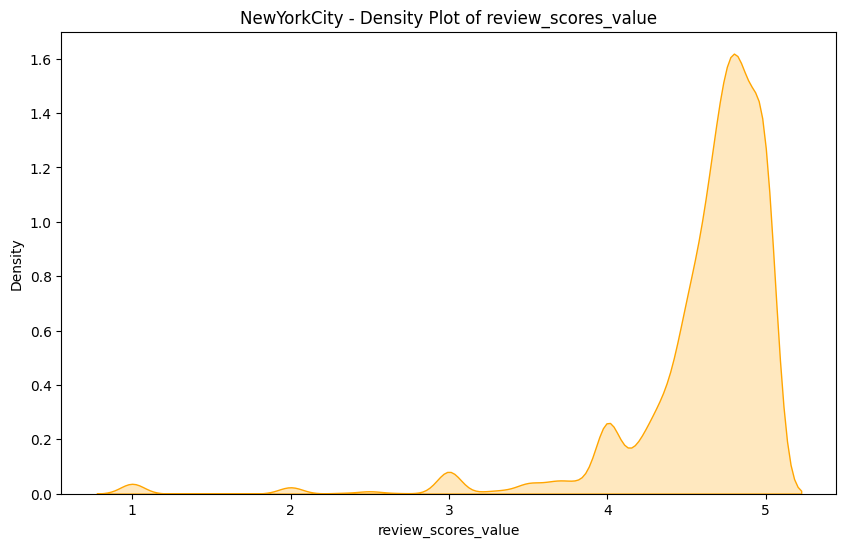


===== Plotting Distributions for Hawaii =====


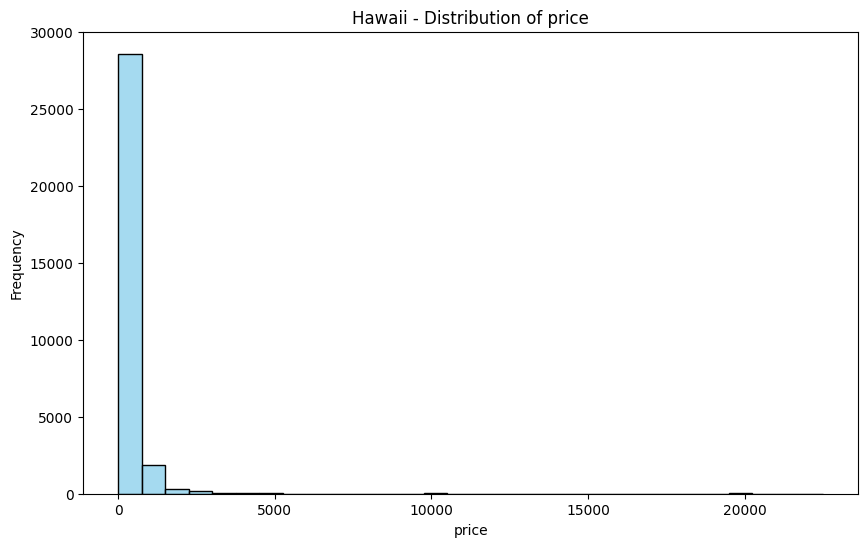

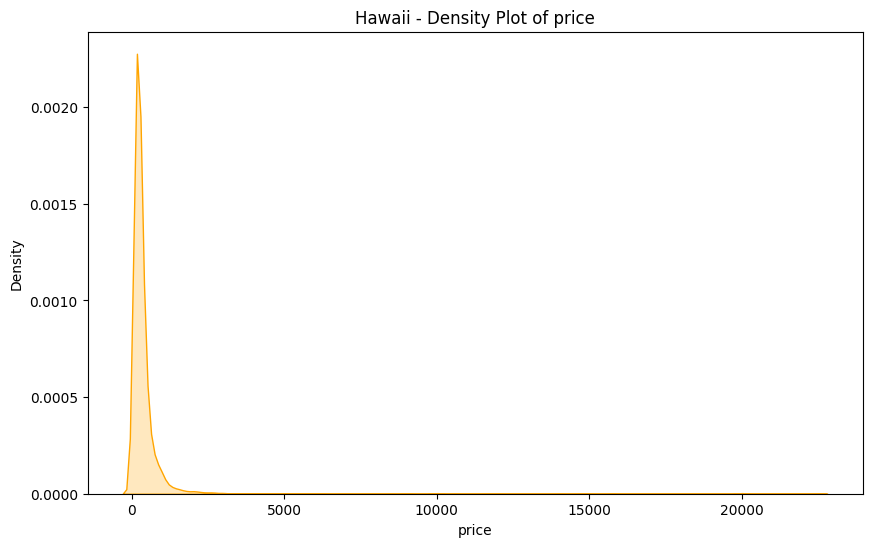

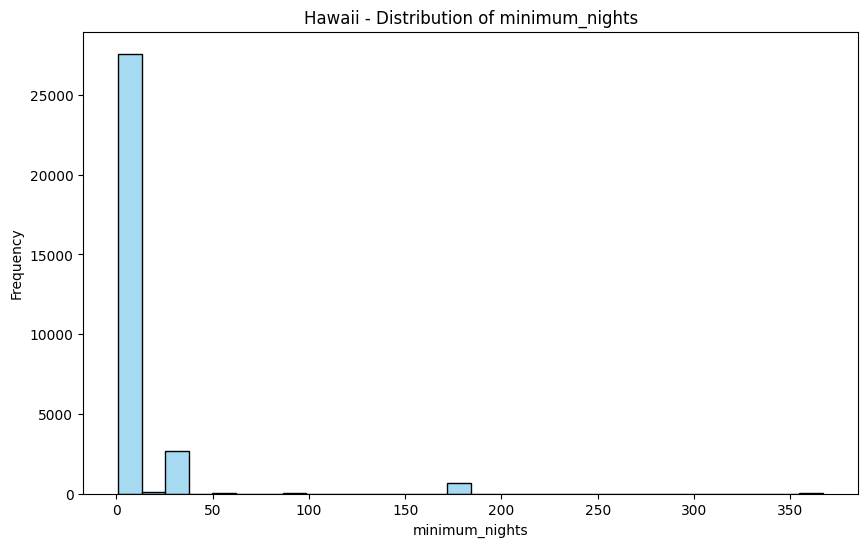

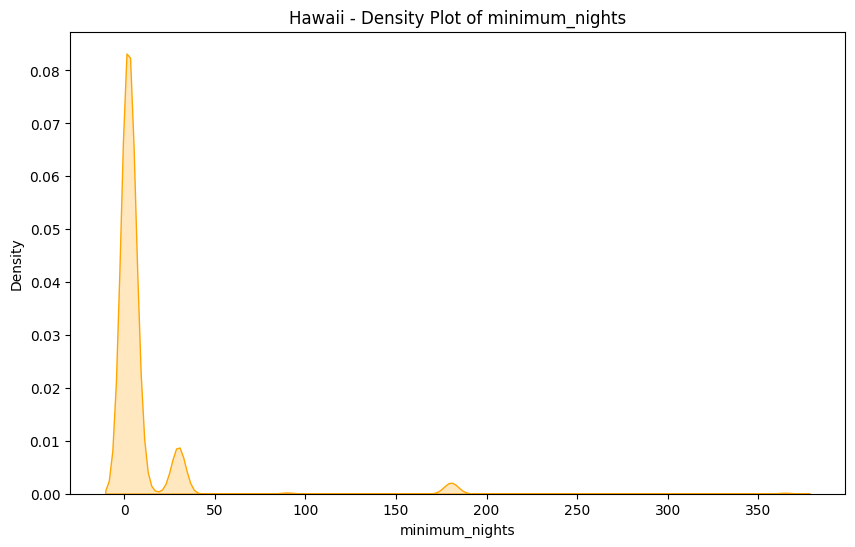

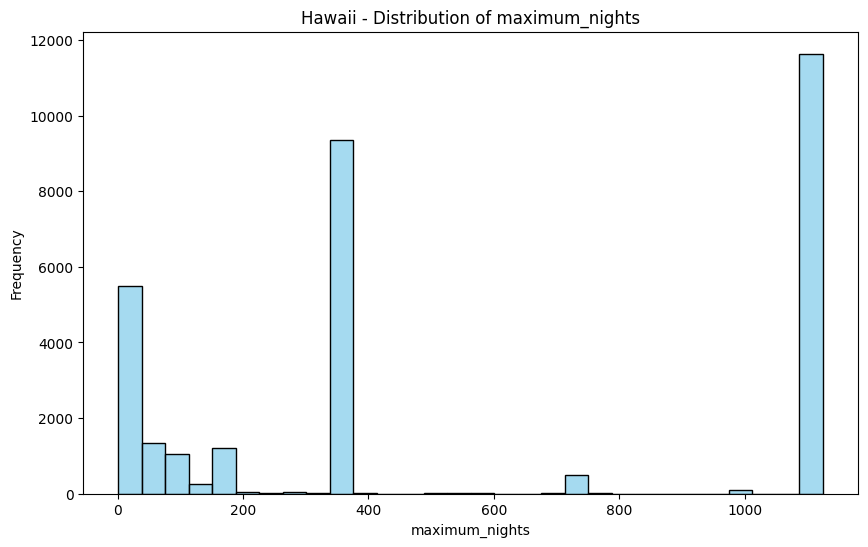

...

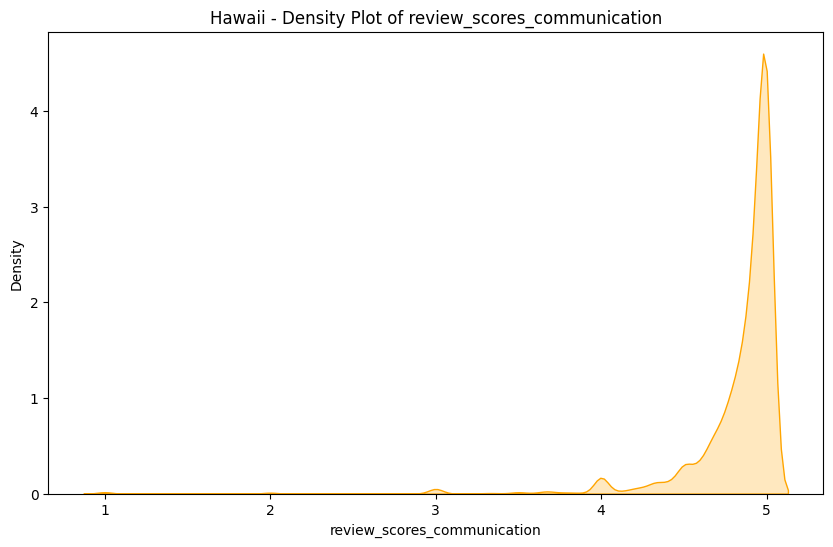

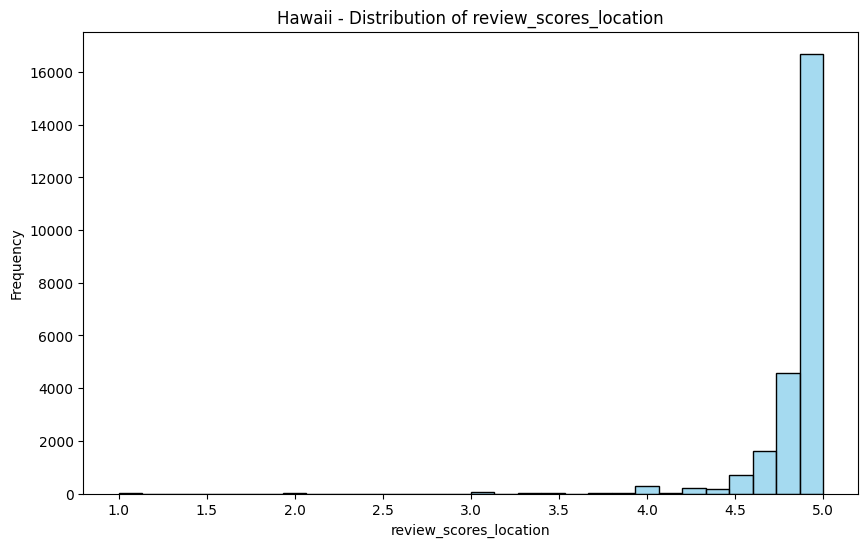

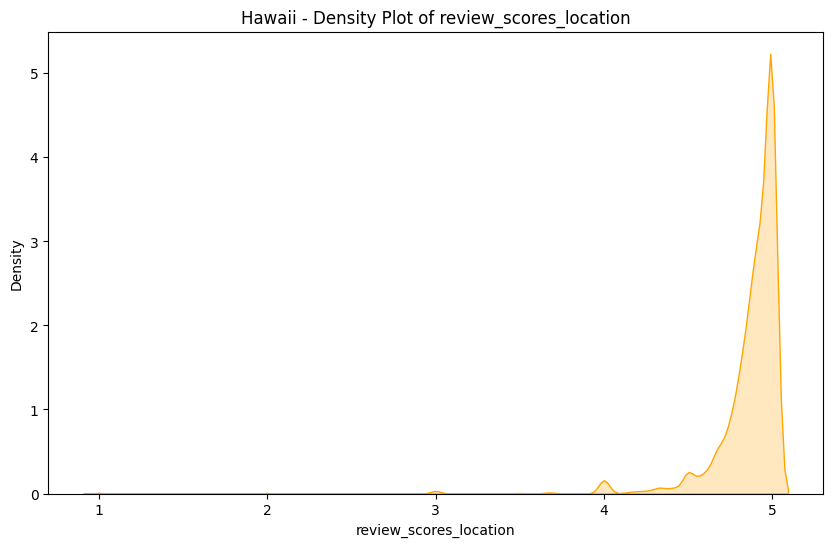

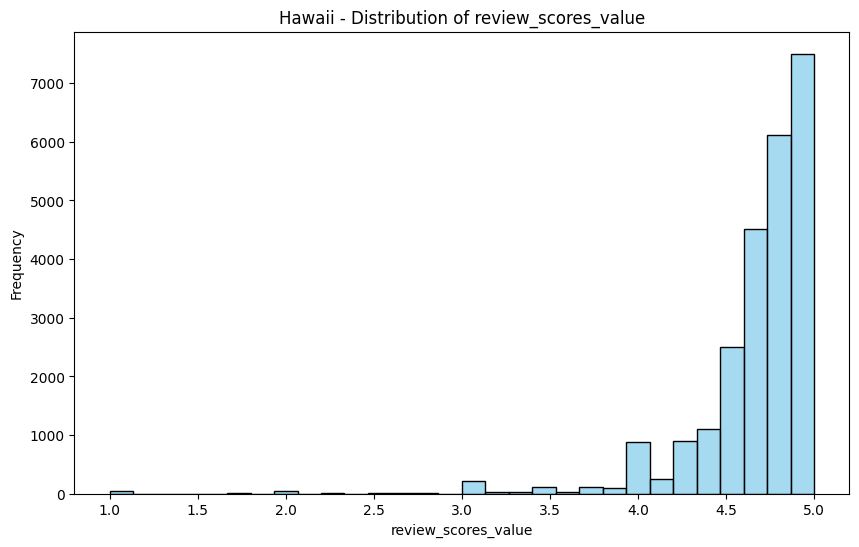

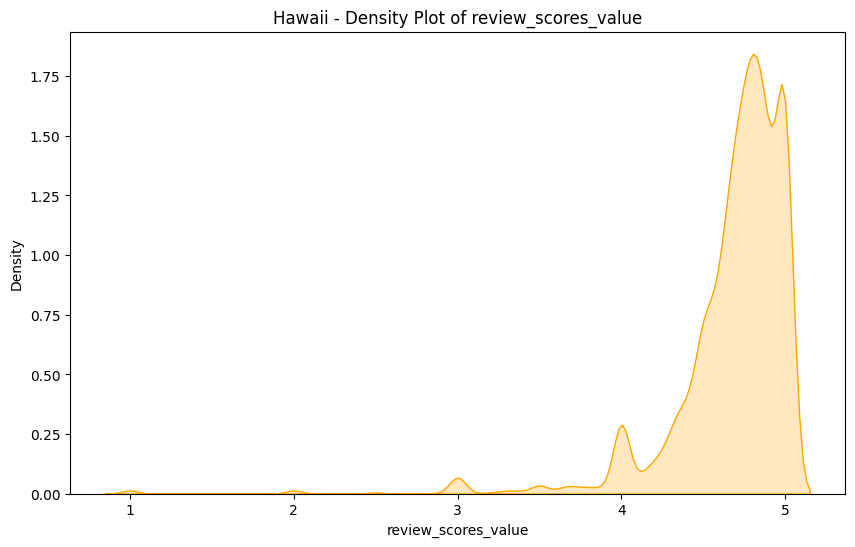


===== Plotting Distributions for Boston =====


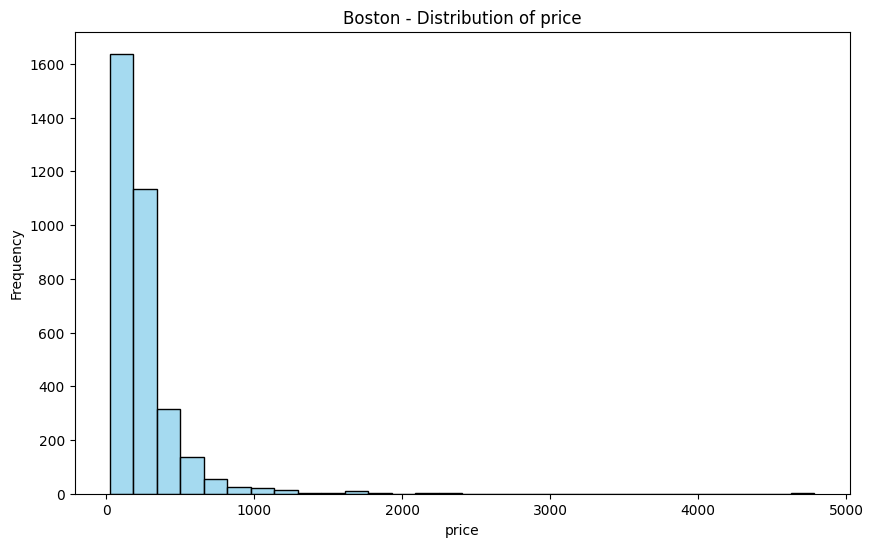

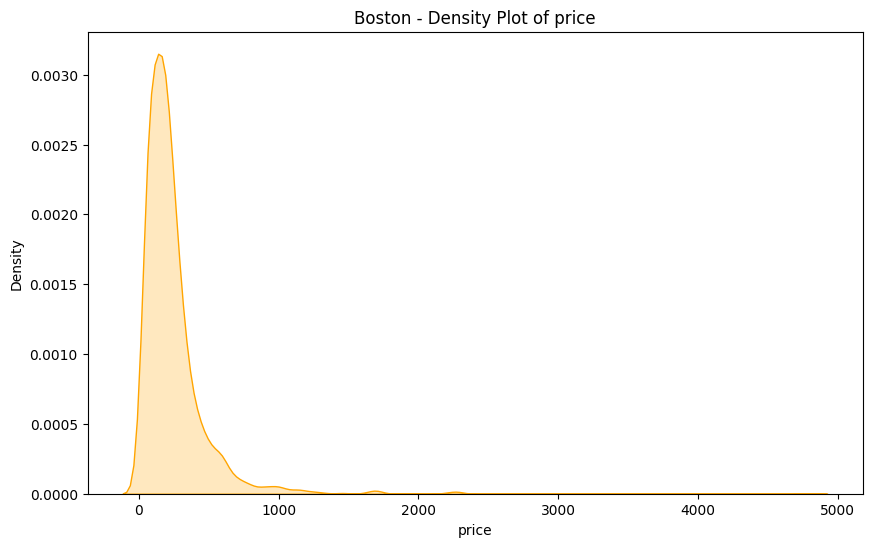

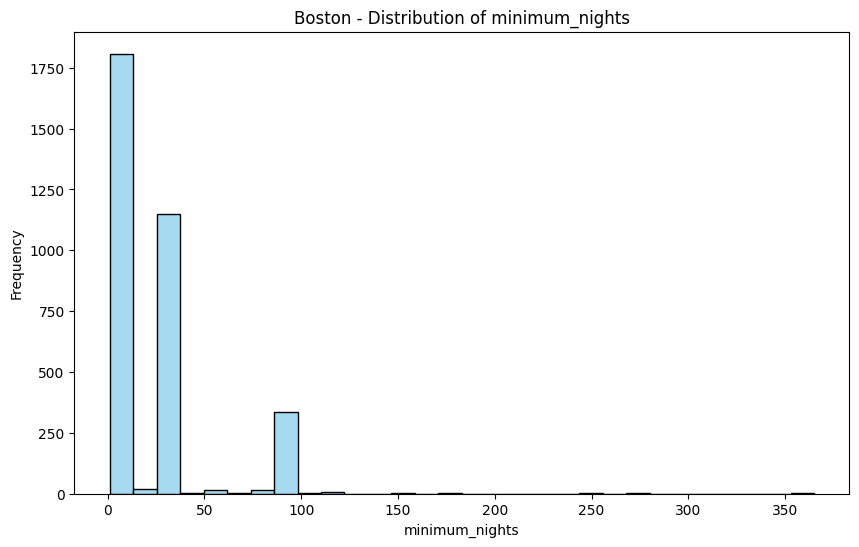

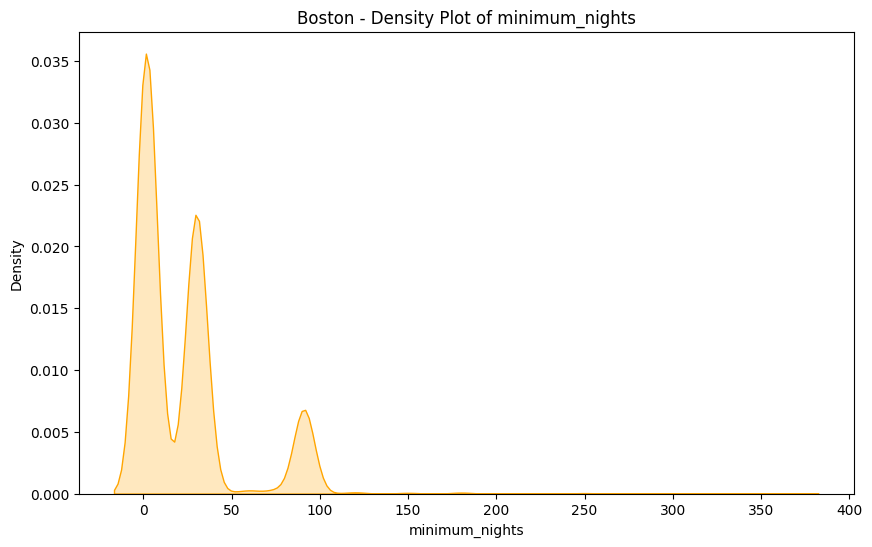

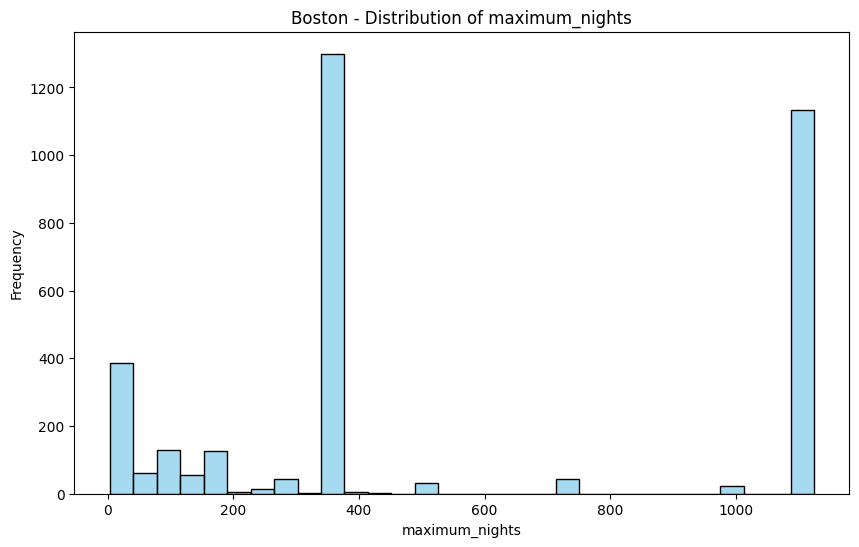

...

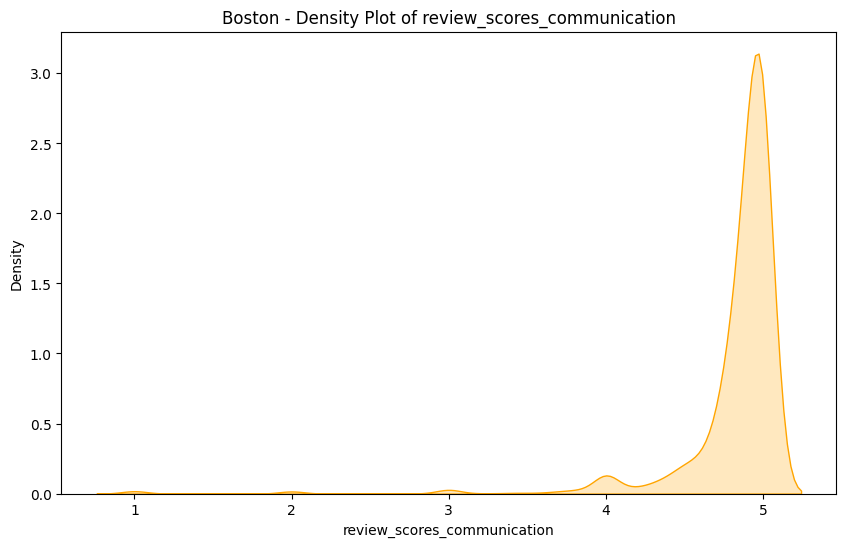

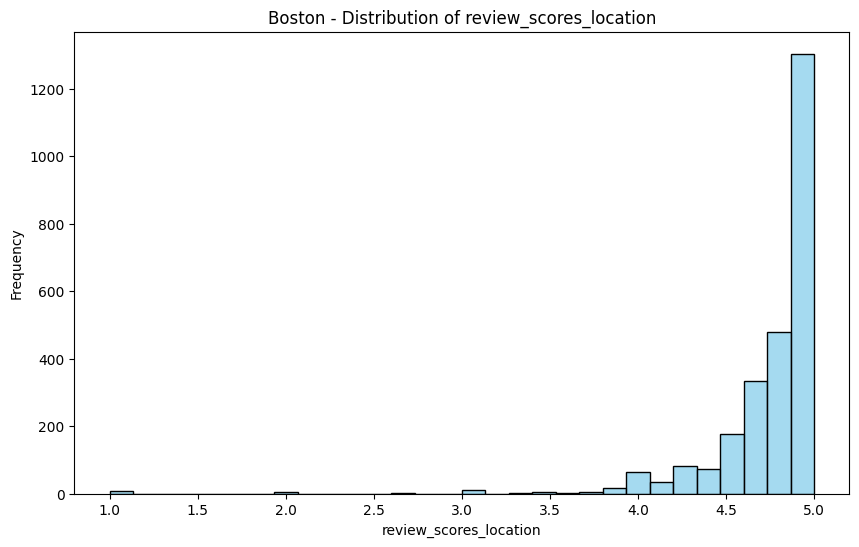

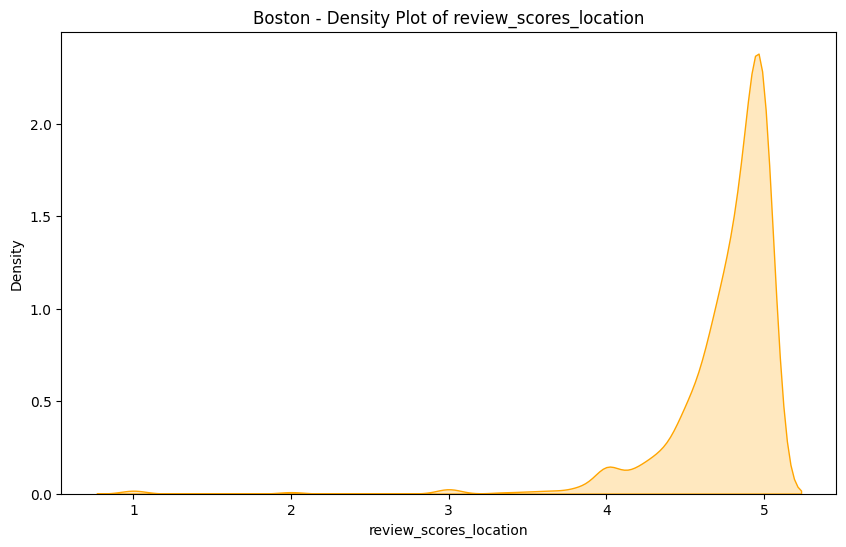

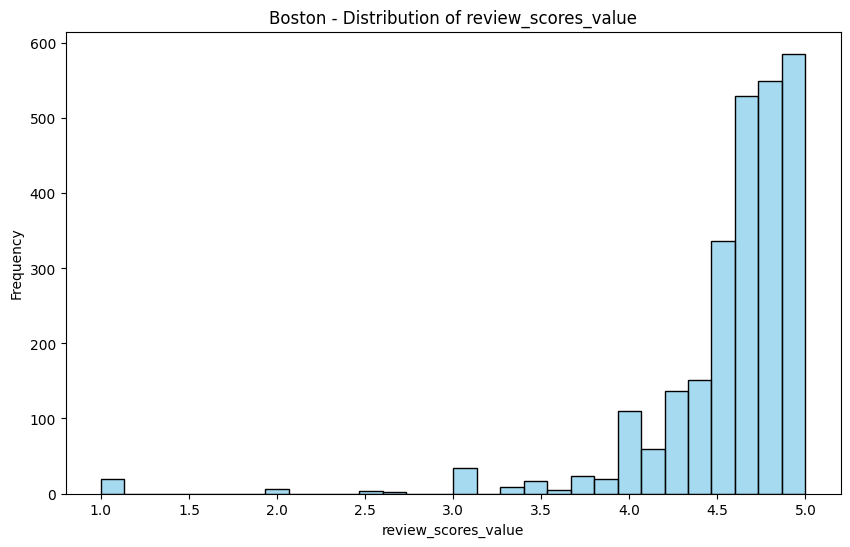

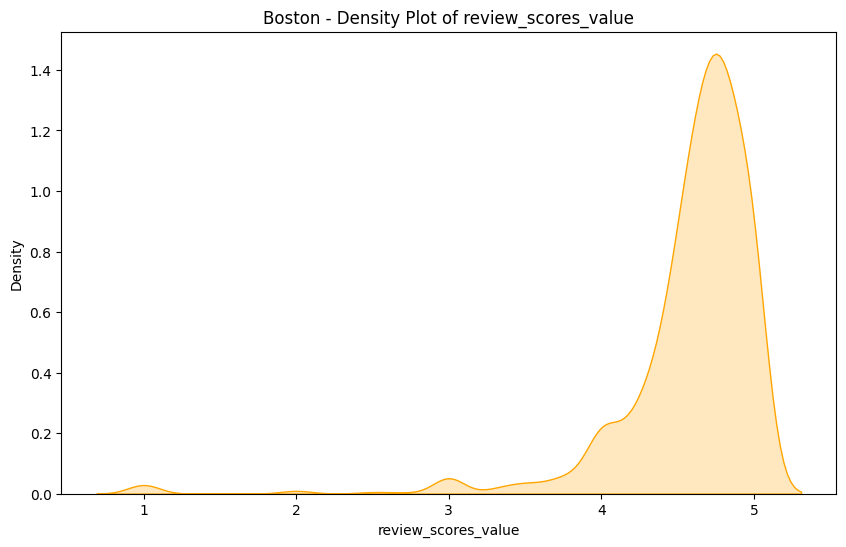

In [18]:
"""
2.) Distribution Analysis

Plotting histograms and density plots for key numerical features

Focus on pricde, min/max nights, and varios review attributes
"""

# Features to be used for plotting
distribution_columns = [
    'price', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
    'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
    'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value'
]

# Plots histograms and density plots for the specified features
def plot_distributions(cities, columns):
    for city, dfs in cities.items():
        print(f"\n===== Plotting Distributions for {city} =====")
        listings_price_based_df = dfs['listings_price_based_df'] # Using price based df for each city

        for column in columns:
            plt.figure(figsize=(10,6))
            # Histograms

            # Plot histogram of the feature
            sns.histplot(listings_price_based_df[column].dropna(), bins=30, kde=False, color='skyblue')
            plt.title(f"{city} - Distribution of {column}")
            plt.xlabel(column)
            plt.ylabel('Frequency')
            plt.show()

            # Plots Density plot of the feature
            plt.figure(figsize=(10, 6))
            sns.kdeplot(listings_price_based_df[column].dropna(), fill=True, color='orange')
            plt.title(f"{city} - Density Plot of {column}")
            plt.xlabel(column)
            plt.ylabel('Density')
            plt.show()

plot_distributions(city_dfs, distribution_columns)

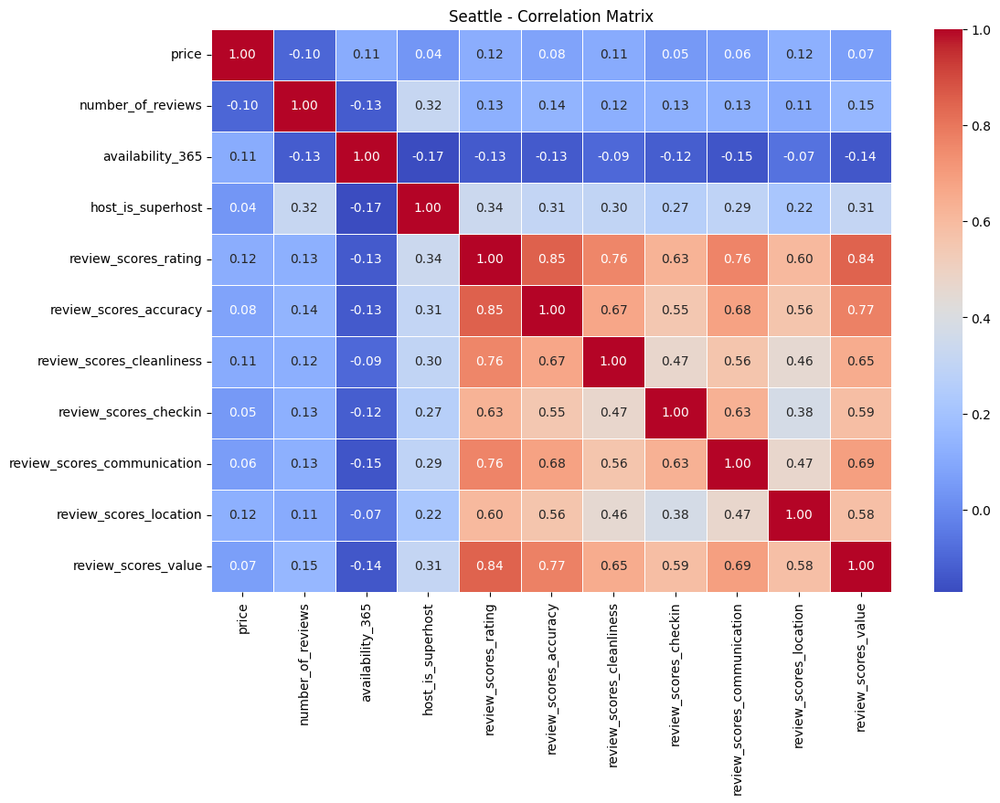

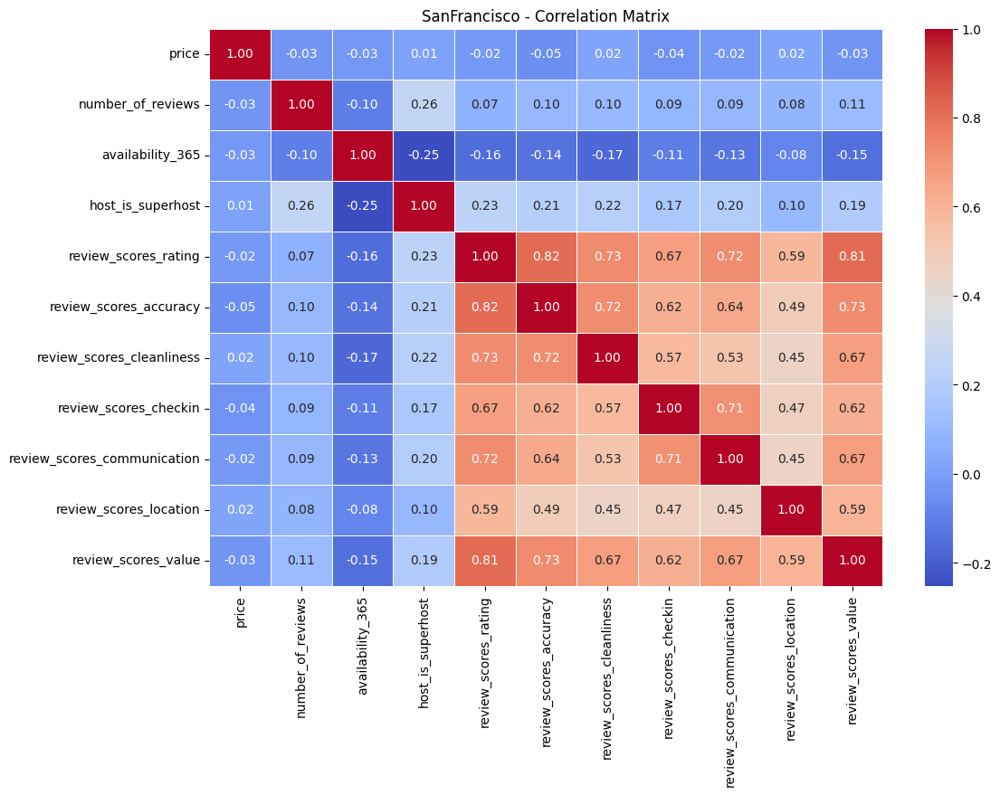

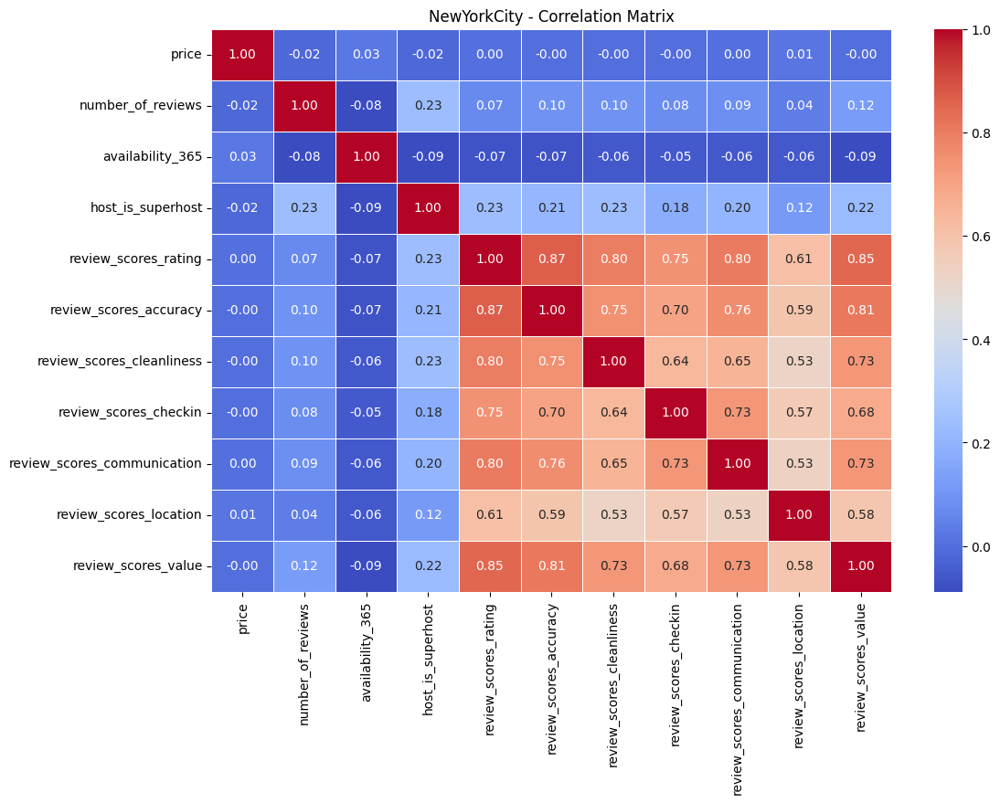

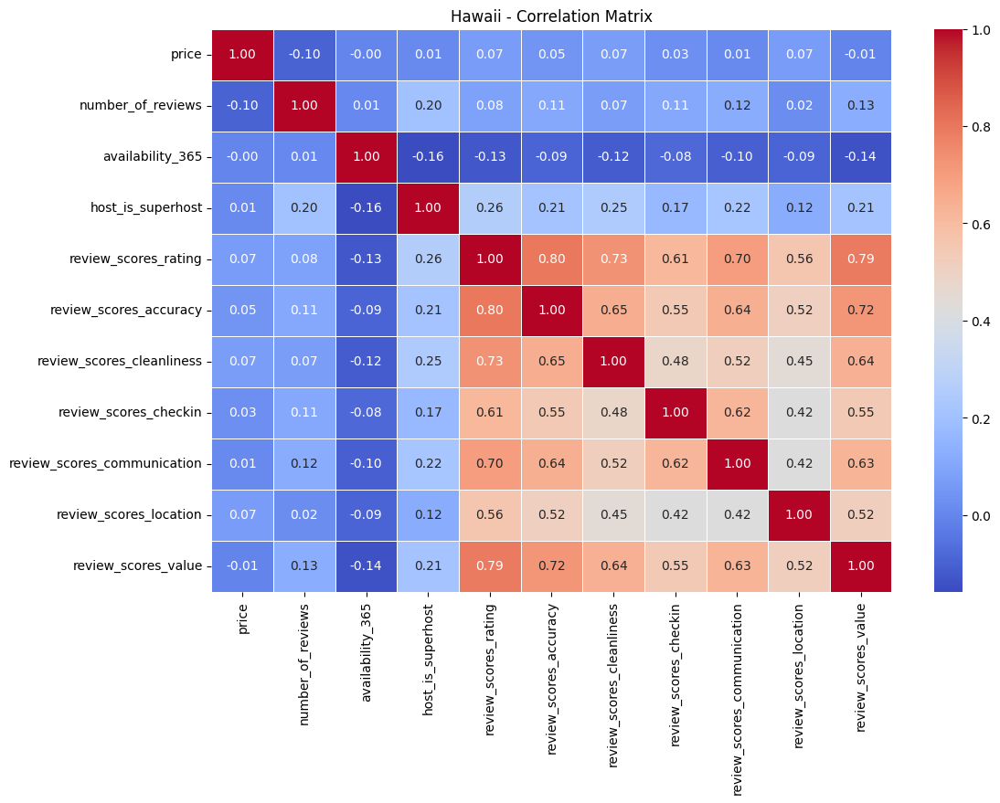

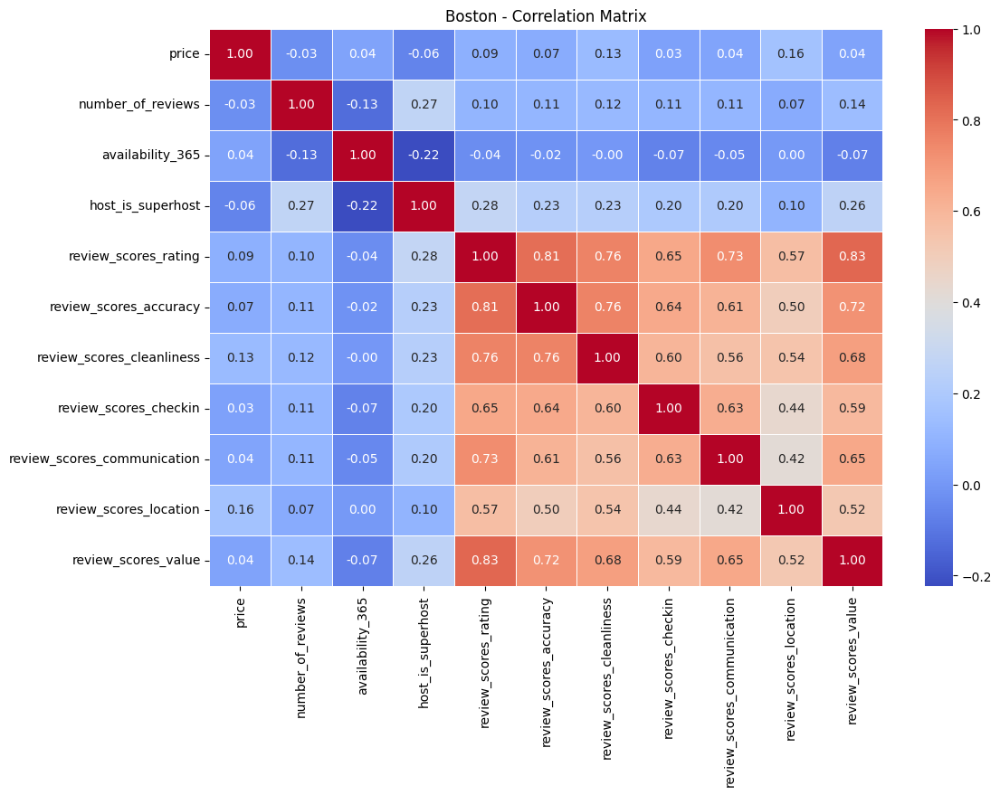

In [19]:
"""
3.) Correlation Analysis

Creating correlation matrix to explore relationships

Focus on price, various review features, and availability via plots

Categorical variables property type, neighborhood, and room type are presented as text only
"""
# Plot correlation matrix for specified columns
def plot_correlations_matrix(cities, columns):
    for city, dfs in cities.items():

        # Get the proper df from this city
        listings_price_based_df = dfs['listings_price_based_df']

        # Calculate correlations
        correlation_matrix = listings_price_based_df[columns].corr().round(3)

        # Save correlations data for future reference
        correlation_matrix.to_csv(f"{city}_task3_main.csv")

        # Heatmap representation of correlation matrix
        plt.figure(figsize=(12,8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
        plt.title(f"{city} - Correlation Matrix")
        plt.show()

def categorical_correlations(cities):
    for city, dfs in cities.items():
        # Need to make copy to encode without altering original
        listings_price_based_df = dfs['listings_price_based_df'].copy()

        # One hot encode categorical variables specified
        encoded_df = pd.get_dummies(listings_price_based_df, 
                                    columns=['room_type', 'property_type', 'neighbourhood_cleansed'], 
                                    drop_first=True)
        
        selected_columns = ['price', 'number_of_reviews', 'availability_365', 'host_is_superhost', 'review_scores_rating']
        
        # Need to also include the categorical variables, so extend it to them
        encoded_columns = [col for col in encoded_df.columns if col.startswith(('room_type_', 'property_type_', 'neighbourhood_cleansed_'))]
        selected_columns.extend(encoded_columns)

        correlation_matrix = encoded_df[selected_columns].corr().round(3)

        correlation_matrix.to_csv(f"{city}_task3_cat.csv")

# List of (numerical) features that are relevant to this analysis
correlation_columns = [
    'price', 'number_of_reviews', 'availability_365', 'host_is_superhost', 'review_scores_rating',
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value'
]

plot_correlations_matrix(city_dfs, correlation_columns)
categorical_correlations(city_dfs)

<Figure size 1200x600 with 0 Axes>

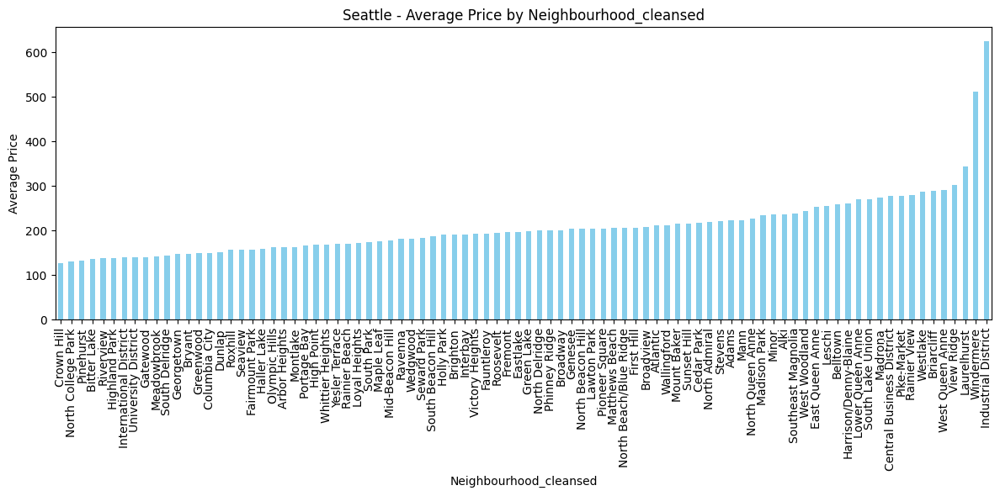

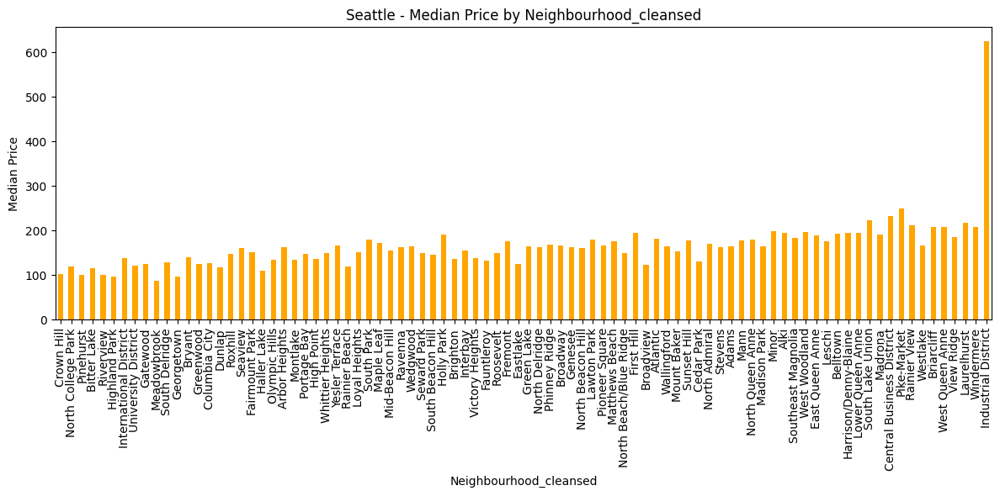

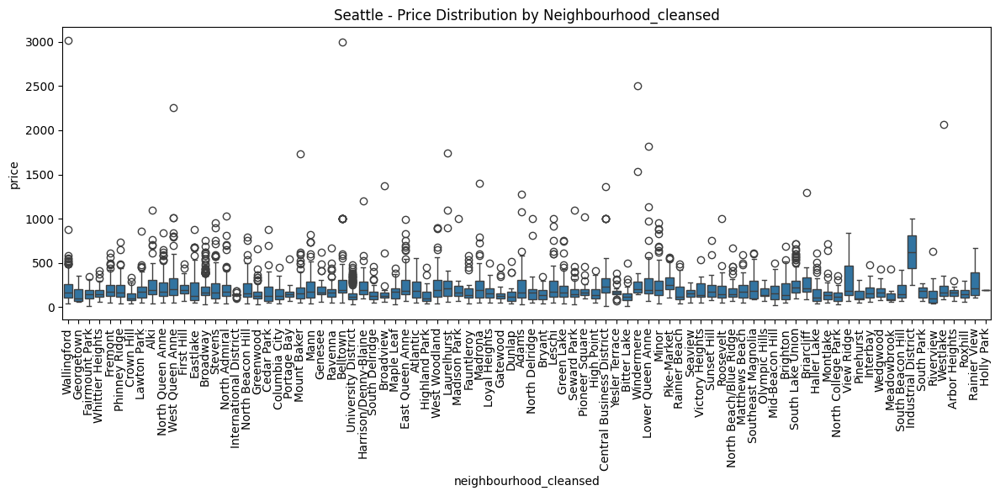

<Figure size 1200x600 with 0 Axes>

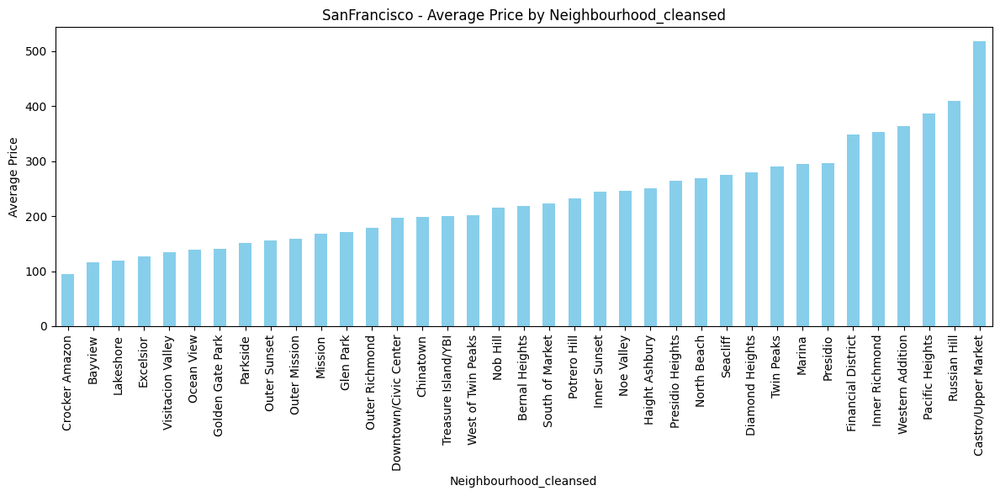

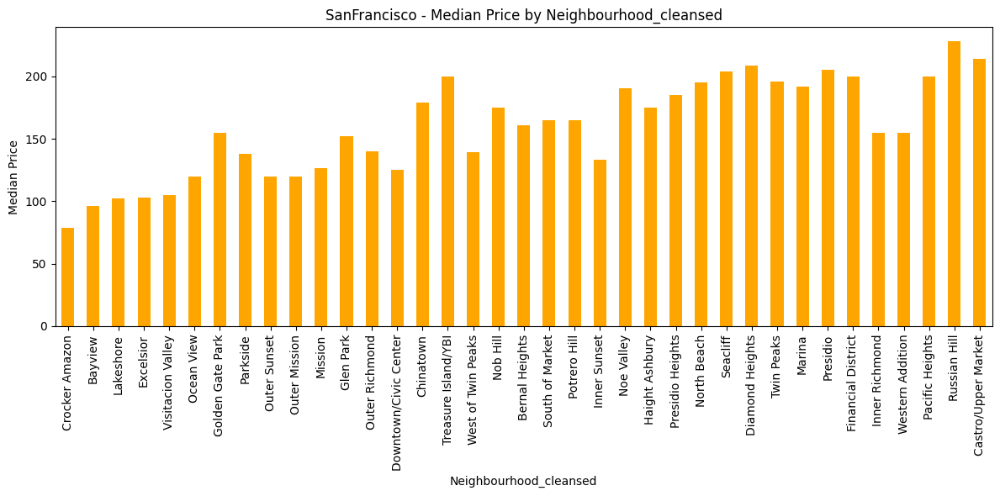

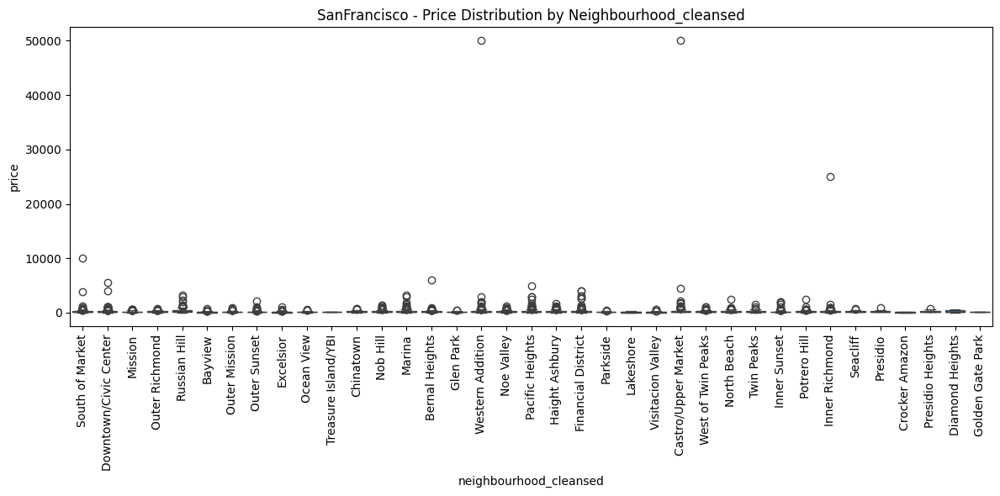

<Figure size 1200x600 with 0 Axes>

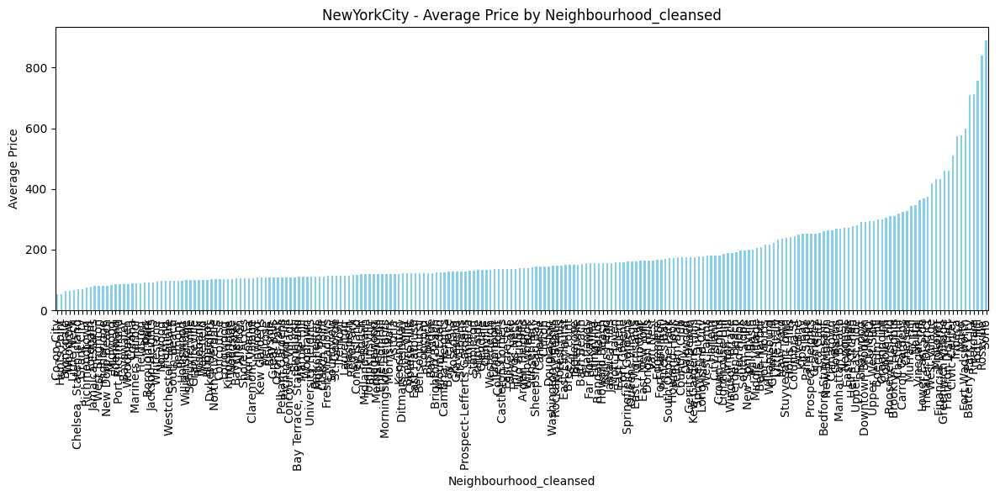

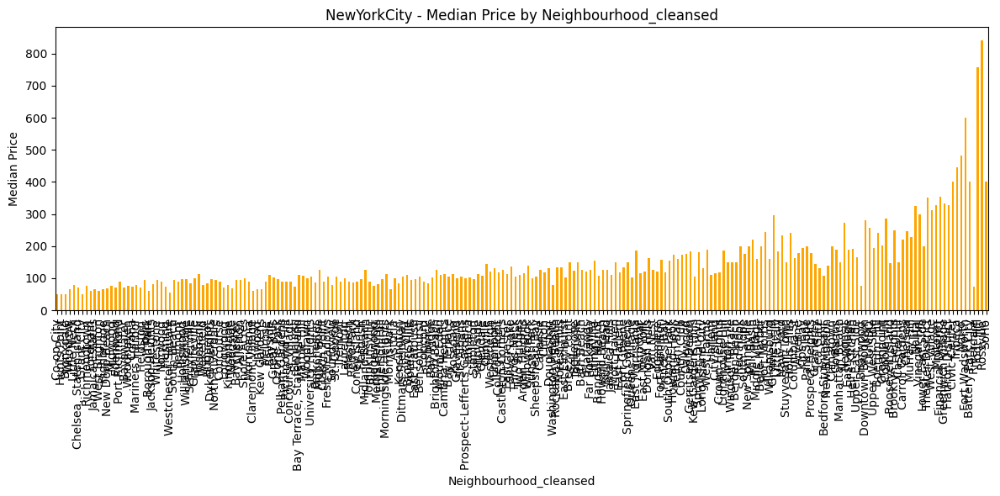

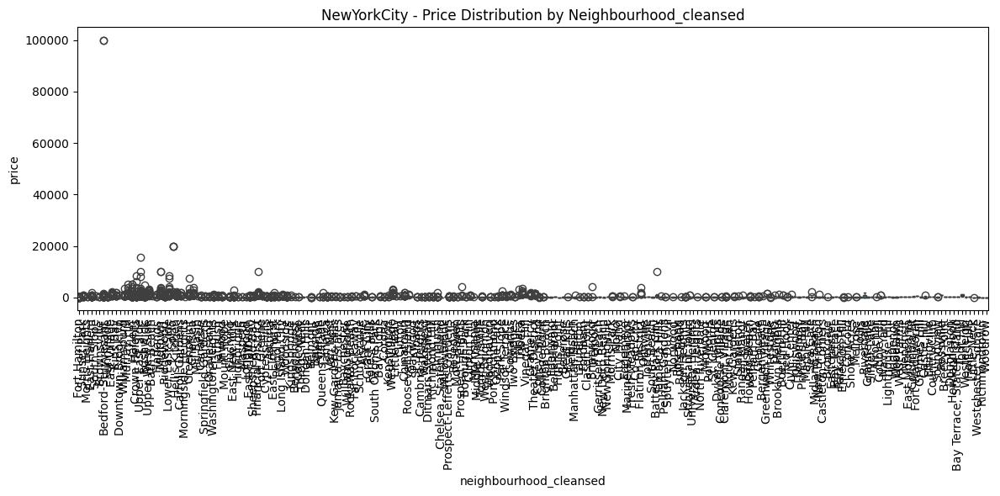

<Figure size 1200x600 with 0 Axes>

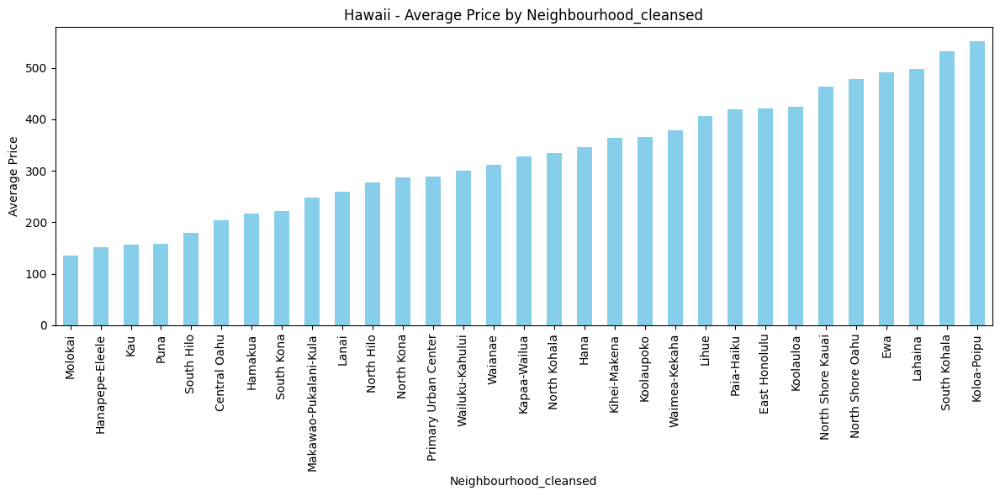

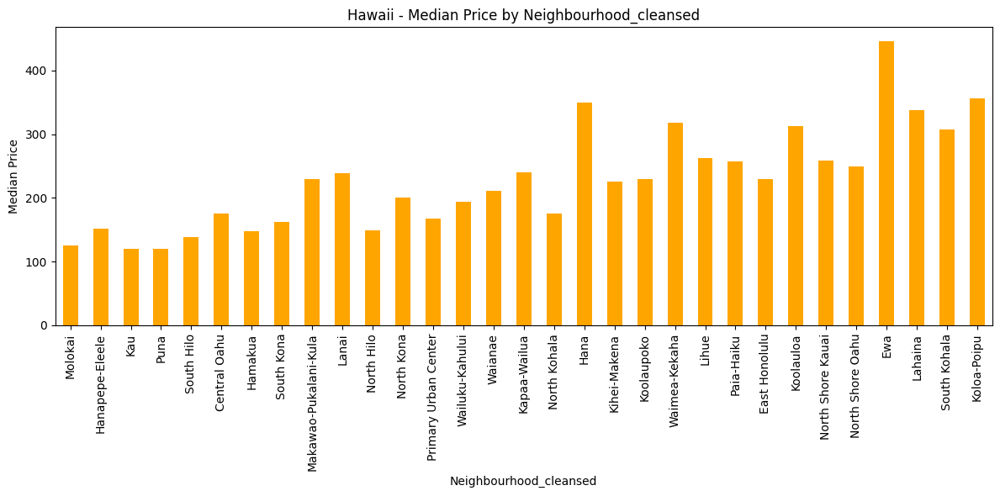

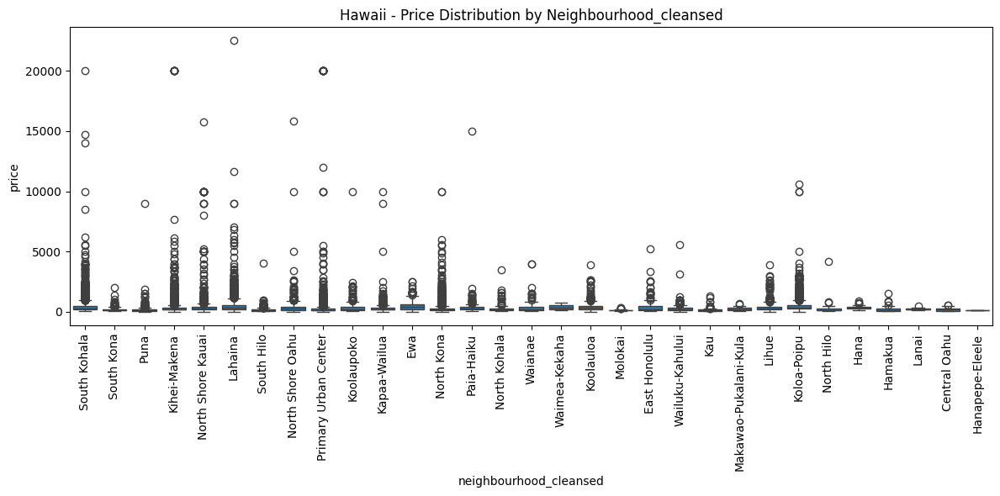

<Figure size 1200x600 with 0 Axes>

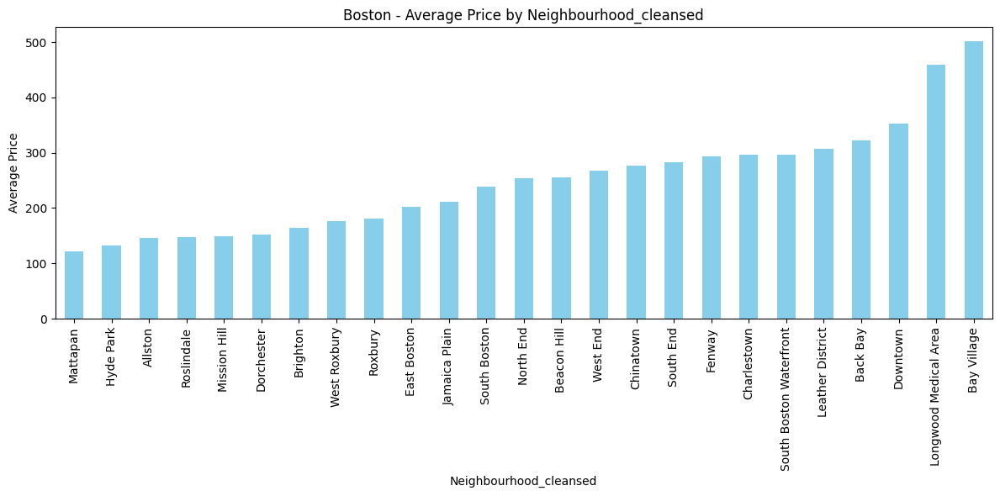

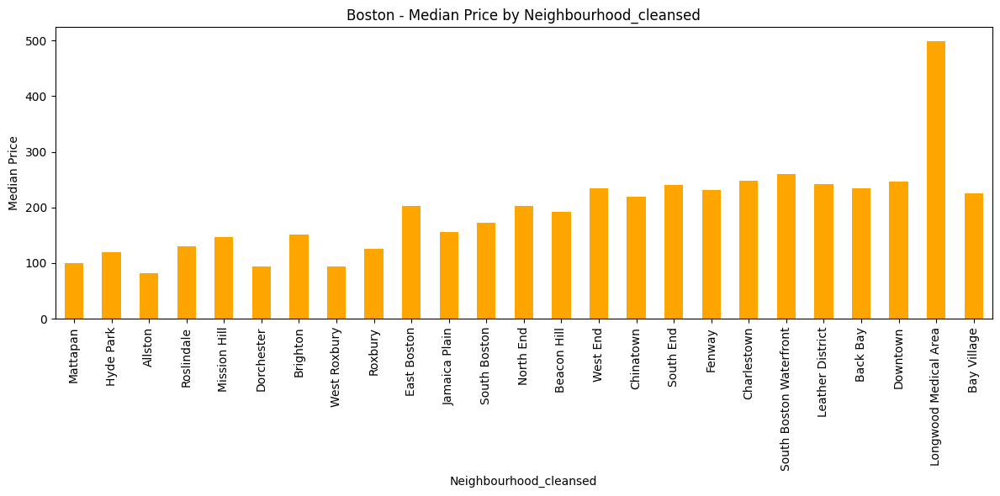

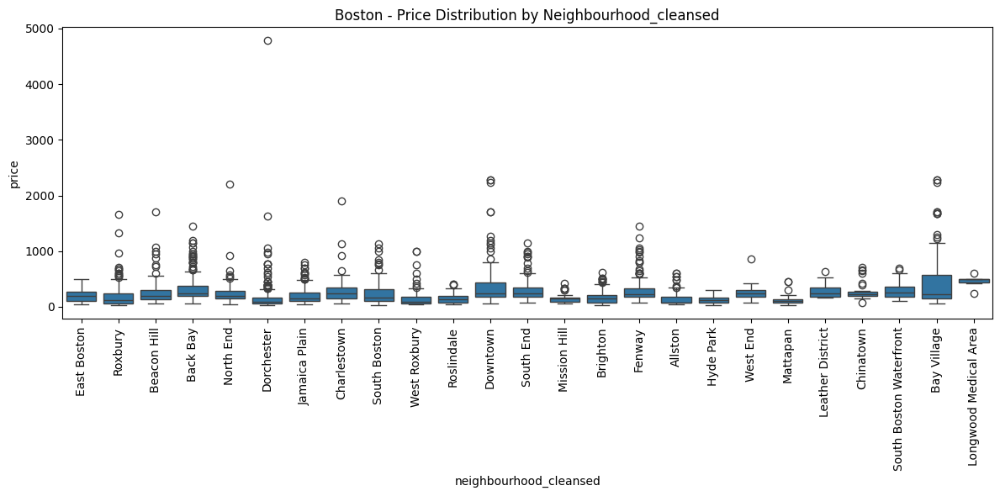

<Figure size 1200x600 with 0 Axes>

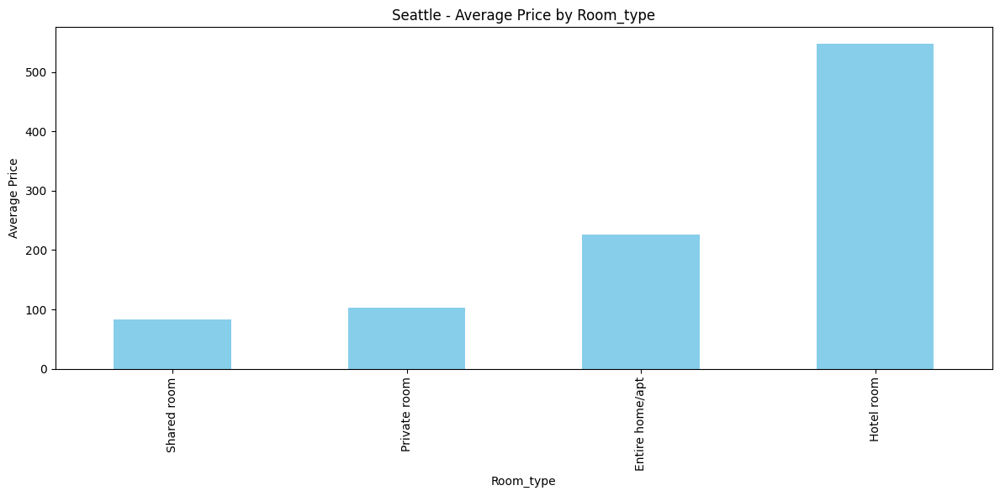

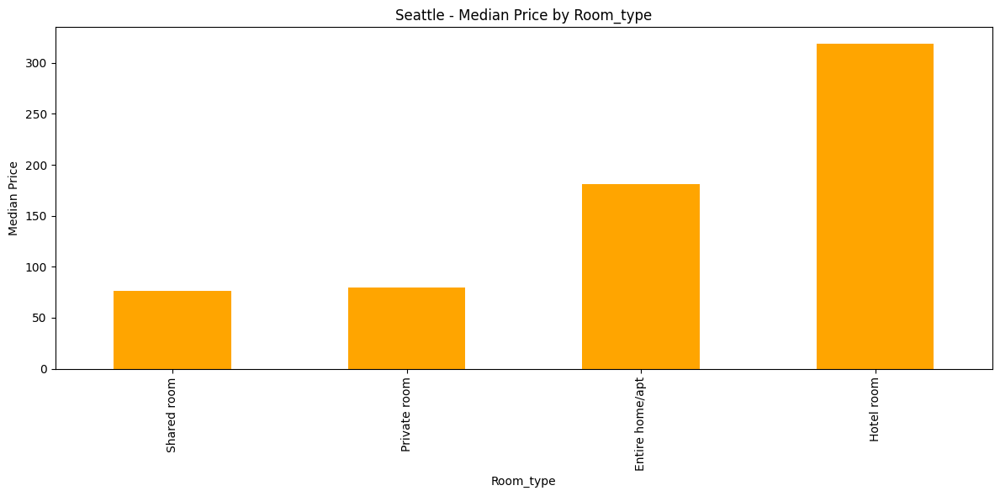

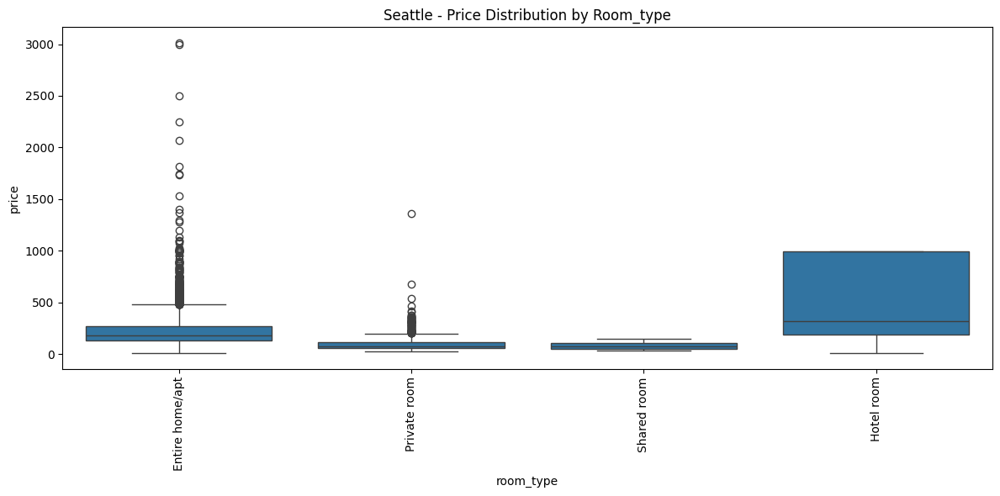

<Figure size 1200x600 with 0 Axes>

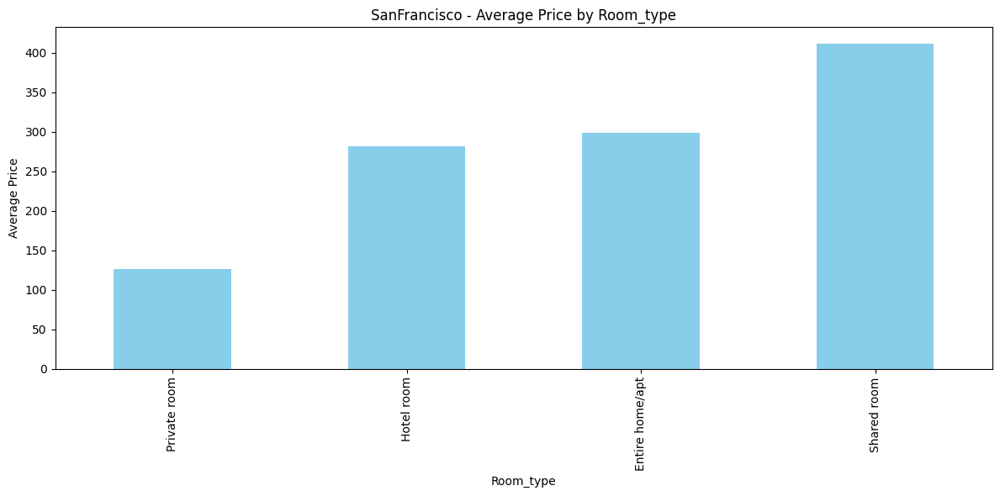

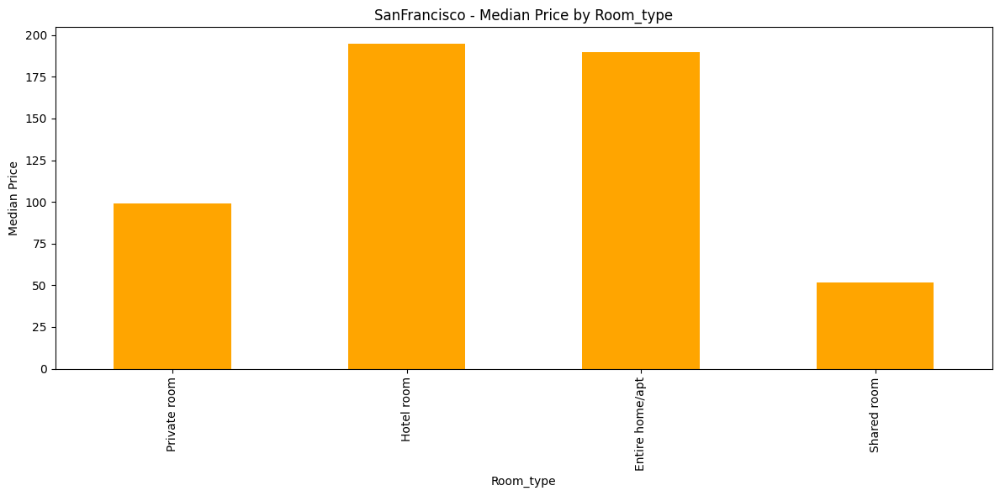

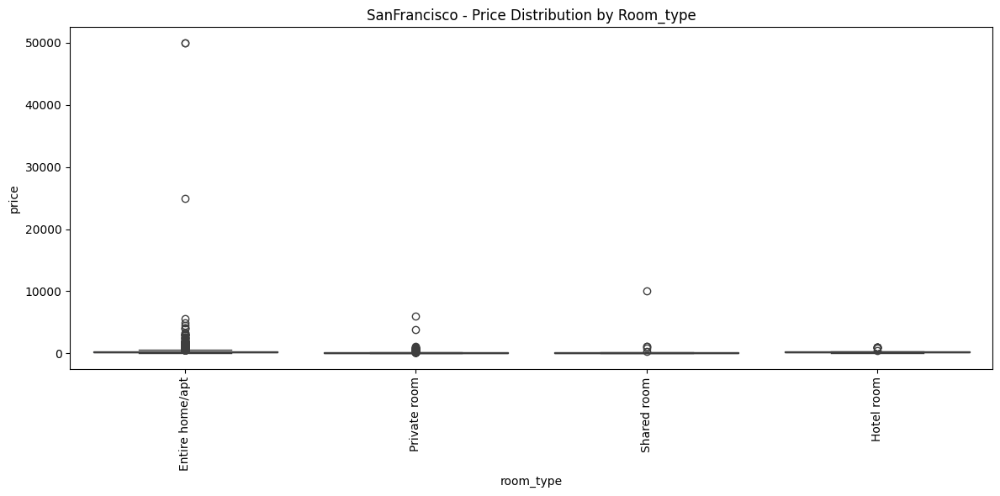

<Figure size 1200x600 with 0 Axes>

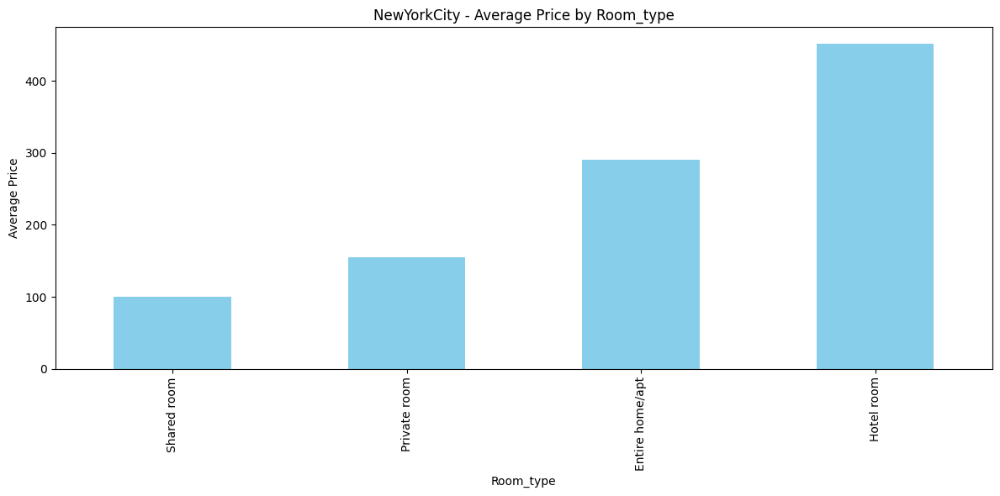

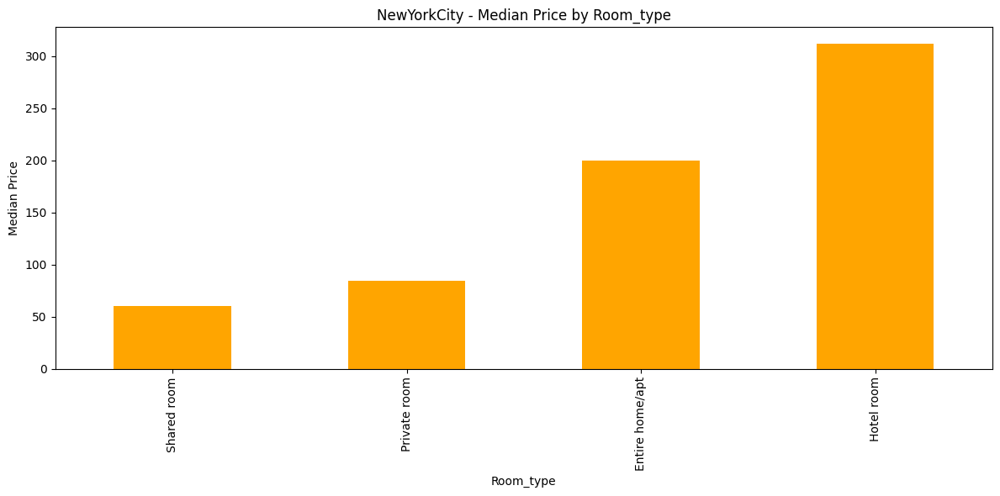

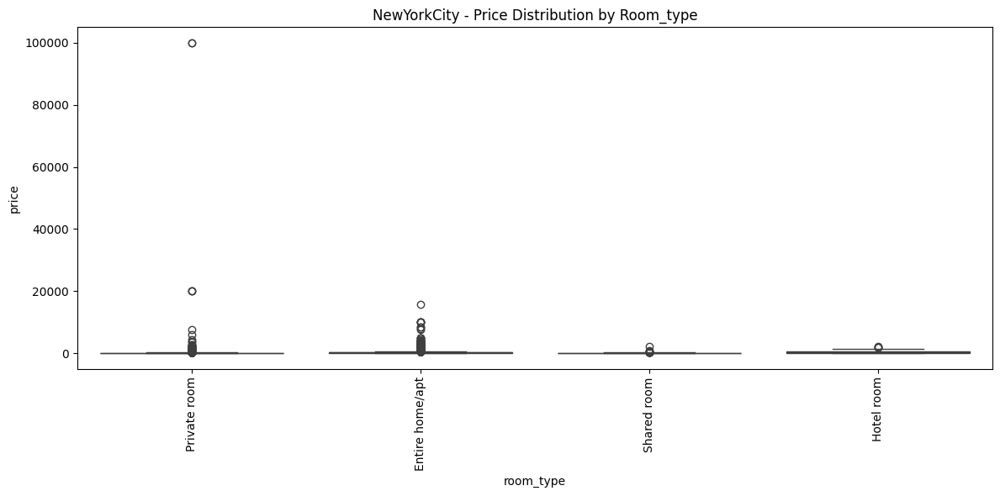

<Figure size 1200x600 with 0 Axes>

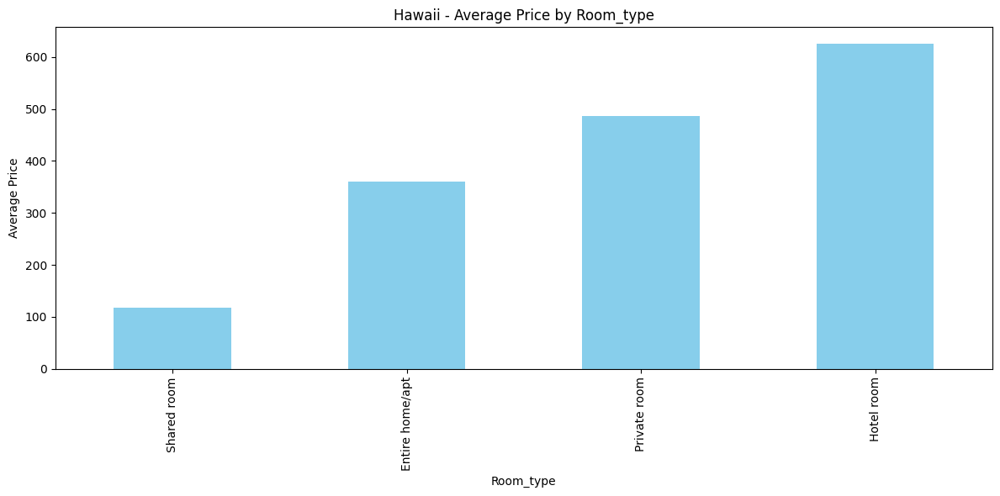

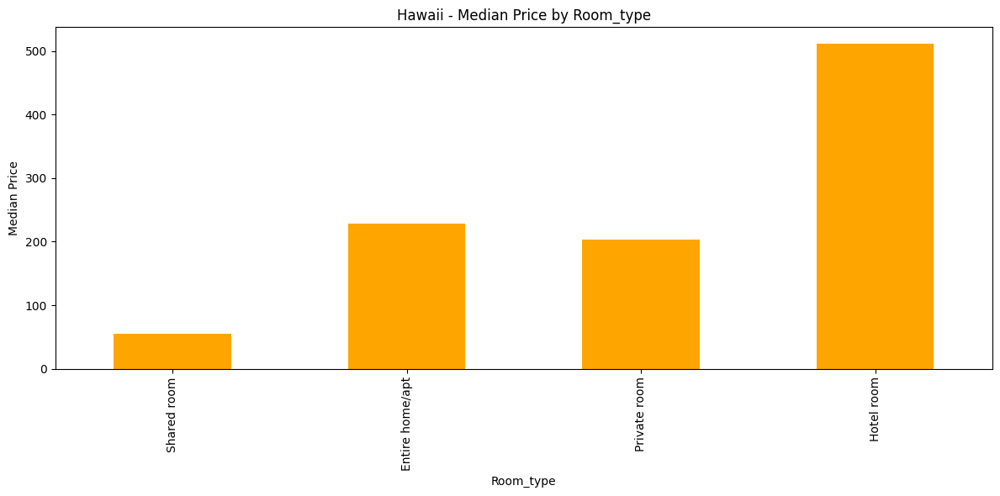

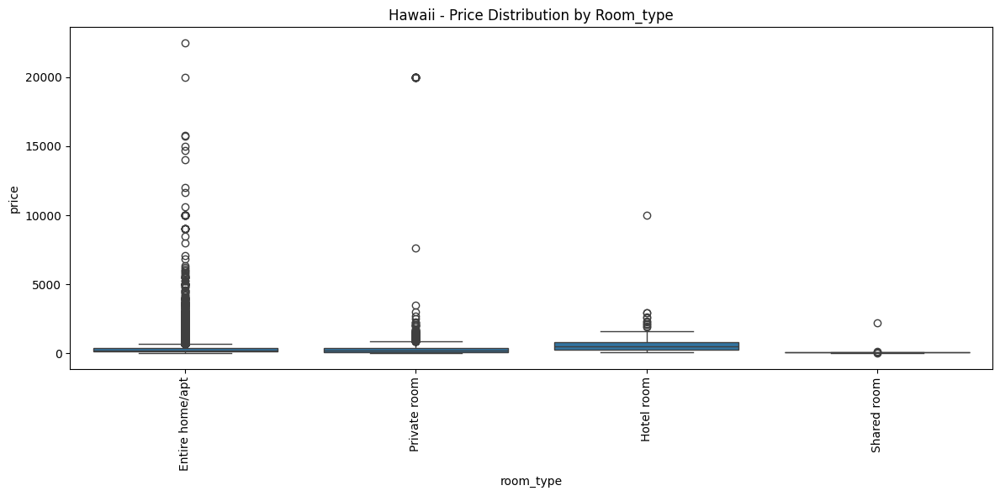

<Figure size 1200x600 with 0 Axes>

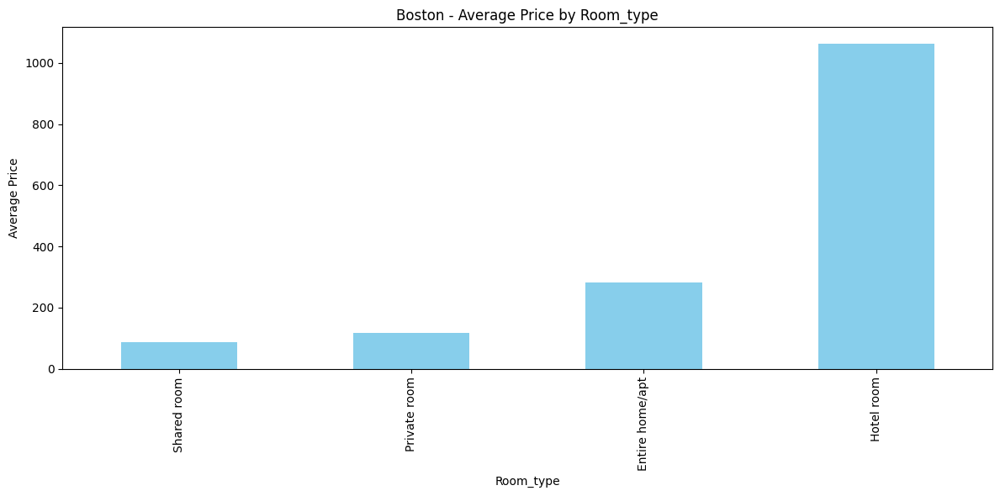

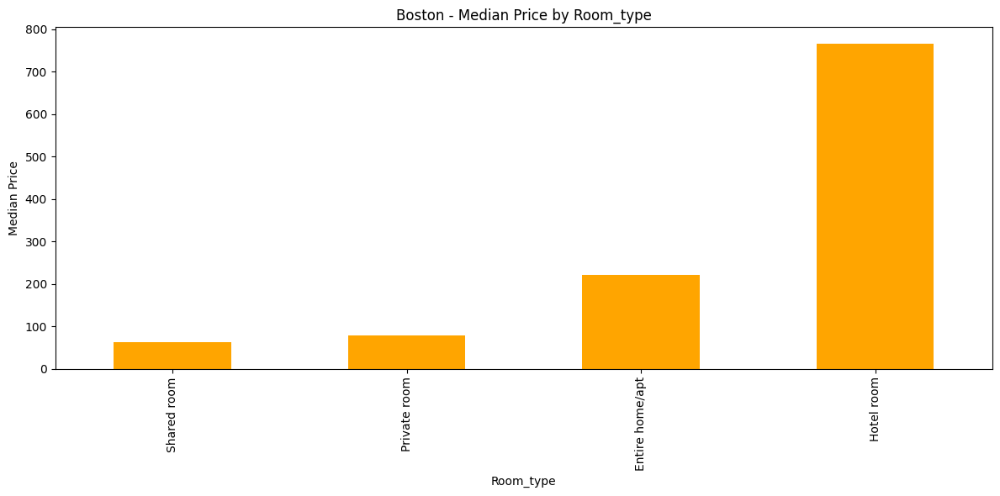

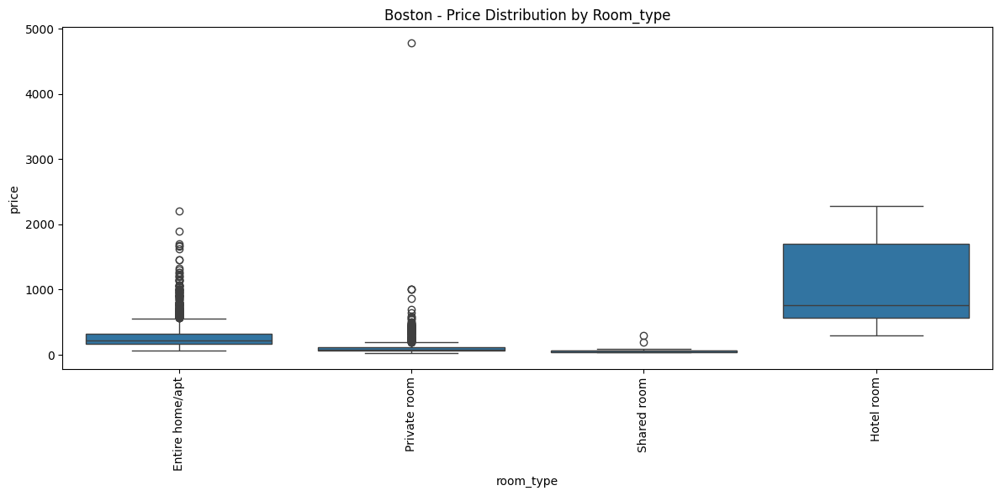

<Figure size 1200x600 with 0 Axes>

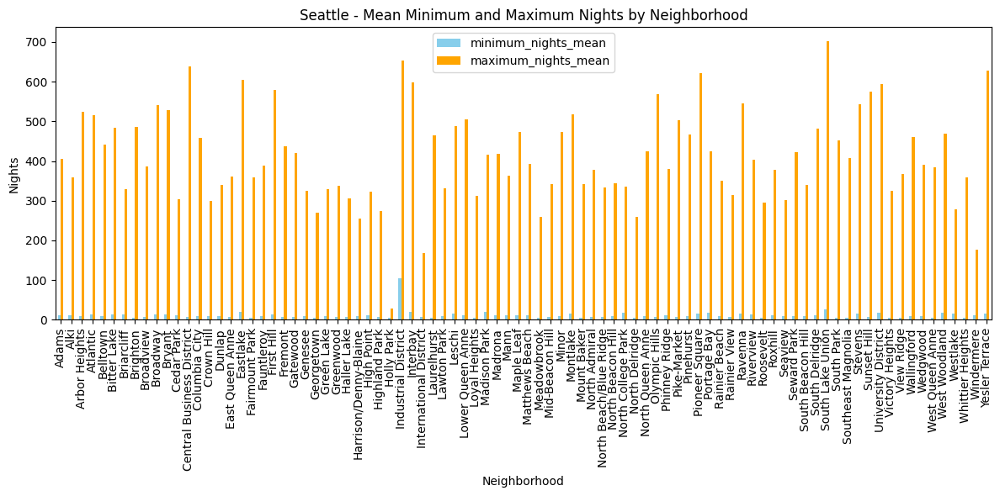

<Figure size 1200x600 with 0 Axes>

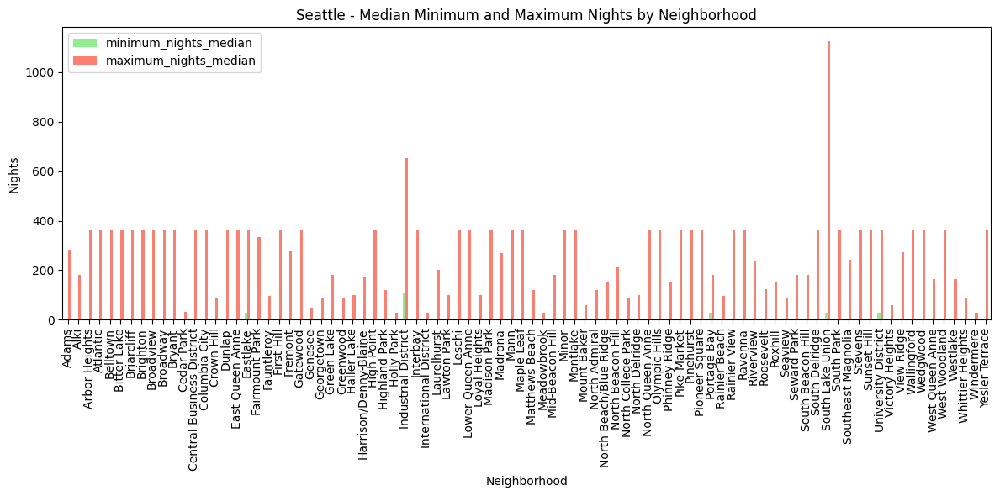

<Figure size 1200x600 with 0 Axes>

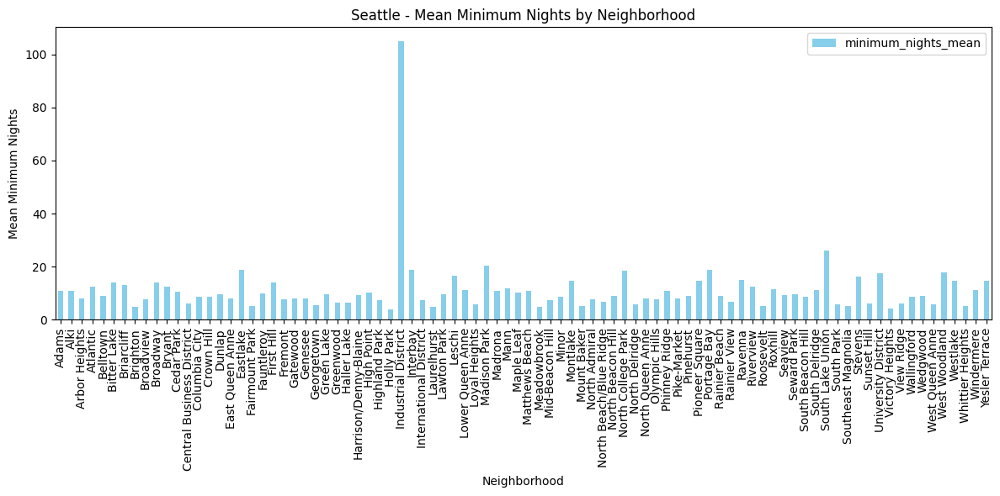

<Figure size 1200x600 with 0 Axes>

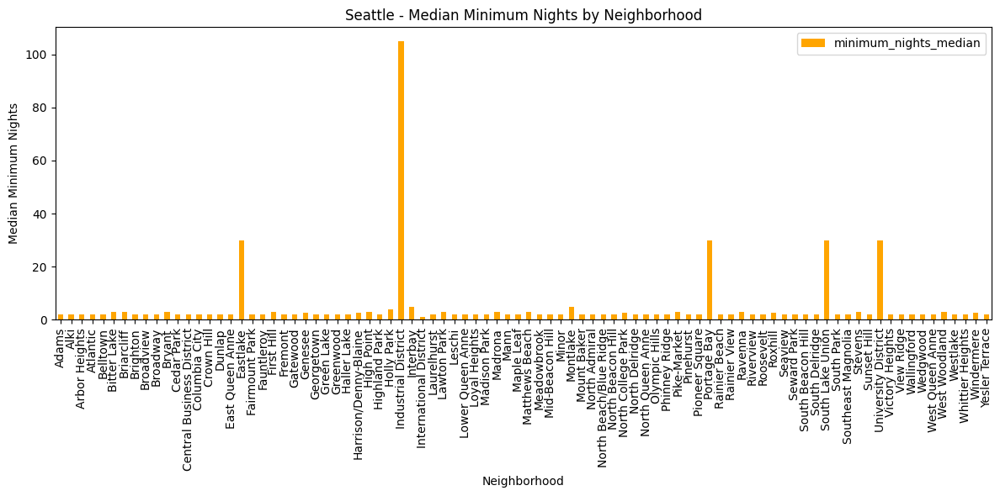

<Figure size 1200x600 with 0 Axes>

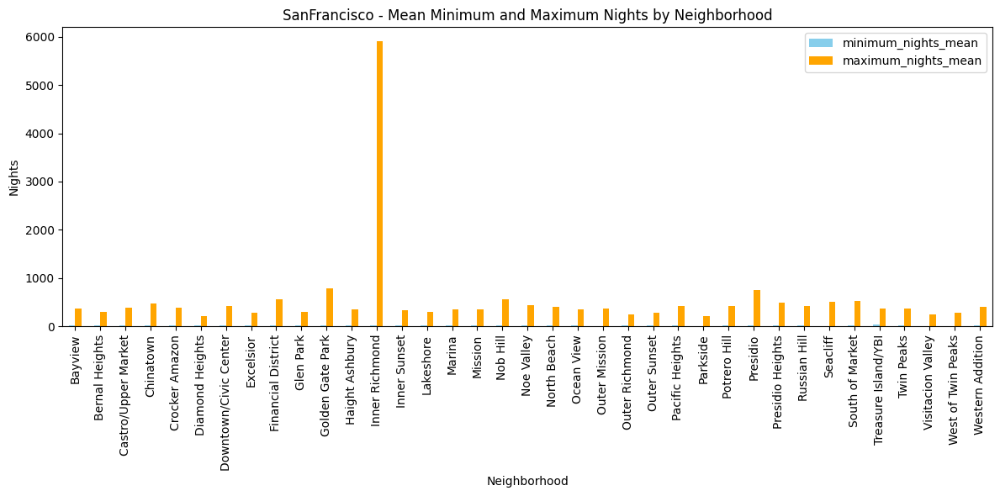

<Figure size 1200x600 with 0 Axes>

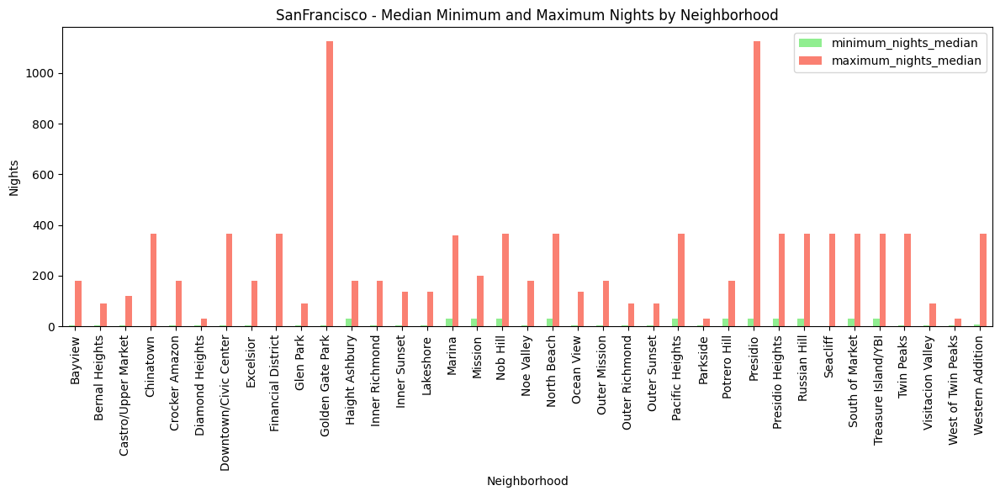

<Figure size 1200x600 with 0 Axes>

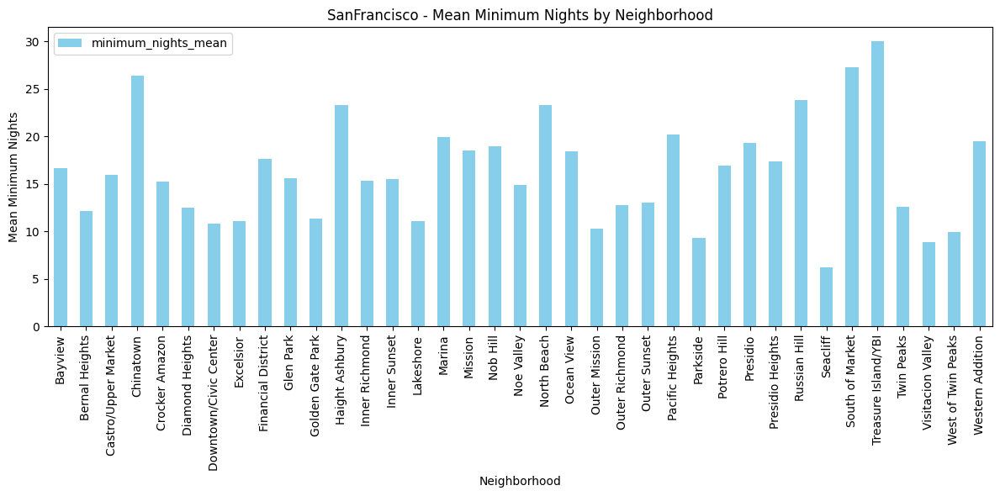

<Figure size 1200x600 with 0 Axes>

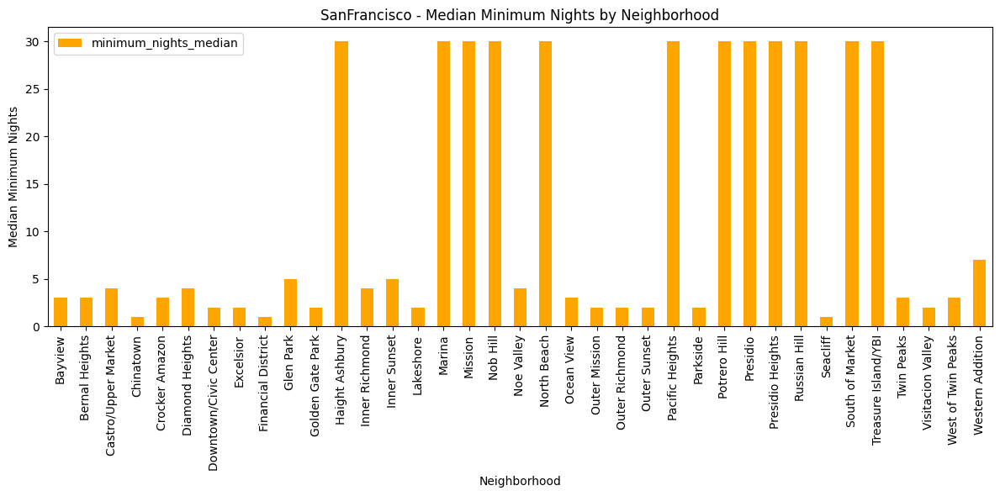

<Figure size 1200x600 with 0 Axes>

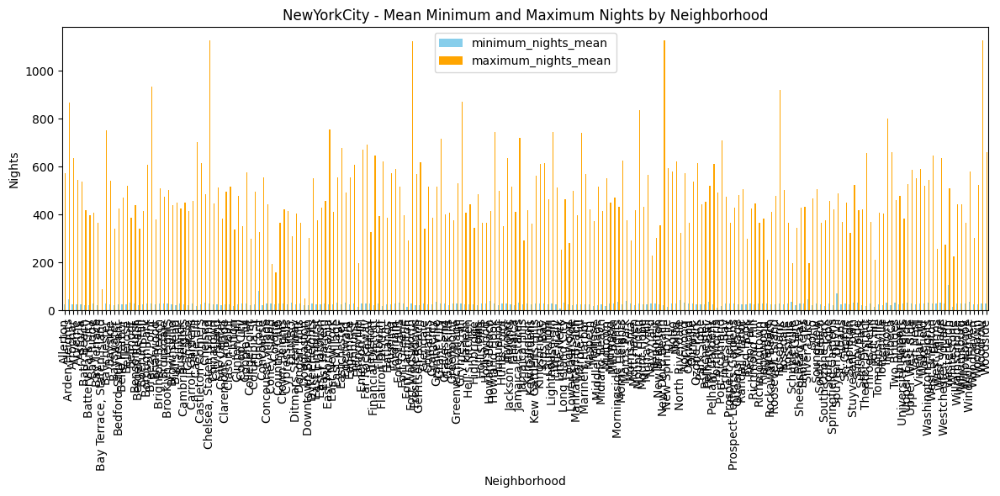

<Figure size 1200x600 with 0 Axes>

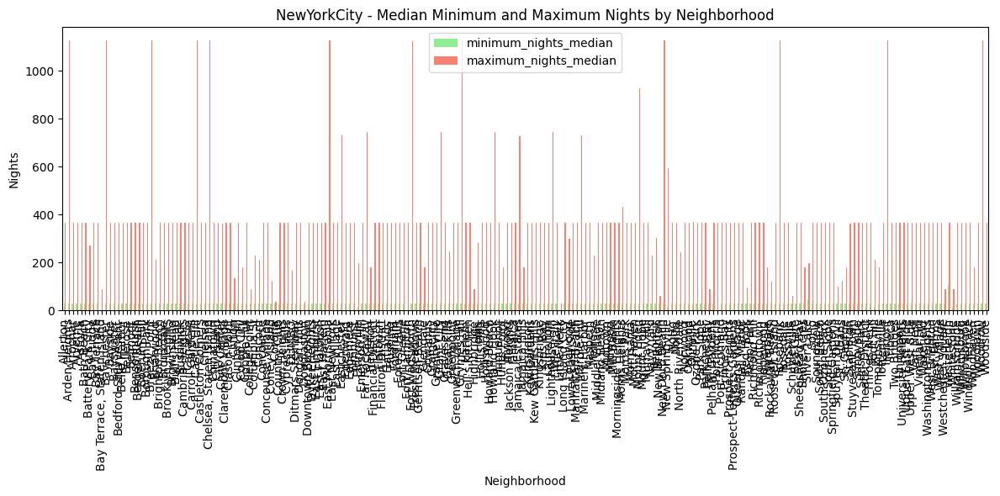

<Figure size 1200x600 with 0 Axes>

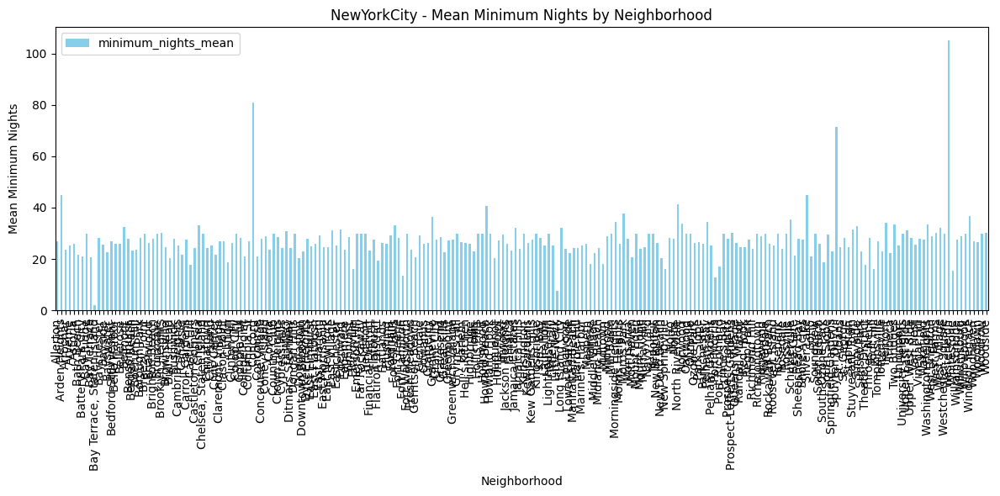

<Figure size 1200x600 with 0 Axes>

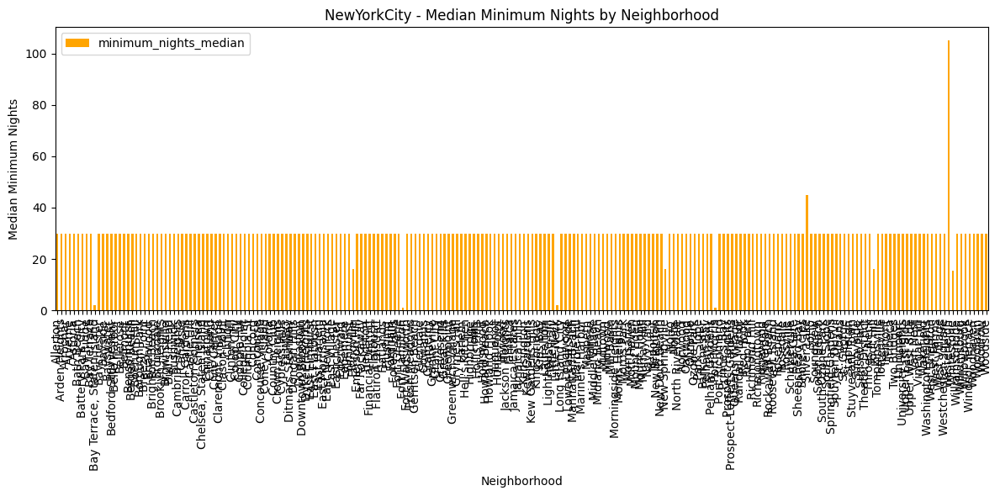

<Figure size 1200x600 with 0 Axes>

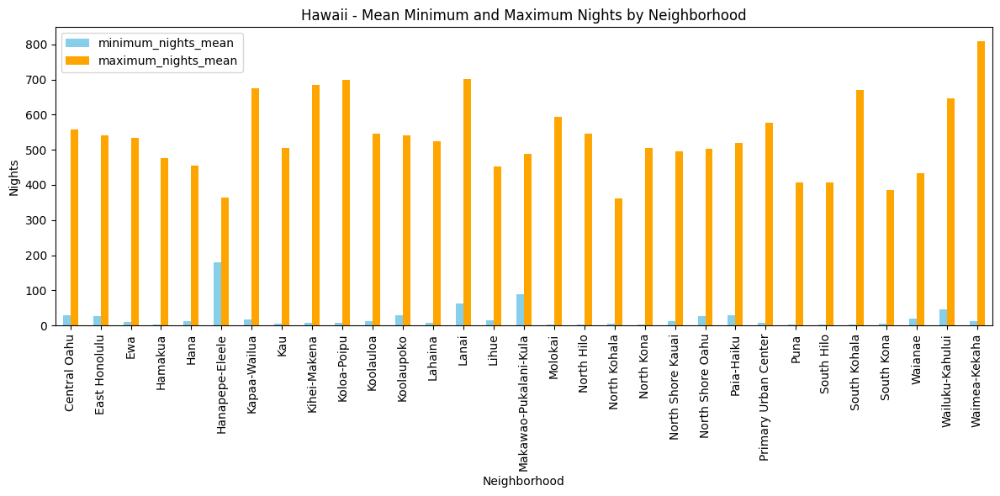

<Figure size 1200x600 with 0 Axes>

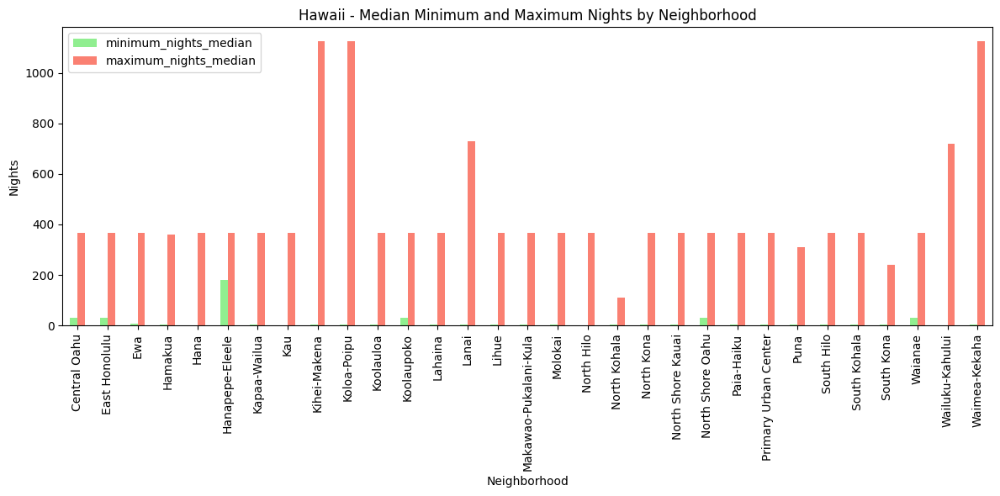

<Figure size 1200x600 with 0 Axes>

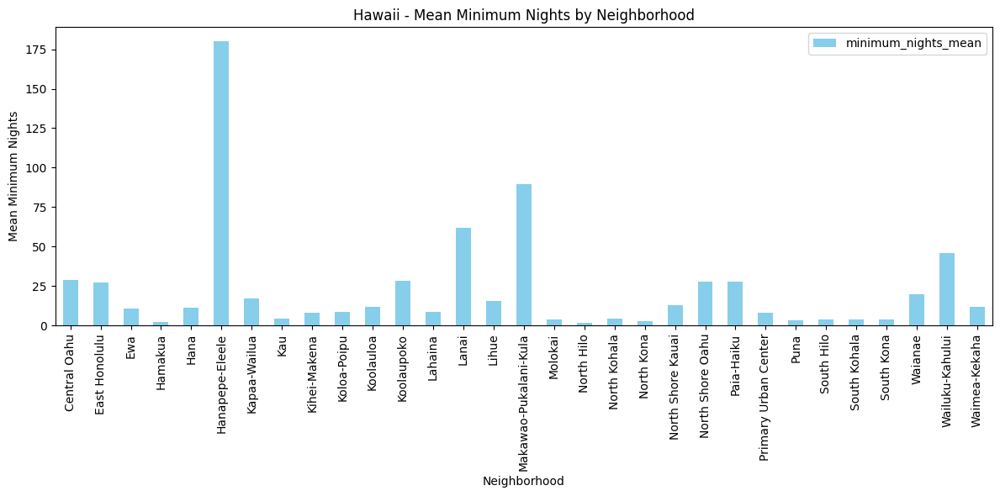

<Figure size 1200x600 with 0 Axes>

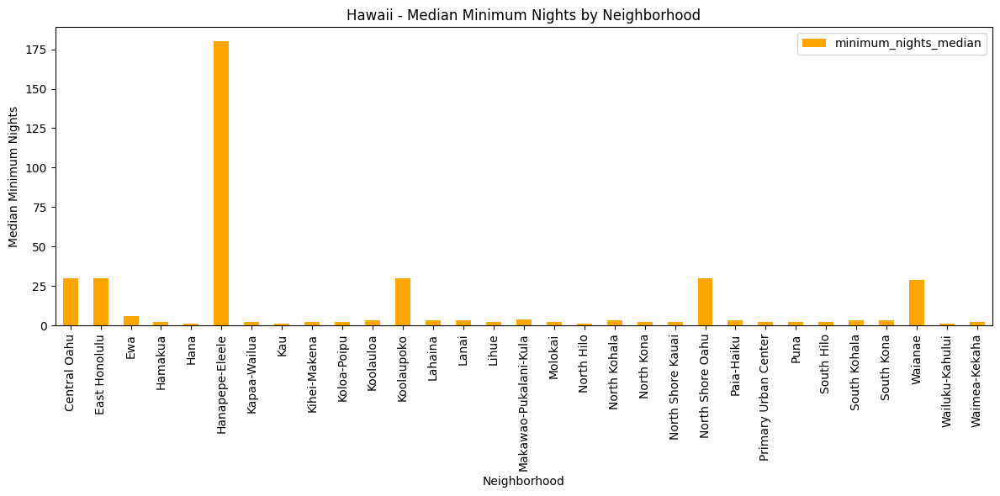

<Figure size 1200x600 with 0 Axes>

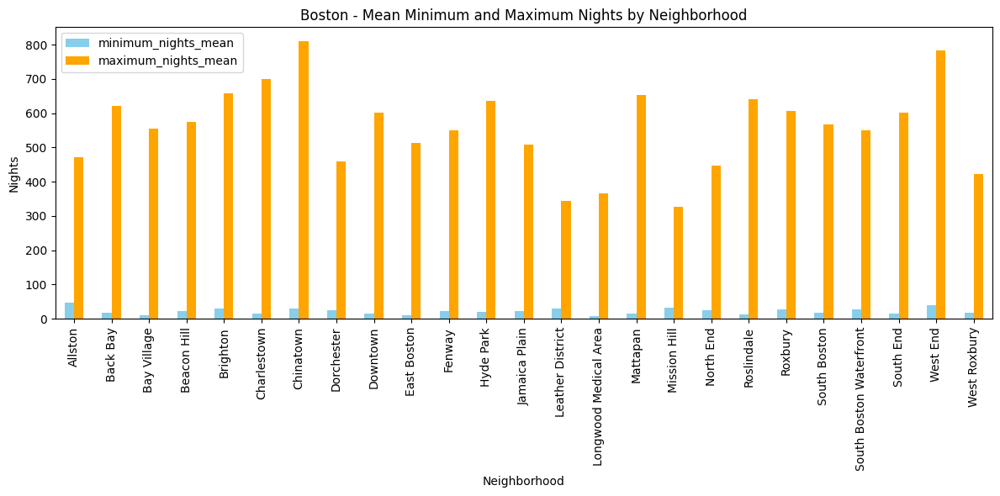

<Figure size 1200x600 with 0 Axes>

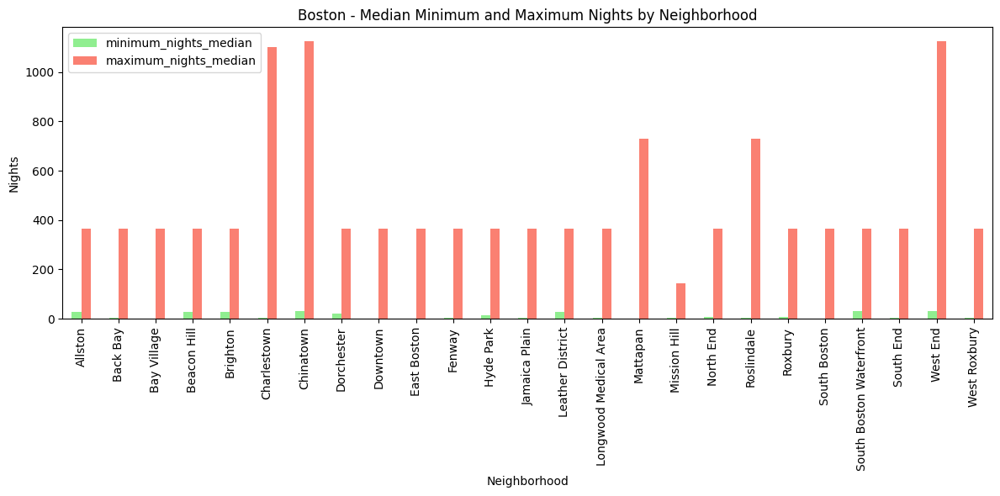

<Figure size 1200x600 with 0 Axes>

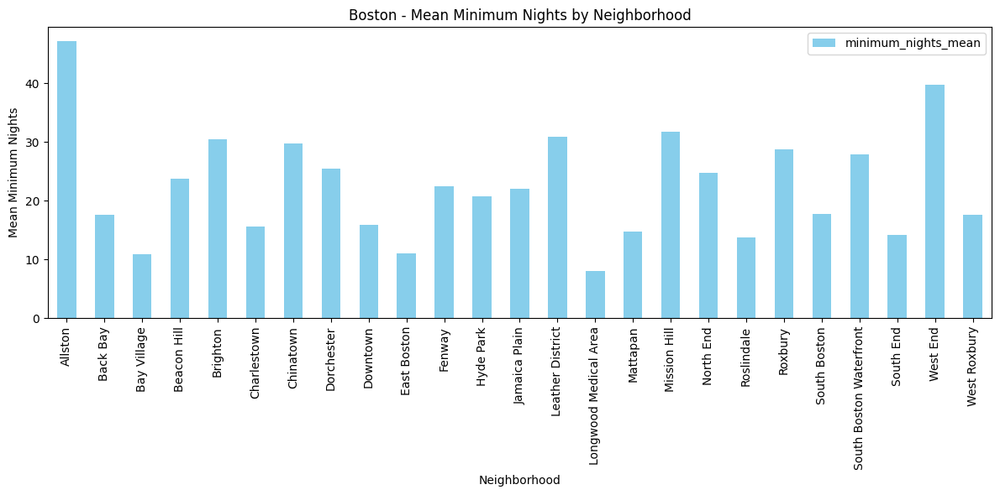

<Figure size 1200x600 with 0 Axes>

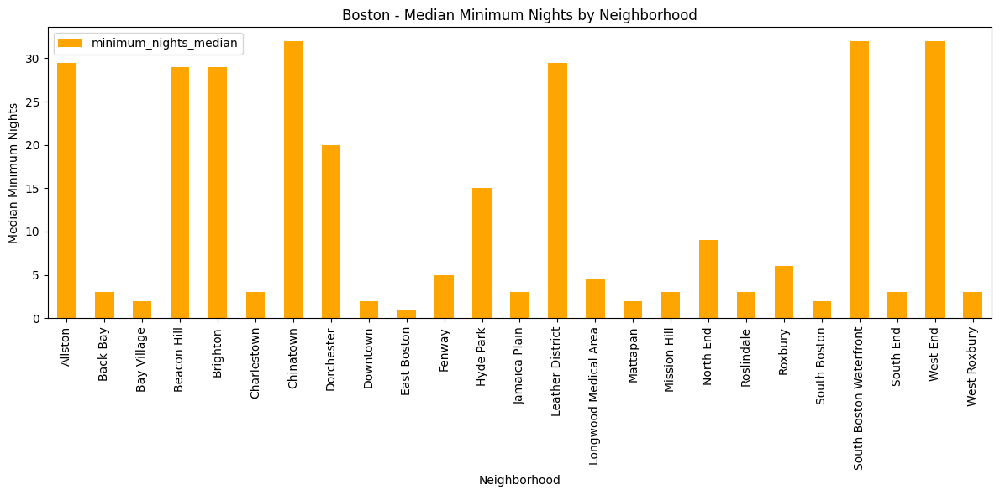

In [20]:
"""
4.) Price Analysis

Analyzing the averages and distribution of prices across neighborhoods and/or room types

Analyzing averages of minimum and maximum stay across neighborhoods
"""

# Analyze distribution and average price across neighborhoods
def price_by_neighborhood(cities):
    city_neighborhood_analysis = {} # Store results for each city

    for city, dfs in cities.items():
        # Group (aggregate) data by neighborhood to and calculate price stats
        neighborhood_analysis = dfs['listings_price_based_df'].groupby('neighbourhood_cleansed').agg({
            'price': ['mean', 'median', 'std', 'min', 'max'],
        }).round(2)

        # Flatten multi-index columns (eg price with subgroup mean, becomes price_mean)
        neighborhood_analysis.columns = ['_'.join(col).strip() for col in neighborhood_analysis.columns.values]

        # Store results for this specific city
        city_neighborhood_analysis[city] = neighborhood_analysis
    
    return city_neighborhood_analysis # Return the dictionary for plotting / further analysis

# Analyze distribution and average price across room types
def price_by_room_type(cities):
    city_room_type_analysis = {}

    for city, dfs in cities.items():
        room_type_analysis = dfs['listings_price_based_df'].groupby('room_type').agg({
            'price': ['mean', 'median', 'std', 'min', 'max'],
        }).round(2)

        room_type_analysis.columns = ['_'.join(col).strip() for col in room_type_analysis.columns.values]
        
        city_room_type_analysis[city] = room_type_analysis
    
    return city_room_type_analysis

# Analyze min and max nights for stays across neighborhoods
def stay_by_neighborhood(cities):
    city_neighbourhood_stay_analysis = {}

    for city, dfs in cities.items():
        stay_duration_analysis = dfs['listings_price_based_df'].groupby('neighbourhood_cleansed').agg({
            'minimum_nights': ['mean', 'median', 'min', 'max'],
            'maximum_nights': ['mean', 'median', 'min', 'max']
        }).round(2)

        stay_duration_analysis.columns = ['_'.join(col).strip() for col in stay_duration_analysis.columns.values]
        
        city_neighbourhood_stay_analysis[city] = stay_duration_analysis

    return city_neighbourhood_stay_analysis

# Plot average (mean/median) price and distribution by neighborhood or room type for each city
def plot_price_by_neighborhood_or_room(cities, group_by_col, value_col='price'):
    for city, dfs in cities.items():
        plt.figure(figsize=(12, 6))

        # Group data by specified column (neighborhood or room type), calculate the mean and median, and sort by mean
        grouped_df = dfs['listings_price_based_df'].groupby(group_by_col)[value_col].agg(['mean', 'median']).sort_values('mean')
        
        # Plot a bar chart for the mean price
        plt.figure(figsize=(12, 6))
        grouped_df['mean'].plot(kind='bar', color='skyblue')
        plt.title(f"{city} - Average {value_col.capitalize()} by {group_by_col.capitalize()}")
        plt.xlabel(group_by_col.capitalize())
        plt.ylabel(f"Average {value_col.capitalize()}")
        plt.xticks(rotation=90)
        plt.tight_layout() 
        plt.show()

        # Plot a bar chart for the median price
        plt.figure(figsize=(12, 6))
        grouped_df['median'].plot(kind='bar', color='orange')
        plt.title(f"{city} - Median {value_col.capitalize()} by {group_by_col.capitalize()}")
        plt.xlabel(group_by_col.capitalize())
        plt.ylabel(f"Median {value_col.capitalize()}")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

        # Create a boxplot to show the distribution of the specified value by neighborhood or room type
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=dfs['listings_price_based_df'], x=group_by_col, y=value_col)
        plt.title(f"{city} - {value_col.capitalize()} Distribution by {group_by_col.capitalize()}")  # Title of the plot
        plt.xticks(rotation=90)  # Rotate the x-axis labels for better visibility
        plt.tight_layout()  # Adjust layout to prevent clipping of labels
        plt.show()

# Plot average (mean/median) min/max stay by neighborhood for each city
def plot_stay_by_neighborhood(cities):
    city_neighbourhood_stay_analysis = stay_by_neighborhood(cities)

    for city, stay_data in city_neighbourhood_stay_analysis.items():

        # Plot mean for min and max nights per neighborhood
        plt.figure(figsize=(12, 6))
        stay_data[['minimum_nights_mean', 'maximum_nights_mean']].plot(kind='bar', figsize=(12, 6), color=['skyblue', 'orange'])
        plt.title(f"{city} - Mean Minimum and Maximum Nights by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Nights')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

        # Plot median for min and max nights per neighborhood
        plt.figure(figsize=(12, 6))
        stay_data[['minimum_nights_median', 'maximum_nights_median']].plot(kind='bar', figsize=(12, 6), color=['lightgreen', 'salmon'])
        plt.title(f"{city} - Median Minimum and Maximum Nights by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Nights')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

        # Plot mean values for only min nights per neighborhood (for legibility vs both max/min)
        plt.figure(figsize=(12, 6))
        stay_data[['minimum_nights_mean']].plot(kind='bar', figsize=(12, 6), color='skyblue')
        plt.title(f"{city} - Mean Minimum Nights by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Mean Minimum Nights')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

        # Plot median values for only min nights per neighborhood (for legibility vs both max/min)
        plt.figure(figsize=(12, 6))
        stay_data[['minimum_nights_median']].plot(kind='bar', figsize=(12, 6), color='orange')
        plt.title(f"{city} - Median Minimum Nights by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Median Minimum Nights')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

neighbourhood_price_analysis = price_by_neighborhood(city_dfs)
room_type_price_analysis = price_by_room_type(city_dfs)
stay_by_neighborhood_analysis = stay_by_neighborhood(city_dfs)

plot_price_by_neighborhood_or_room(city_dfs, 'neighbourhood_cleansed')
plot_price_by_neighborhood_or_room(city_dfs, 'room_type')
plot_stay_by_neighborhood(city_dfs)

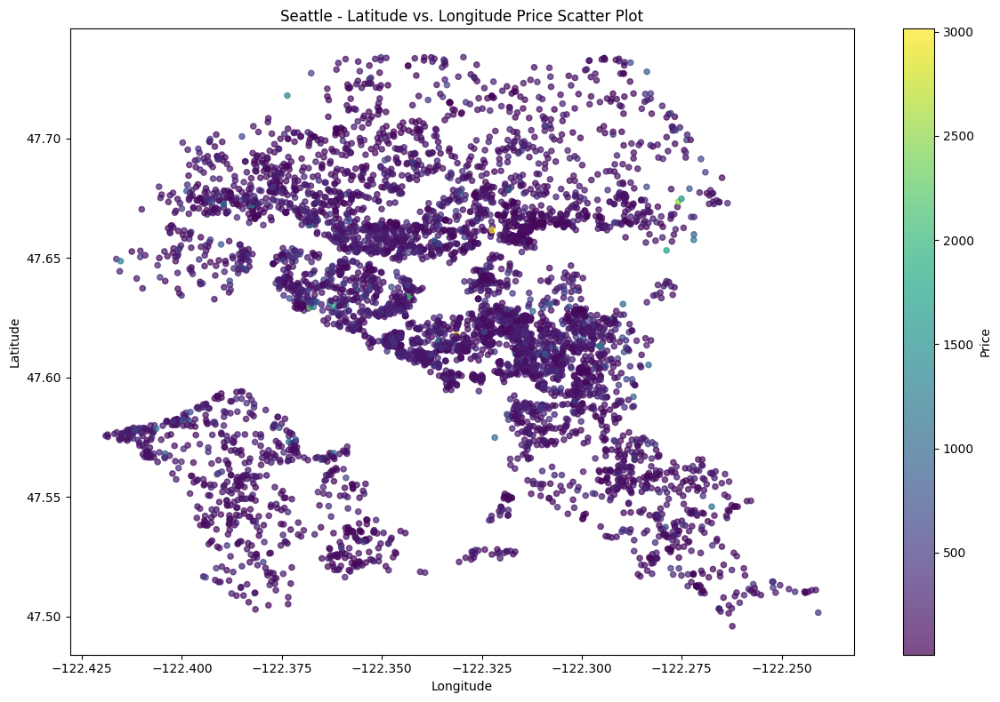

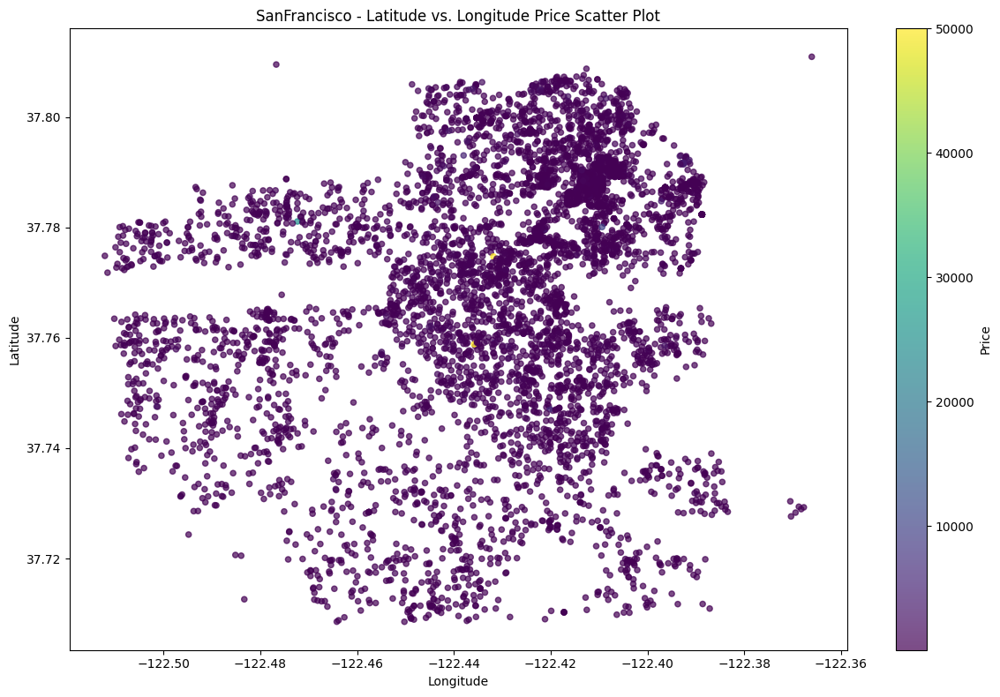

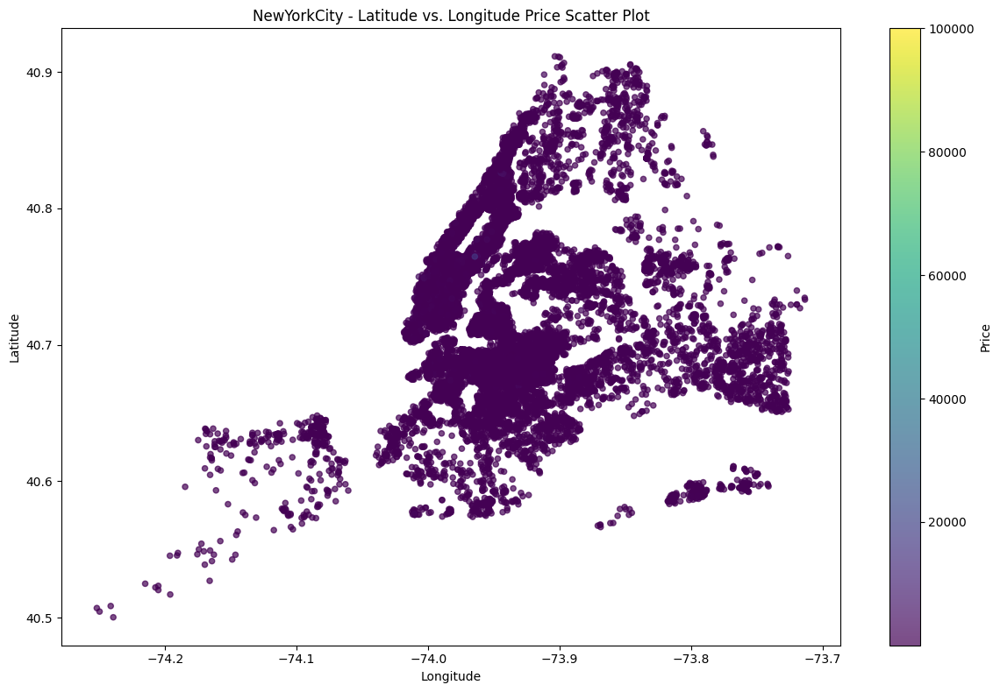

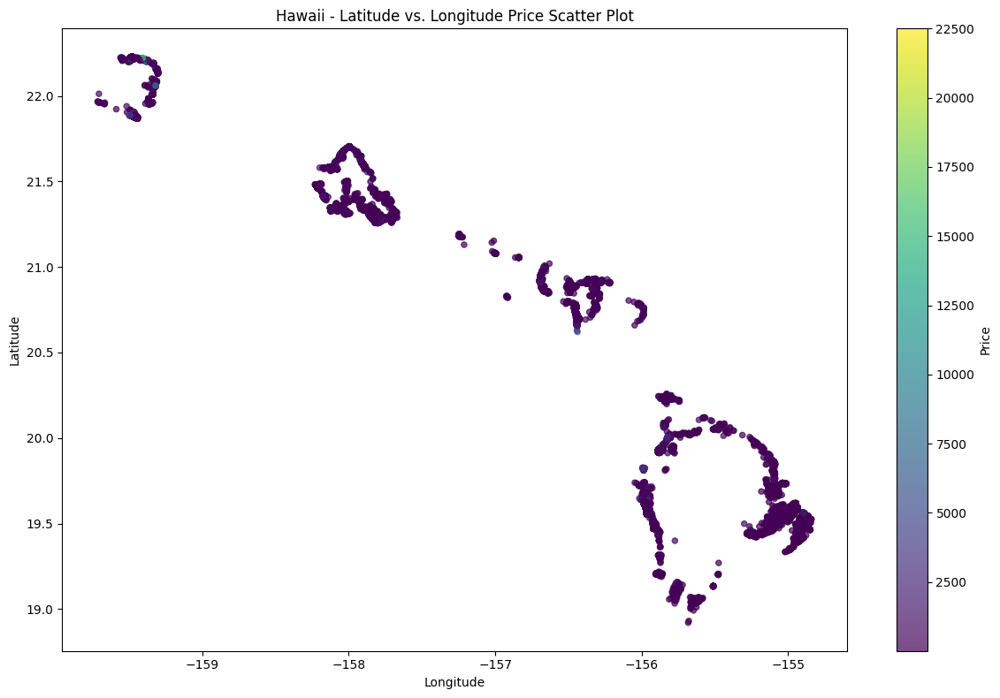

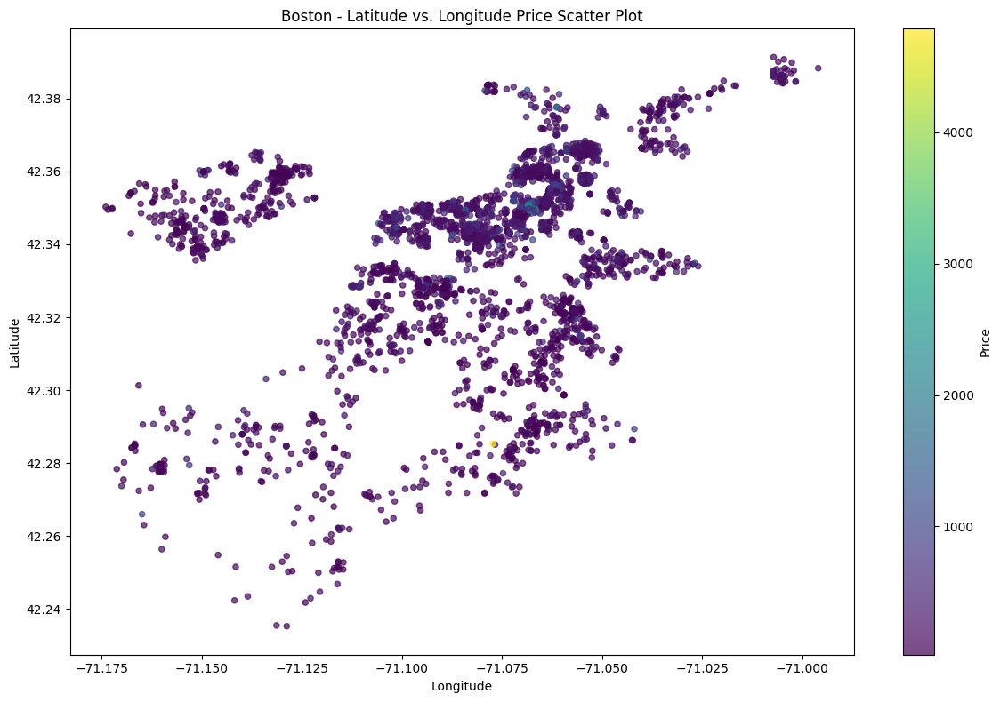

In [29]:
"""
Geographical Heatmaps with price intensity
"""

def plot_long_lat_heatmap(cities):
    for city, dfs in cities.items():
        listings_df = dfs['listings_price_based_df']

        plt.figure(figsize=(12, 8))
        
        
        scatter = plt.scatter(
            x=listings_df['longitude'], 
            y=listings_df['latitude'], 
            c=listings_df['price'], 
            cmap='coolwarm',  
            s=20, 
            alpha=0.7  
        )

        plt.colorbar(scatter, label='Price')
        plt.title(f"{city} - Latitude vs. Longitude Price Scatter Plot")
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.tight_layout()
        plt.show()


plot_long_lat_heatmap(city_dfs)

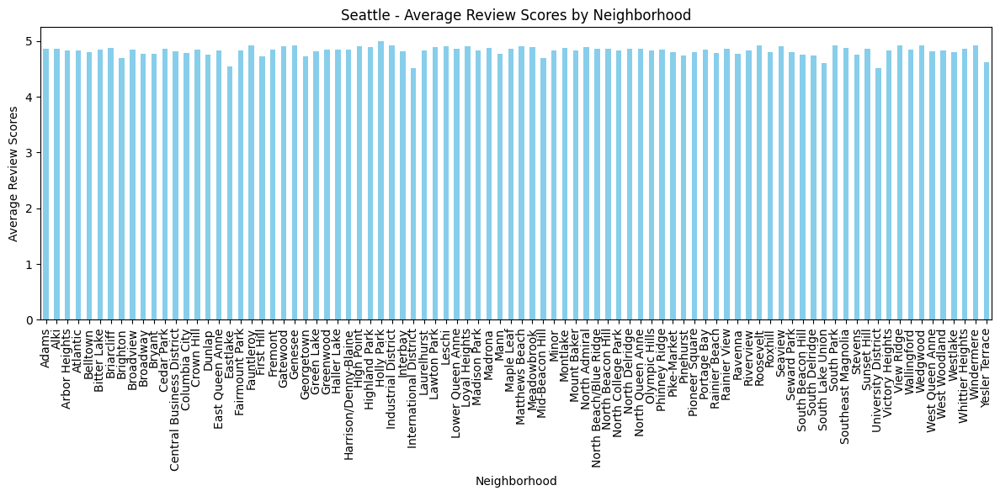

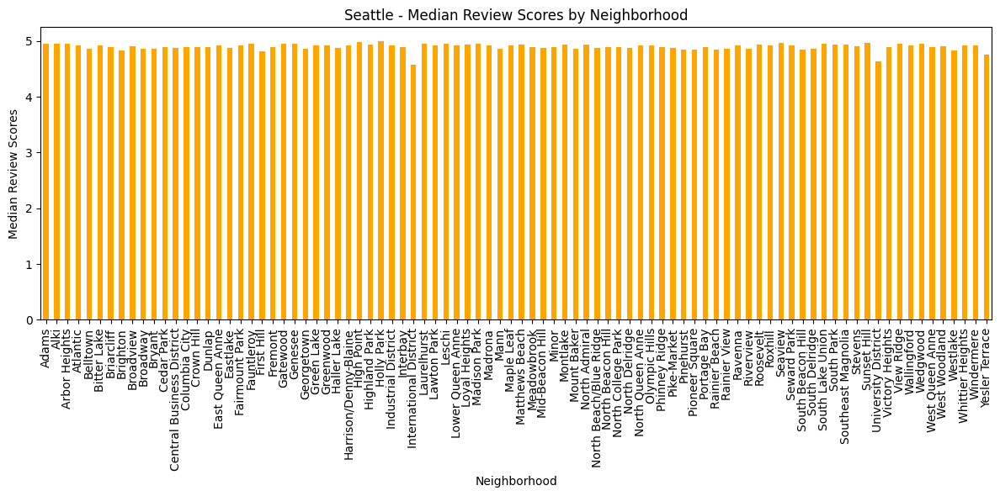

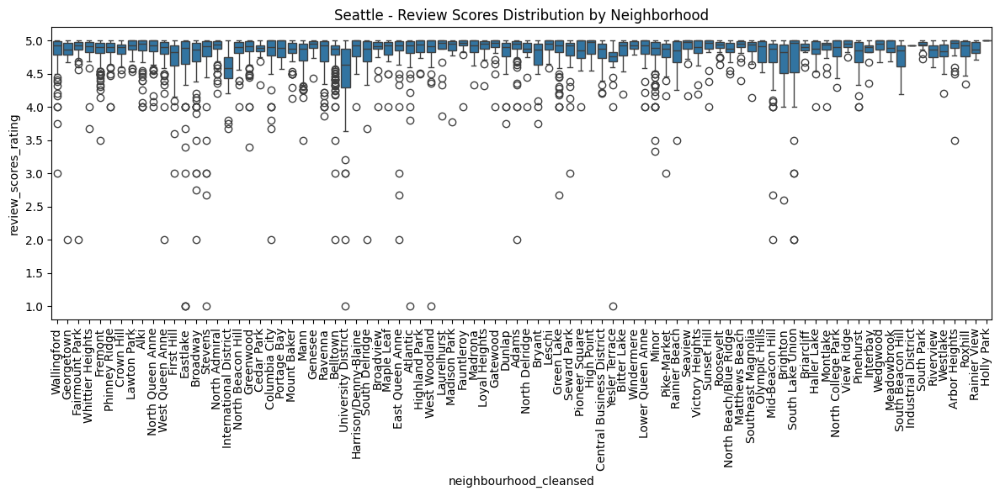

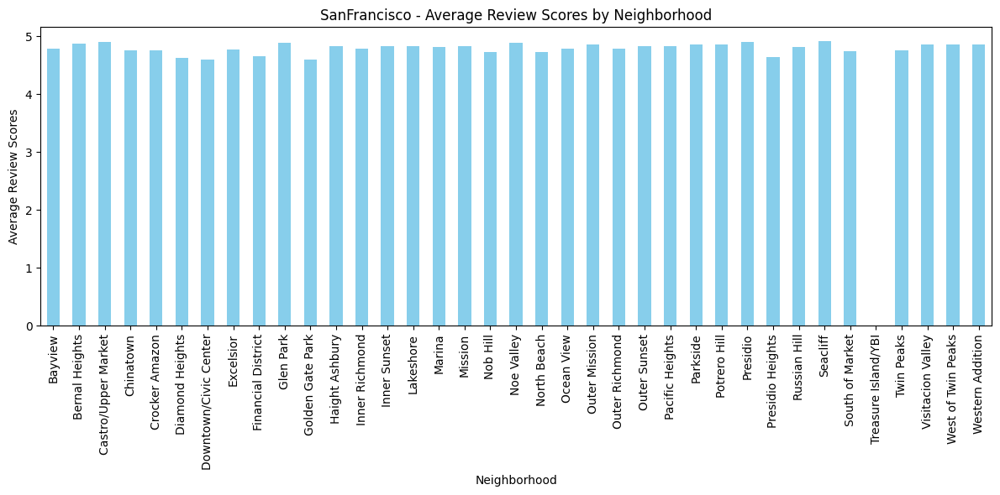

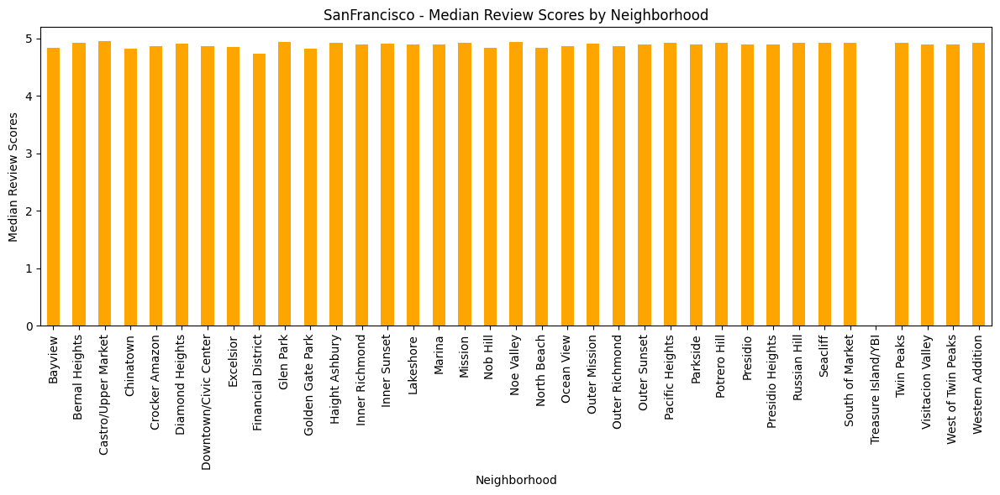

...

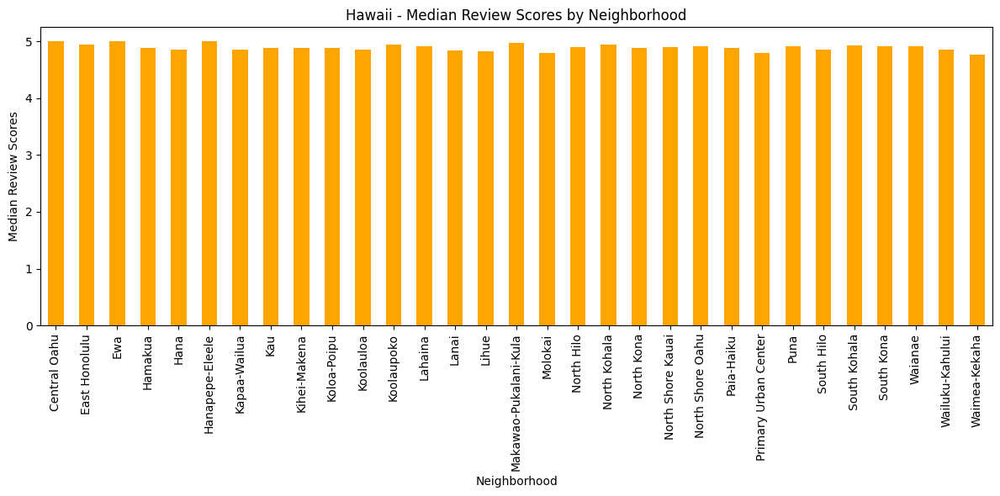

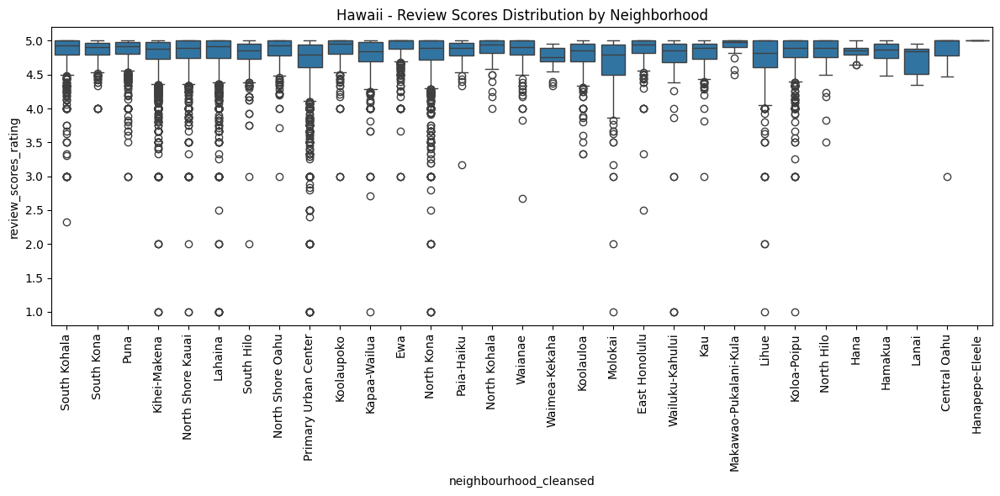

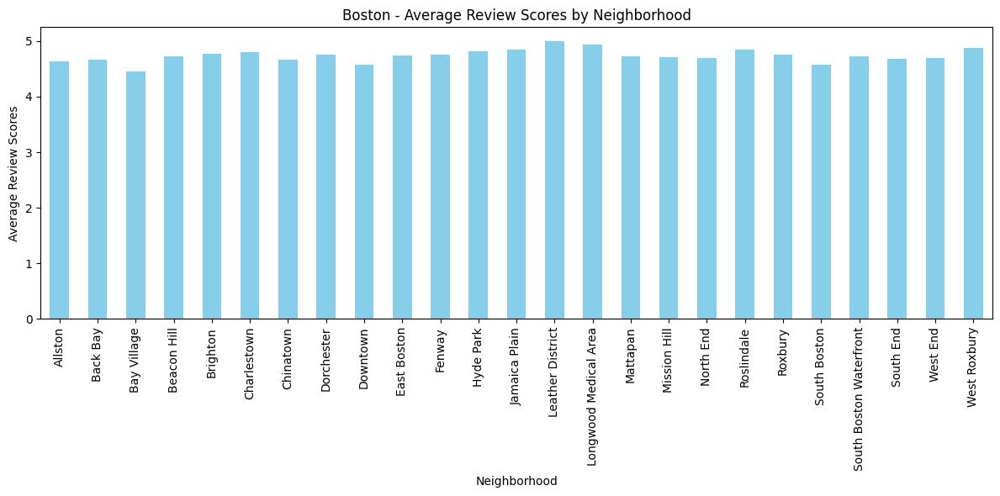

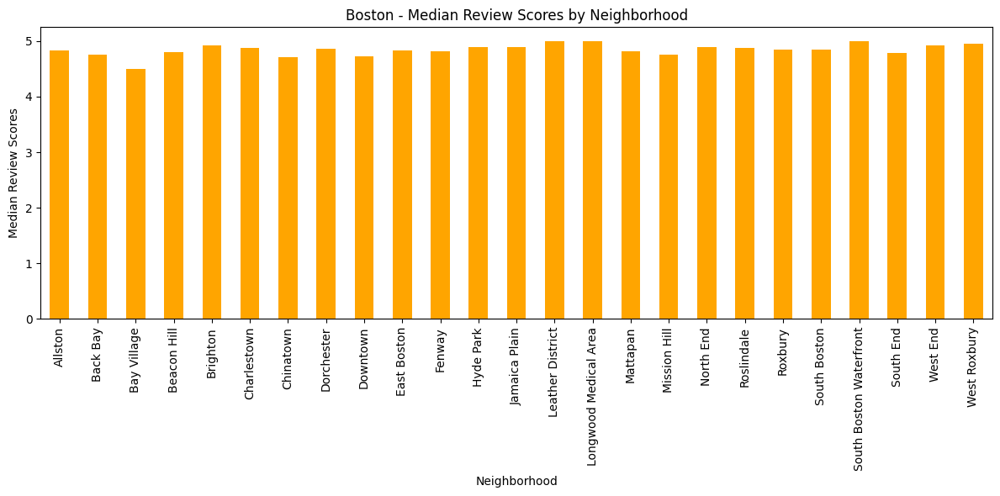

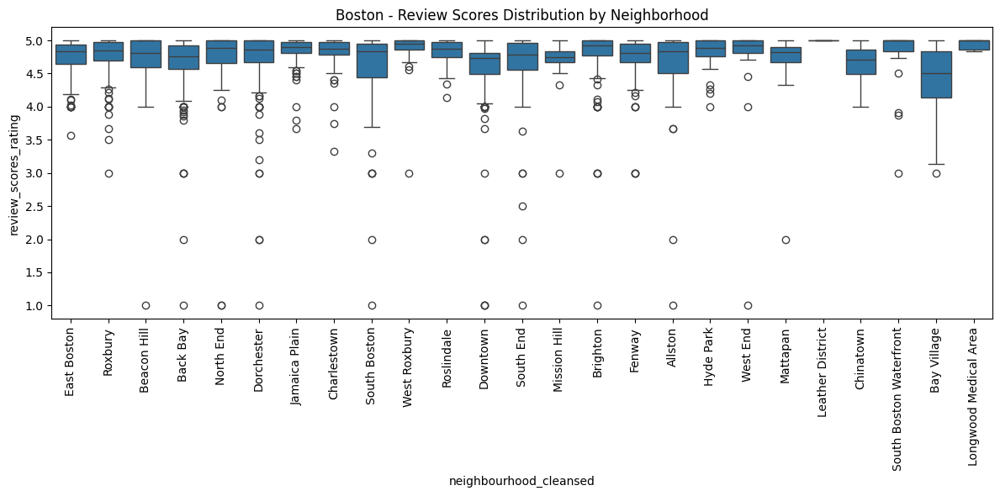

In [21]:
"""
5.) Neighborhood Comparison

Comparing average review_score_rating across different neighborhoods.
"""
# Analyze average (mean/median) review score across neighborhoods
def review_scores_by_neighborhood(cities):
    city_neighborhood_ratings = {}

    for city, dfs in cities.items():
        neighborhood_ratings = dfs['listings_price_based_df'].groupby('neighbourhood_cleansed').agg({
            'review_scores_rating': ['mean', 'median']
        }).round(2)
        
        neighborhood_ratings.columns = ['_'.join(col).strip() for col in neighborhood_ratings.columns.values]
        
        city_neighborhood_ratings[city] = neighborhood_ratings
    
    return city_neighborhood_ratings

# Plot average and median review scores by neighborhood for each city
def plot_review_scores_by_neighborhood(cities):
    city_neighborhood_ratings = review_scores_by_neighborhood(cities)

    for city, neighborhood_ratings in city_neighborhood_ratings.items():
        
        # Plot the mean review scores for each neighborhood
        plt.figure(figsize=(12, 6))
        neighborhood_ratings['review_scores_rating_mean'].plot(kind='bar', color='skyblue')
        plt.title(f"{city} - Average Review Scores by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Average Review Scores')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()
        
        # Plot the median review scores for each neighborhood
        plt.figure(figsize=(12, 6))
        neighborhood_ratings['review_scores_rating_median'].plot(kind='bar', color='orange')
        plt.title(f"{city} - Median Review Scores by Neighborhood")
        plt.xlabel('Neighborhood')
        plt.ylabel('Median Review Scores')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

        dfs = cities[city]
        # Create a boxplot to show the distribution of review scores by neighborhood
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=dfs['listings_price_based_df'], x='neighbourhood_cleansed', y='review_scores_rating')
        plt.title(f"{city} - Review Scores Distribution by Neighborhood")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


# Run the analysis and plot
review_scores_by_neighborhood_analysis = review_scores_by_neighborhood(city_dfs)
plot_review_scores_by_neighborhood(city_dfs)


===== Outlier Detection for Seattle =====

Seattle - price Outliers (IQR): 340 rows
Seattle - price Outliers (Z-score): 91 rows


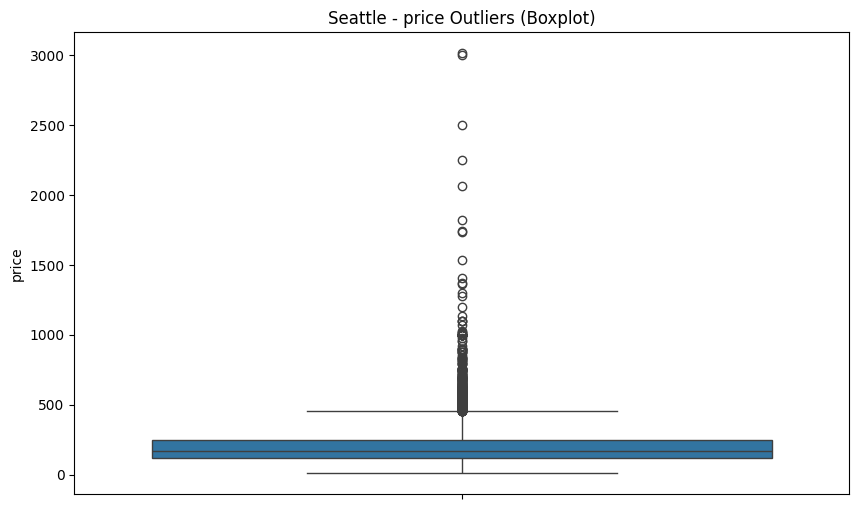


Seattle - minimum_nights Outliers (IQR): 39 rows
Seattle - minimum_nights Outliers (Z-score): 39 rows


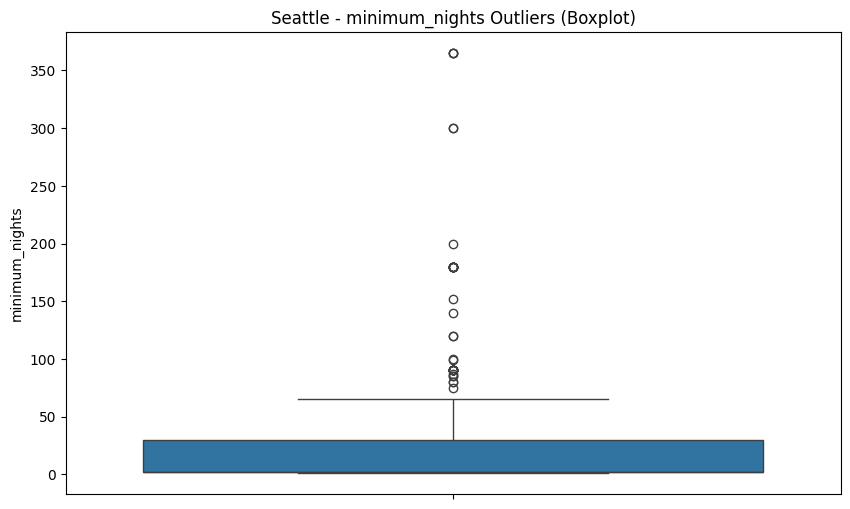


Seattle - review_scores_rating Outliers (IQR): 417 rows
Seattle - review_scores_rating Outliers (Z-score): 72 rows


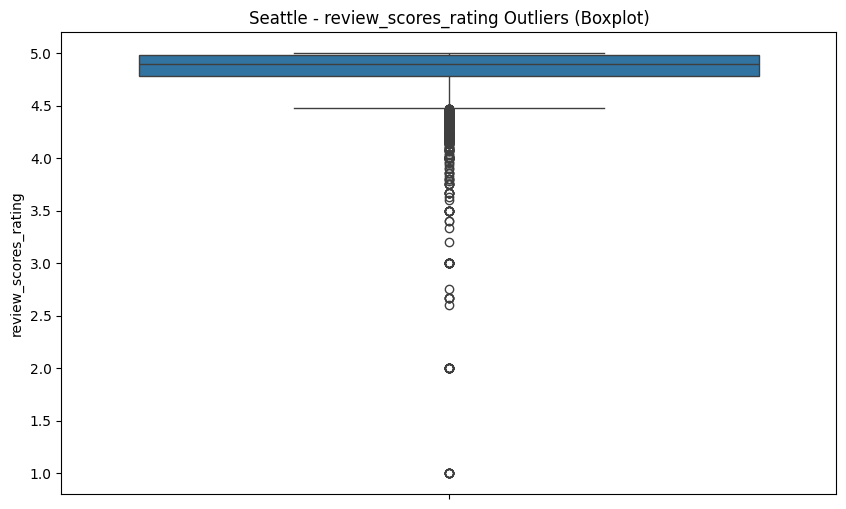


Seattle - number_of_reviews Outliers (IQR): 493 rows
Seattle - number_of_reviews Outliers (Z-score): 131 rows


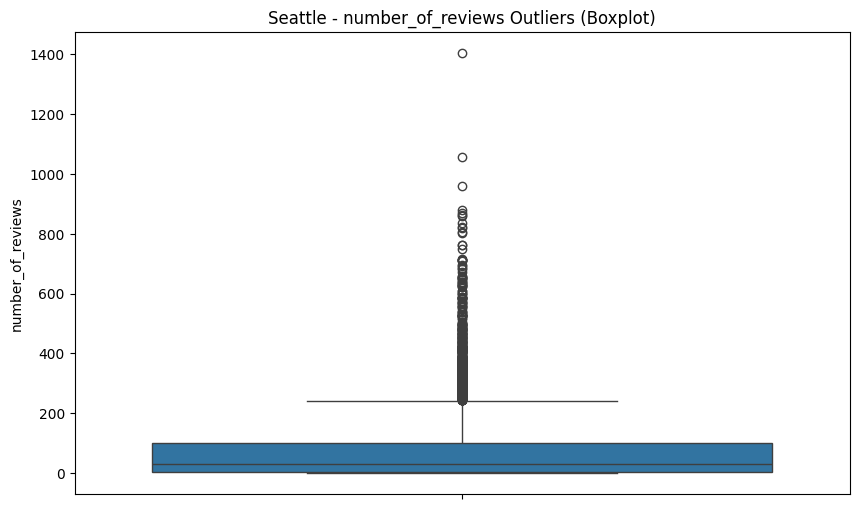


===== Outlier Detection for SanFrancisco =====

SanFrancisco - price Outliers (IQR): 440 rows
SanFrancisco - price Outliers (Z-score): 13 rows


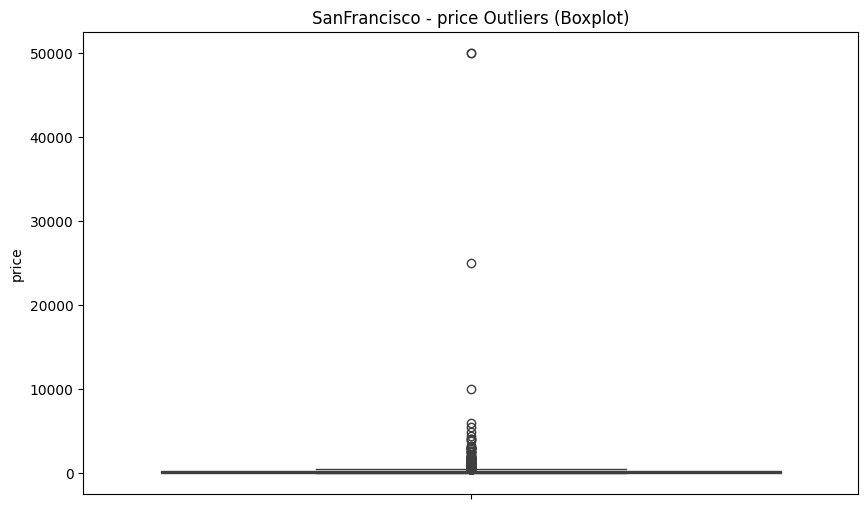


SanFrancisco - minimum_nights Outliers (IQR): 61 rows
SanFrancisco - minimum_nights Outliers (Z-score): 42 rows


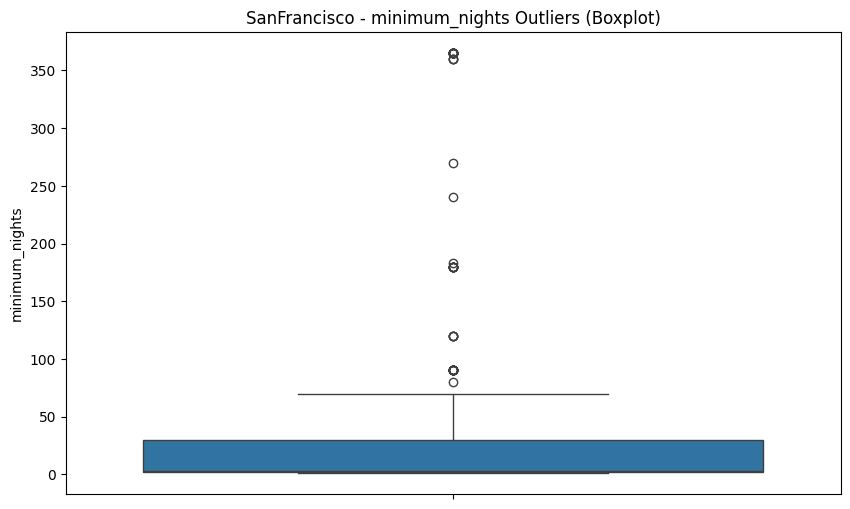


SanFrancisco - review_scores_rating Outliers (IQR): 352 rows
SanFrancisco - review_scores_rating Outliers (Z-score): 80 rows


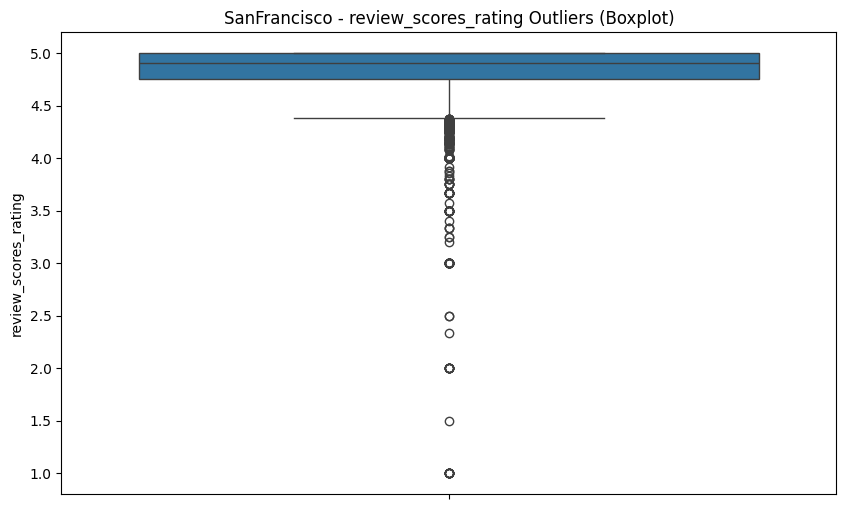


SanFrancisco - number_of_reviews Outliers (IQR): 717 rows
SanFrancisco - number_of_reviews Outliers (Z-score): 161 rows


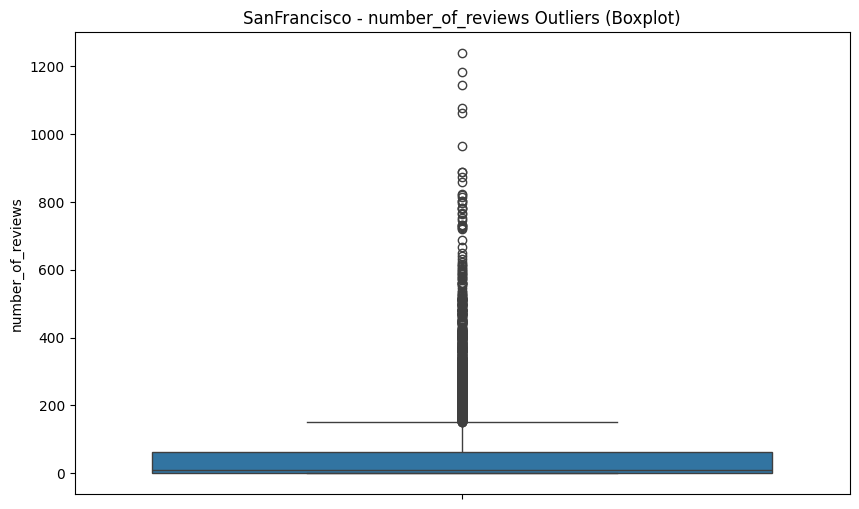


===== Outlier Detection for NewYorkCity =====

NewYorkCity - price Outliers (IQR): 1750 rows
NewYorkCity - price Outliers (Z-score): 37 rows


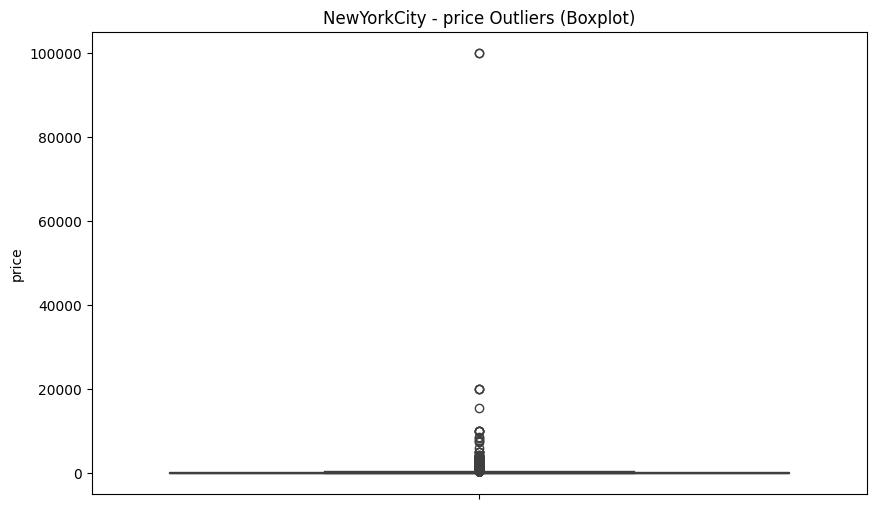


NewYorkCity - minimum_nights Outliers (IQR): 5808 rows
NewYorkCity - minimum_nights Outliers (Z-score): 136 rows


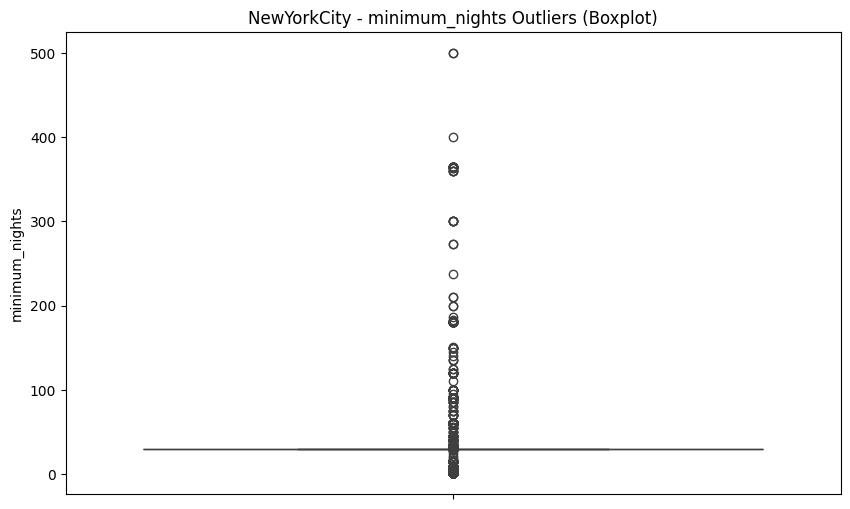


NewYorkCity - review_scores_rating Outliers (IQR): 1036 rows
NewYorkCity - review_scores_rating Outliers (Z-score): 328 rows


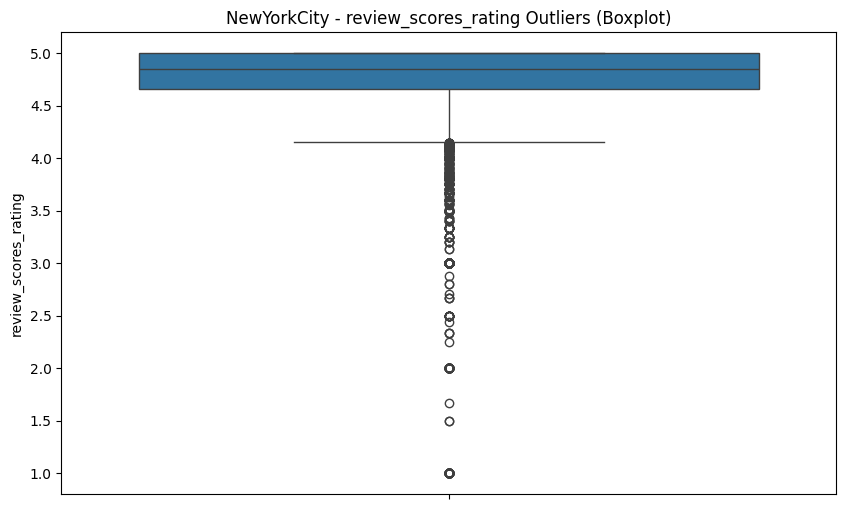


NewYorkCity - number_of_reviews Outliers (IQR): 2632 rows
NewYorkCity - number_of_reviews Outliers (Z-score): 449 rows


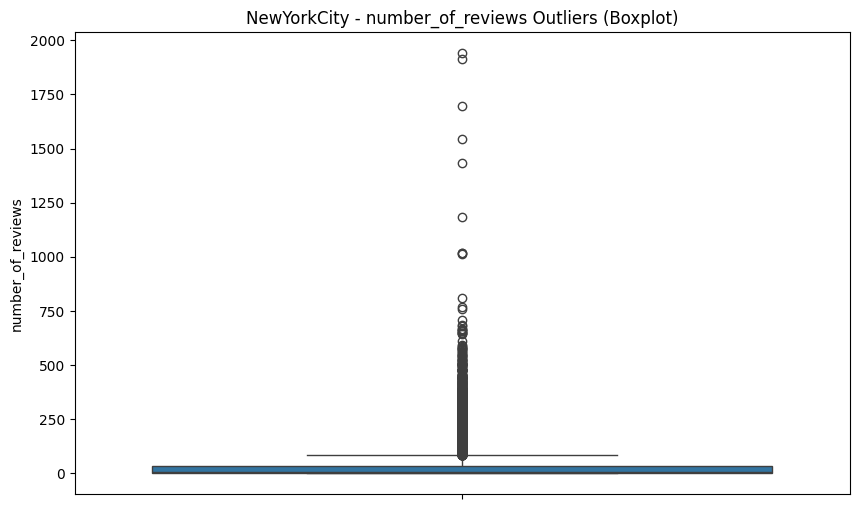


===== Outlier Detection for Hawaii =====

Hawaii - price Outliers (IQR): 2848 rows
Hawaii - price Outliers (Z-score): 223 rows


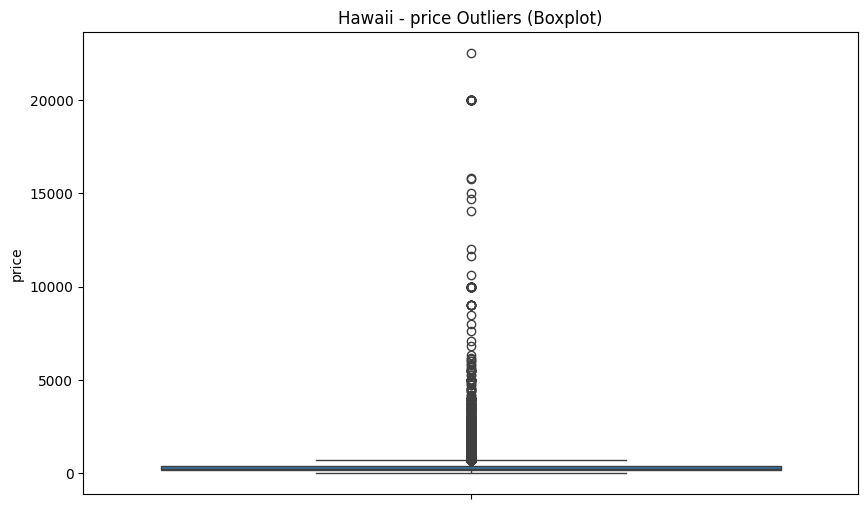


Hawaii - minimum_nights Outliers (IQR): 3697 rows
Hawaii - minimum_nights Outliers (Z-score): 699 rows


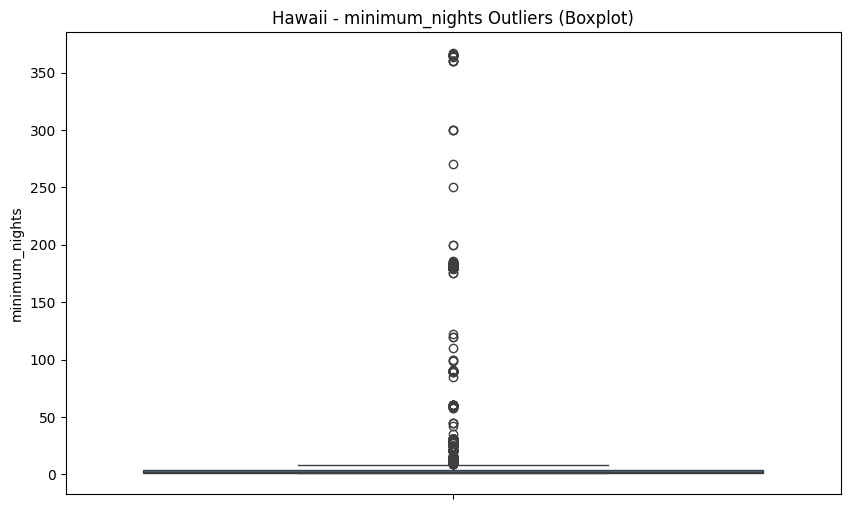


Hawaii - review_scores_rating Outliers (IQR): 1355 rows
Hawaii - review_scores_rating Outliers (Z-score): 406 rows


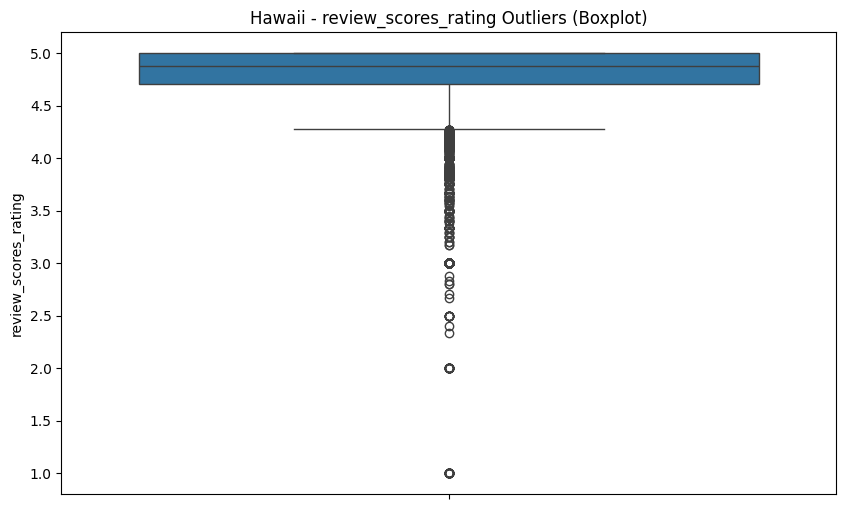


Hawaii - number_of_reviews Outliers (IQR): 3224 rows
Hawaii - number_of_reviews Outliers (Z-score): 666 rows


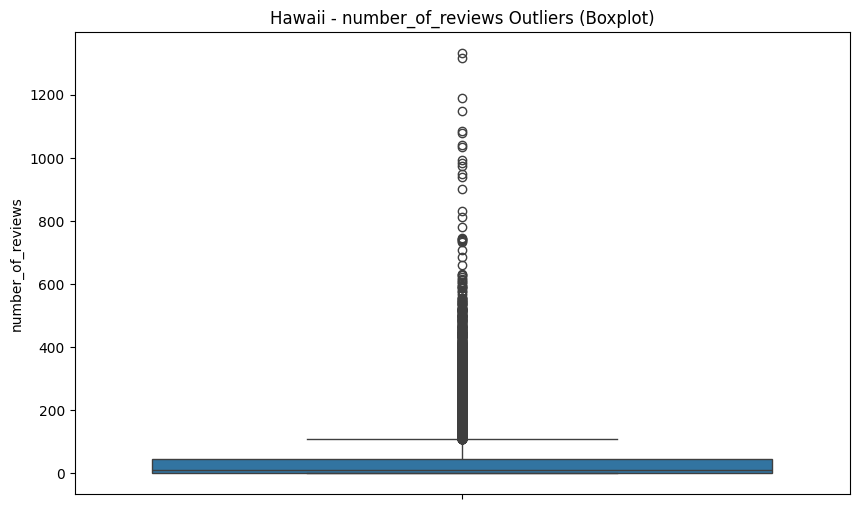


===== Outlier Detection for Boston =====

Boston - price Outliers (IQR): 232 rows
Boston - price Outliers (Z-score): 62 rows


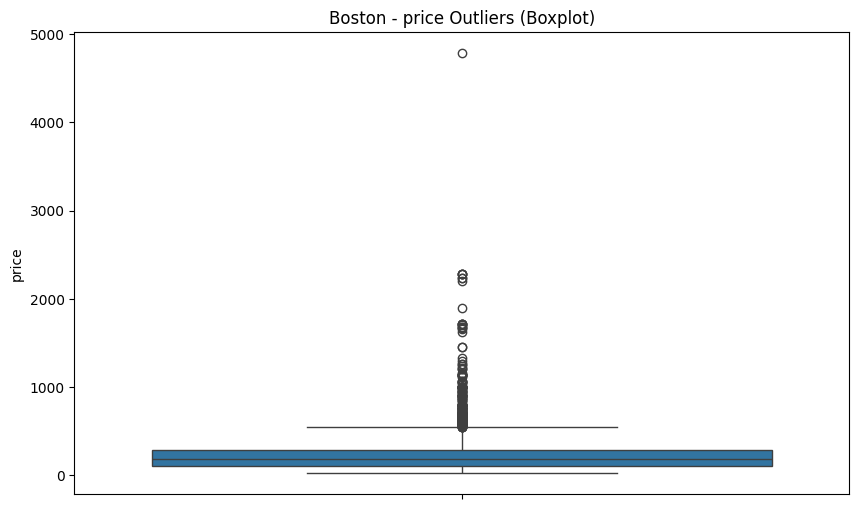


Boston - minimum_nights Outliers (IQR): 367 rows
Boston - minimum_nights Outliers (Z-score): 16 rows


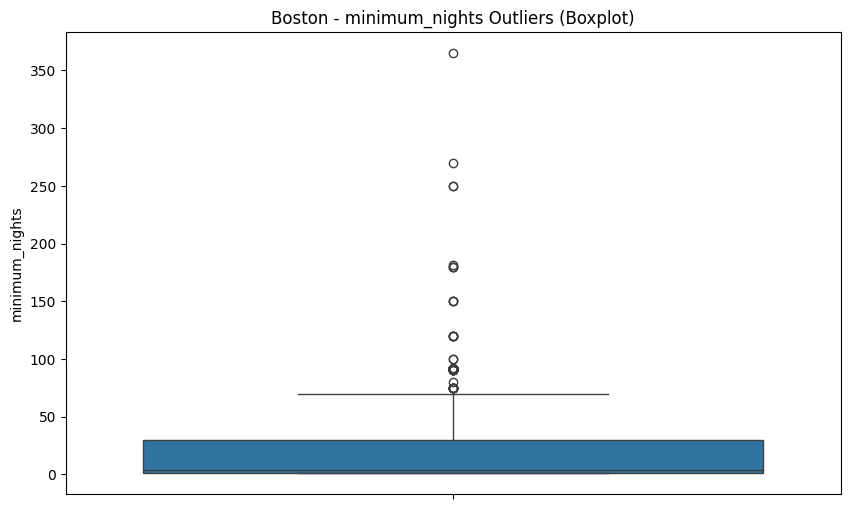


Boston - review_scores_rating Outliers (IQR): 176 rows
Boston - review_scores_rating Outliers (Z-score): 49 rows


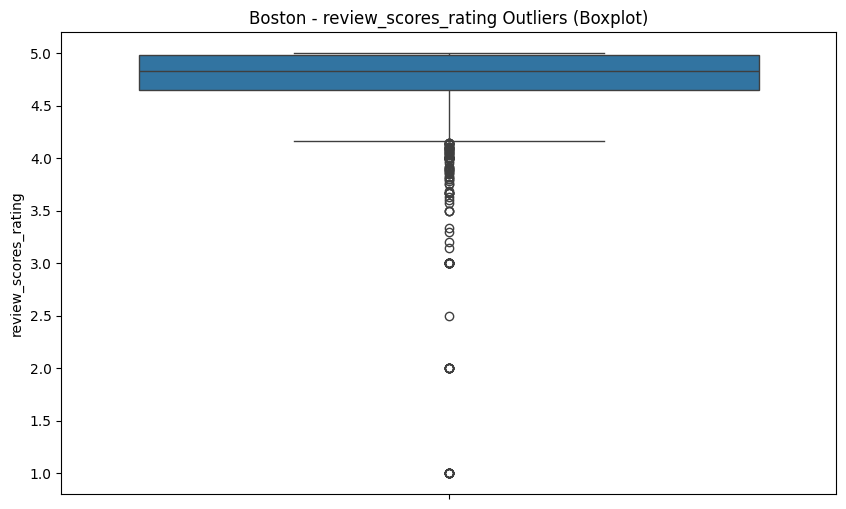


Boston - number_of_reviews Outliers (IQR): 402 rows
Boston - number_of_reviews Outliers (Z-score): 71 rows


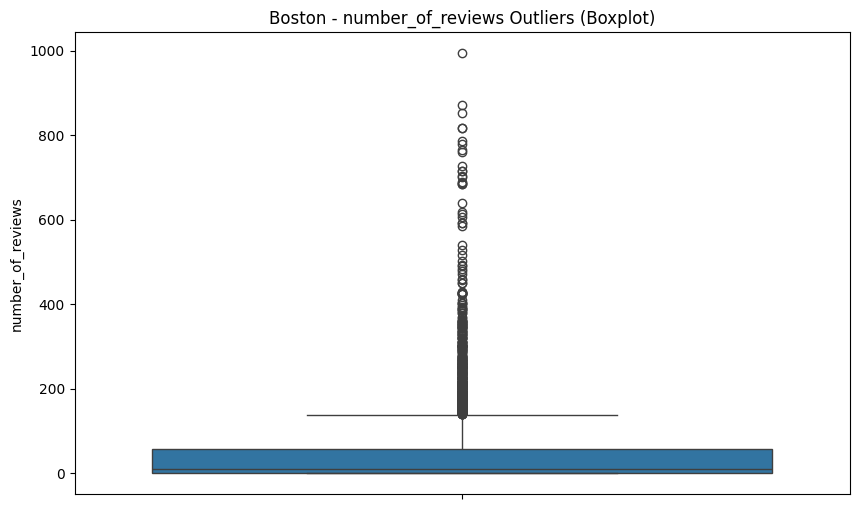

In [22]:
"""
6.) Outlier Detection

Focus on price, minimum_nights, review_score_rating, and number of reviews

(possible) Outlier detection will be performed by calculate IQR and Z-Score for features in question

Additionally, plotting boxplots to visualize data
"""
def find_outliers_iqr(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - (1.5 * IQR)
    upper_limit = Q3 + (1.5*IQR)

    # Need to filter entries for the feature the fall outside of one of the limits
    # Using bitwise OR from Pandas
    # Returns only the rows in which one of the comparisons is true
    return df[(df[feature] < lower_limit) | (df[feature] > upper_limit)]

def find_outliers_zscore(df, feature):
    z_scores = stats.zscore(df[feature].dropna()) 
    abs_z_scores = np.abs(z_scores) 
    
    outlier_index = abs_z_scores[abs_z_scores > 3].index 
    return df.loc[outlier_index]  

def analyze_outliers(cities, columns):
    for city, dfs in cities.items():
        print(f"\n===== Outlier Detection for {city} =====")
        listings_df = dfs['listings_price_based_df']

        for column in columns:
            iqr_outliers_df = find_outliers_iqr(listings_df, column).copy()
            iqr_outliers_df.loc[:, 'outlier_type'] = 'IQR'
            print(f"\n{city} - {column} Outliers (IQR): {iqr_outliers_df.shape[0]} rows")

            zscore_outliers_df = find_outliers_zscore(listings_df, column).copy()
            zscore_outliers_df.loc[:, 'outlier_type'] = 'Z'
            print(f"{city} - {column} Outliers (Z-score): {zscore_outliers_df.shape[0]} rows")

            # Plot boxplot to show possible outliers
            plt.figure(figsize=(10, 6))
            sns.boxplot(data=listings_df, y=column)
            plt.title(f"{city} - {column} Outliers (Boxplot)")
            plt.show()

        combined_outliers = pd.concat([iqr_outliers_df, zscore_outliers_df])
        combined_outliers.to_csv(f'{city}_{column}_outliers.csv', index=False)

outlier_columns = ['price', 'minimum_nights', 'review_scores_rating', 'number_of_reviews']

analyze_outliers(city_dfs, outlier_columns)


===== Review Length Analysis for Seattle =====

Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.926   
review_length_median                      0.926                 1.000   
review_scores_rating                     -0.290                -0.257   
review_scores_accuracy                   -0.254                -0.226   
review_scores_cleanliness                -0.215                -0.180   
review_scores_checkin                    -0.214                -0.191   
review_scores_communication              -0.292                -0.261   
review_scores_location                   -0.206                -0.187   
review_scores_value                      -0.232                -0.204   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.290                  -0.254   
review_length

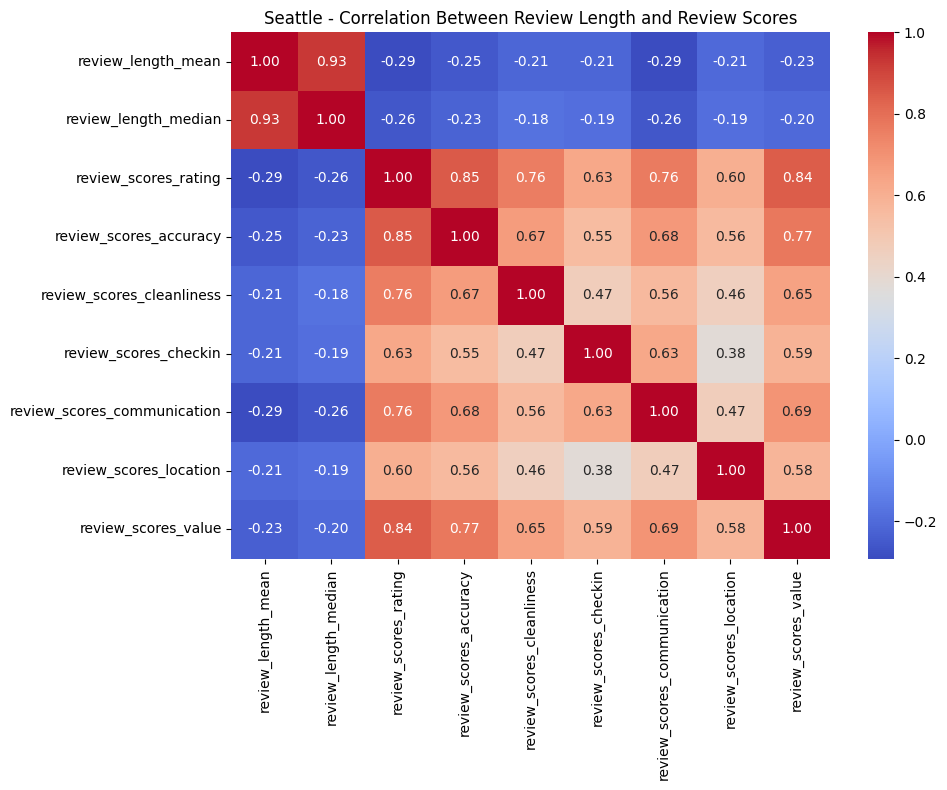


Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.926   
review_length_median                      0.926                 1.000   
review_scores_rating                     -0.290                -0.257   
review_scores_accuracy                   -0.254                -0.226   
review_scores_cleanliness                -0.215                -0.180   
review_scores_checkin                    -0.214                -0.191   
review_scores_communication              -0.292                -0.261   
review_scores_location                   -0.206                -0.187   
review_scores_value                      -0.232                -0.204   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.290                  -0.254   
review_length_median                       -0.257            

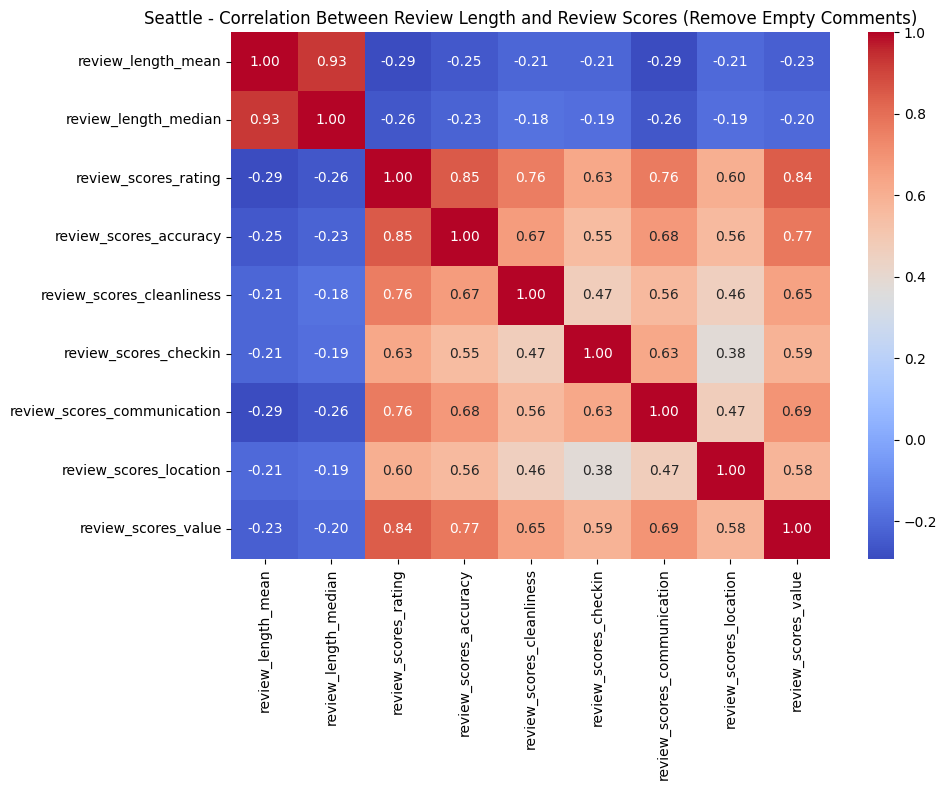


===== Review Length Analysis for SanFrancisco =====

Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.924   
review_length_median                      0.924                 1.000   
review_scores_rating                     -0.173                -0.154   
review_scores_accuracy                   -0.119                -0.104   
review_scores_cleanliness                -0.142                -0.123   
review_scores_checkin                    -0.070                -0.062   
review_scores_communication              -0.076                -0.071   
review_scores_location                   -0.080                -0.083   
review_scores_value                      -0.129                -0.115   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.173                  -0.119   
review_l

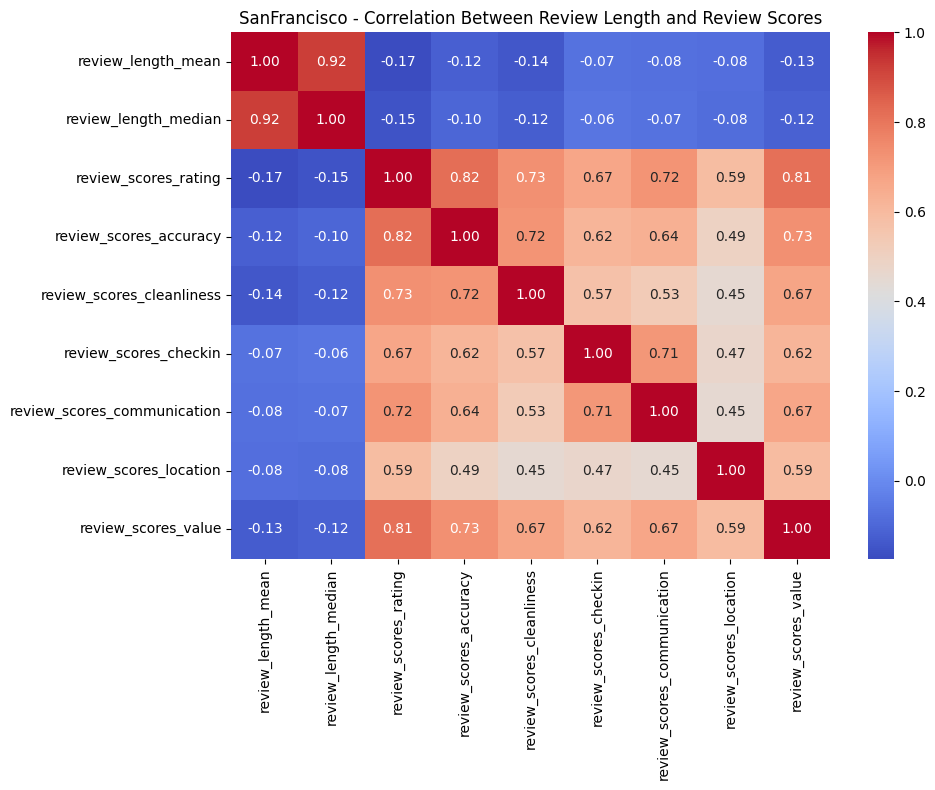


Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.924   
review_length_median                      0.924                 1.000   
review_scores_rating                     -0.173                -0.154   
review_scores_accuracy                   -0.119                -0.104   
review_scores_cleanliness                -0.142                -0.123   
review_scores_checkin                    -0.070                -0.062   
review_scores_communication              -0.076                -0.071   
review_scores_location                   -0.080                -0.083   
review_scores_value                      -0.129                -0.115   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.173                  -0.119   
review_length_median                       -0.154            

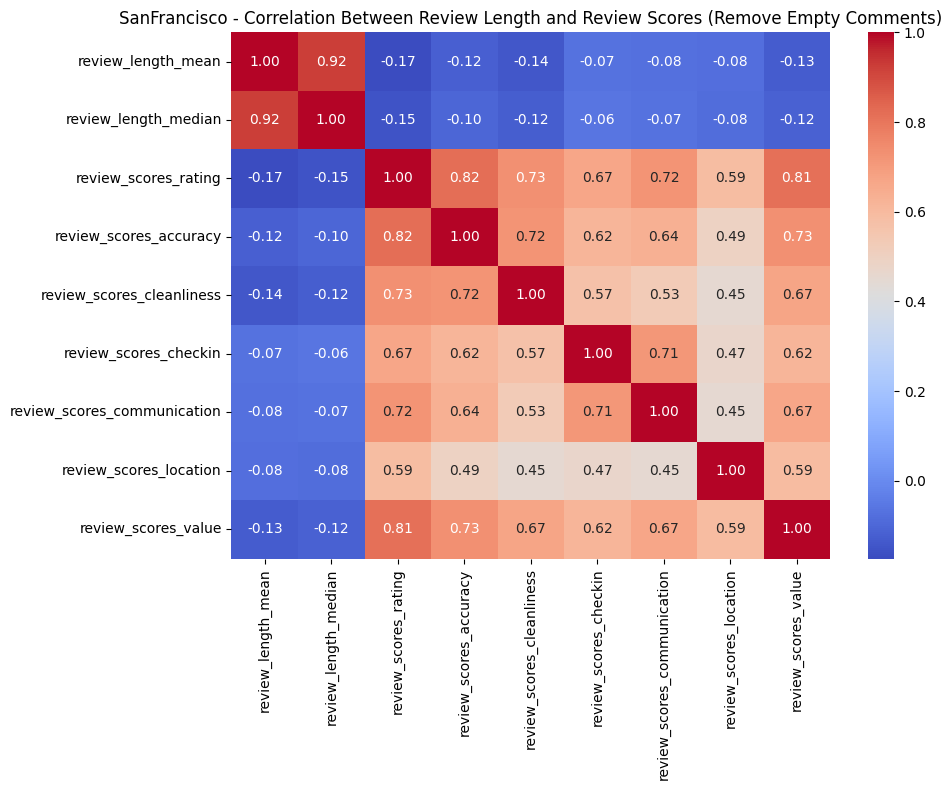


===== Review Length Analysis for NewYorkCity =====

Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.927   
review_length_median                      0.927                 1.000   
review_scores_rating                     -0.182                -0.180   
review_scores_accuracy                   -0.162                -0.169   
review_scores_cleanliness                -0.145                -0.148   
review_scores_checkin                    -0.126                -0.133   
review_scores_communication              -0.144                -0.150   
review_scores_location                   -0.090                -0.090   
review_scores_value                      -0.168                -0.181   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.182                  -0.162   
review_le

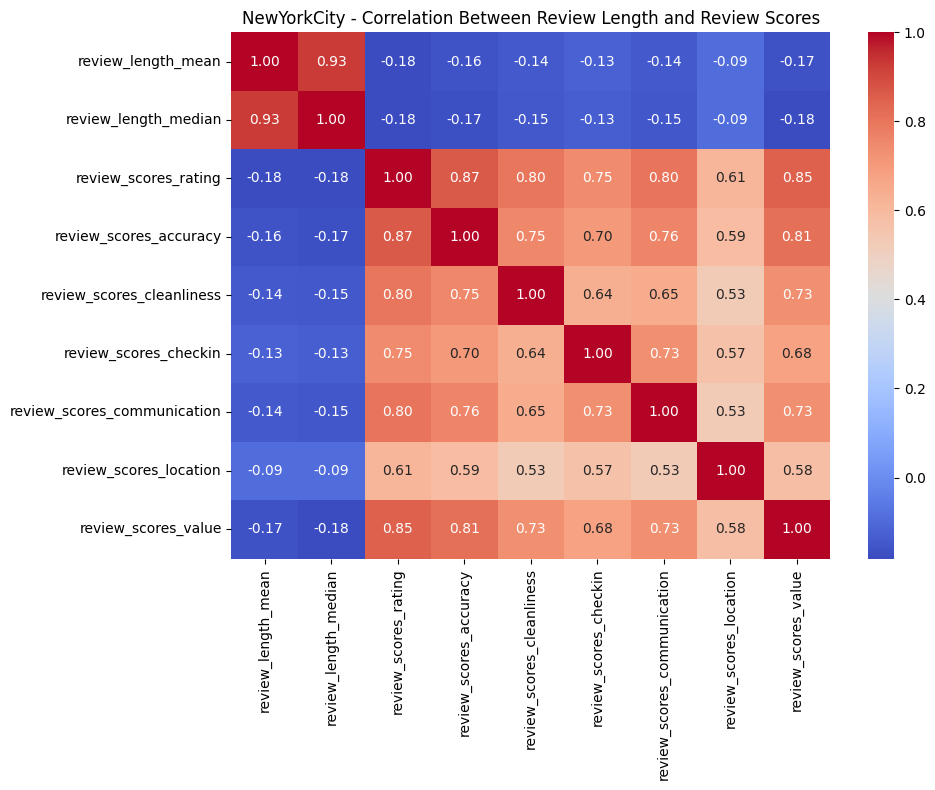


Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.927   
review_length_median                      0.927                 1.000   
review_scores_rating                     -0.182                -0.180   
review_scores_accuracy                   -0.162                -0.169   
review_scores_cleanliness                -0.145                -0.148   
review_scores_checkin                    -0.126                -0.133   
review_scores_communication              -0.144                -0.150   
review_scores_location                   -0.090                -0.090   
review_scores_value                      -0.168                -0.181   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.182                  -0.162   
review_length_median                       -0.180            

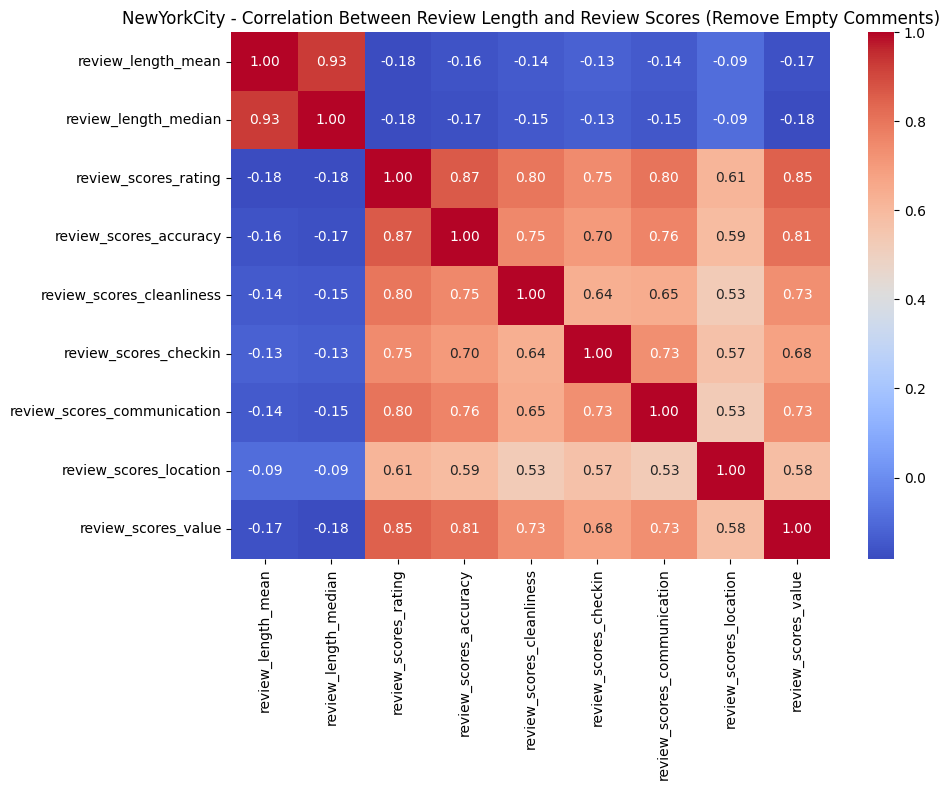


===== Review Length Analysis for Hawaii =====

Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.904   
review_length_median                      0.904                 1.000   
review_scores_rating                     -0.177                -0.145   
review_scores_accuracy                   -0.157                -0.142   
review_scores_cleanliness                -0.117                -0.084   
review_scores_checkin                    -0.111                -0.102   
review_scores_communication              -0.147                -0.130   
review_scores_location                   -0.087                -0.074   
review_scores_value                      -0.145                -0.126   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.177                  -0.157   
review_length_

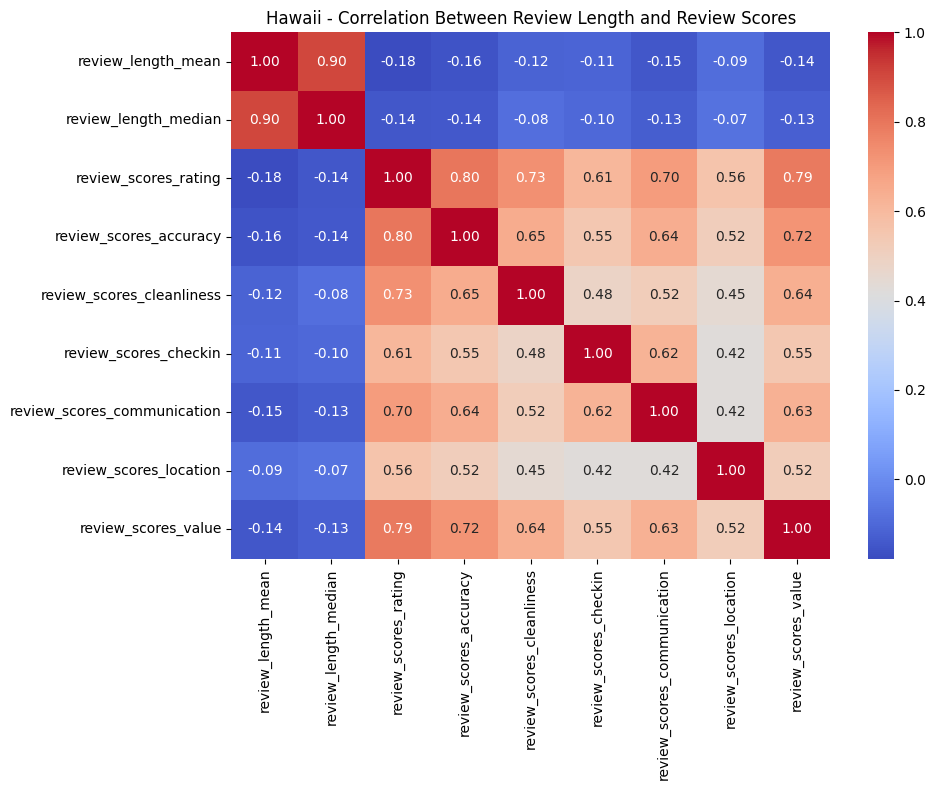


Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.904   
review_length_median                      0.904                 1.000   
review_scores_rating                     -0.177                -0.145   
review_scores_accuracy                   -0.157                -0.142   
review_scores_cleanliness                -0.117                -0.084   
review_scores_checkin                    -0.111                -0.102   
review_scores_communication              -0.147                -0.130   
review_scores_location                   -0.087                -0.074   
review_scores_value                      -0.145                -0.127   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.177                  -0.157   
review_length_median                       -0.145            

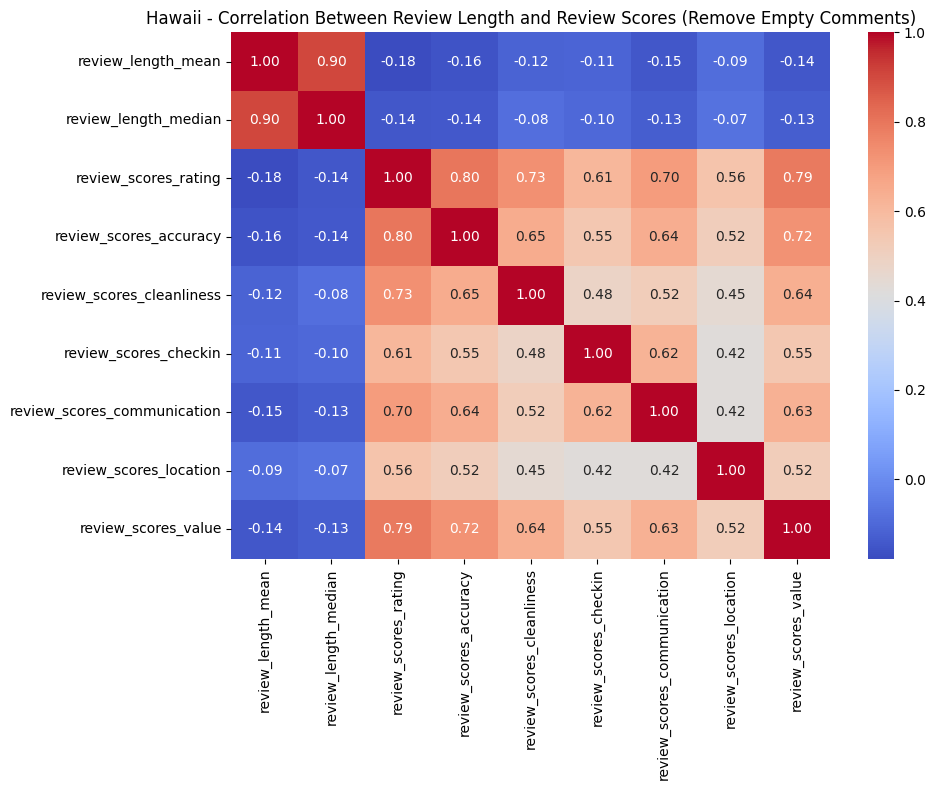


===== Review Length Analysis for Boston =====

Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.942   
review_length_median                      0.942                 1.000   
review_scores_rating                     -0.239                -0.209   
review_scores_accuracy                   -0.195                -0.179   
review_scores_cleanliness                -0.157                -0.134   
review_scores_checkin                    -0.194                -0.191   
review_scores_communication              -0.316                -0.298   
review_scores_location                   -0.116                -0.103   
review_scores_value                      -0.185                -0.181   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.239                  -0.195   
review_length_

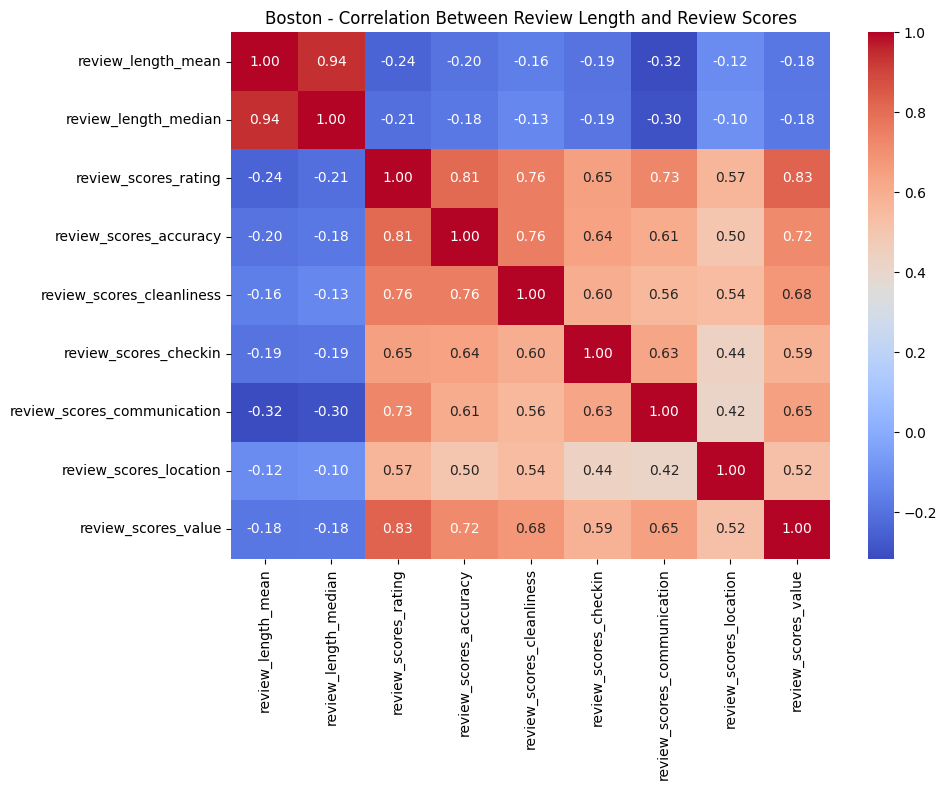


Correlation between review length and review scores:
                             review_length_mean  review_length_median  \
review_length_mean                        1.000                 0.942   
review_length_median                      0.942                 1.000   
review_scores_rating                     -0.239                -0.209   
review_scores_accuracy                   -0.195                -0.179   
review_scores_cleanliness                -0.157                -0.134   
review_scores_checkin                    -0.194                -0.191   
review_scores_communication              -0.316                -0.298   
review_scores_location                   -0.116                -0.103   
review_scores_value                      -0.185                -0.181   

                             review_scores_rating  review_scores_accuracy  \
review_length_mean                         -0.239                  -0.195   
review_length_median                       -0.209            

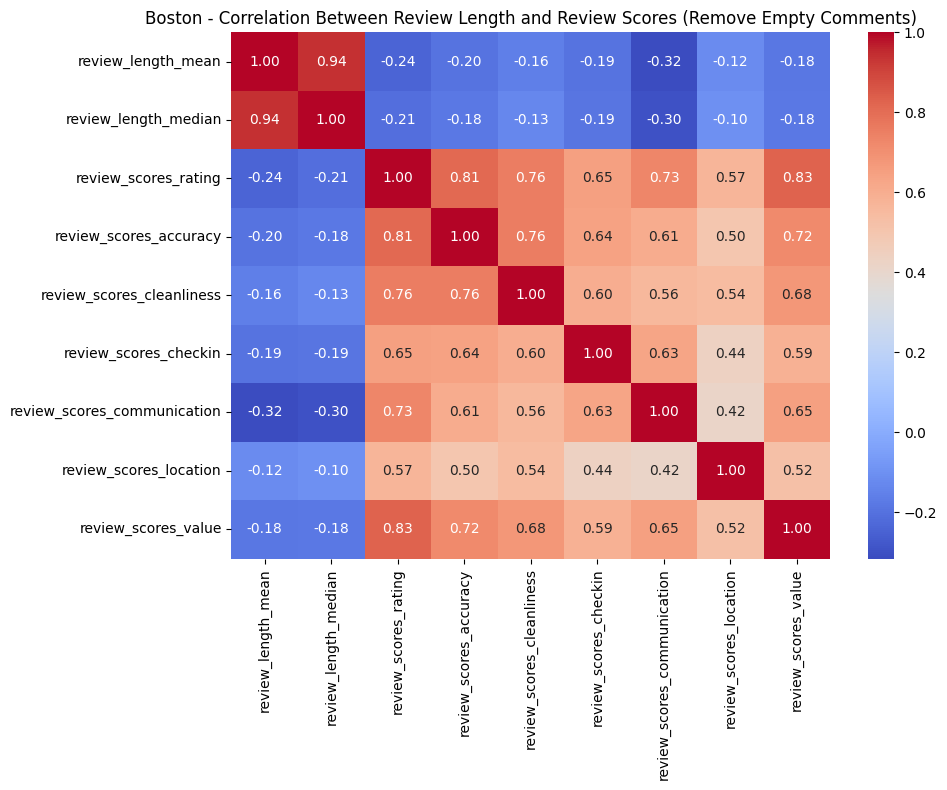

In [23]:
"""
7.) Text Length

Analyzing text length and its possible effects
"""

# Define new feature for text length of review comments
def define_review_length(reviews_df):
    # Find number of words in review
    reviews_df['review_length'] = reviews_df['comments'].apply(lambda x: len(x.split()))
    return reviews_df

# Combine dataframes such that we can compare review scores with the text length
def merge_listings_and_reviews(listings_df, reviews_df):
    # Group the reviews by the listing (via id) and calculate the average text length of review. 
    review_length_df = reviews_df.groupby('listing_id').agg({
        'review_length': ['mean', 'median'] 
    }).reset_index()
    
    review_length_df.columns = ['listing_id', 'review_length_mean', 'review_length_median']

    return pd.merge(listings_df, review_length_df, left_on='id', right_on='listing_id', how='left')

# Calculate the correlation matrix in the merged dataframe
def calc_corr_with_review_score(merged_df):
    correlation_matrix = merged_df[['review_length_mean', 'review_length_median', 'review_scores_rating', 'review_scores_accuracy',
                                    'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
                                    'review_scores_location', 'review_scores_value']].corr().round(3)
    
    print("\nCorrelation between review length and review scores:")
    print(correlation_matrix)

    return correlation_matrix

# Perform analysis of review text length and its correlations
def analyze_review_length_and_scores(cities):
    for city, dfs in cities.items():
        print(f"\n===== Review Length Analysis for {city} =====")

        reviews_df = dfs['reviews_df']
        listings_df = dfs['listings_review_based_df'] # Using review based here (this df does not contain entries without reviews)
        
        # Add comment text length feature to the reviews dataframe
        reviews_with_length = define_review_length(reviews_df) 
        
        # Merge the relevant listings dataframe with the new reviews dataframe
        listings_with_review_length = merge_listings_and_reviews(listings_df, reviews_with_length)
        
        # Create a correlation matrix with this new merged dataframe
        correlation_matrix = calc_corr_with_review_score(listings_with_review_length)
        
        # Plot a heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title(f"{city} - Correlation Between Review Length and Review Scores")
        plt.tight_layout()
        plt.show()

        # Filter out entries where review length is 0
        listings_with_review_length = listings_with_review_length[listings_with_review_length['review_length_mean'] > 0]
        correlation_matrix = calc_corr_with_review_score(listings_with_review_length)

        # Plot a heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title(f"{city} - Correlation Between Review Length and Review Scores (Remove Empty Comments)")
        plt.tight_layout()
        plt.show()



analyze_review_length_and_scores(city_dfs)




===== Keyword Sentiment Analysis for Seattle =====


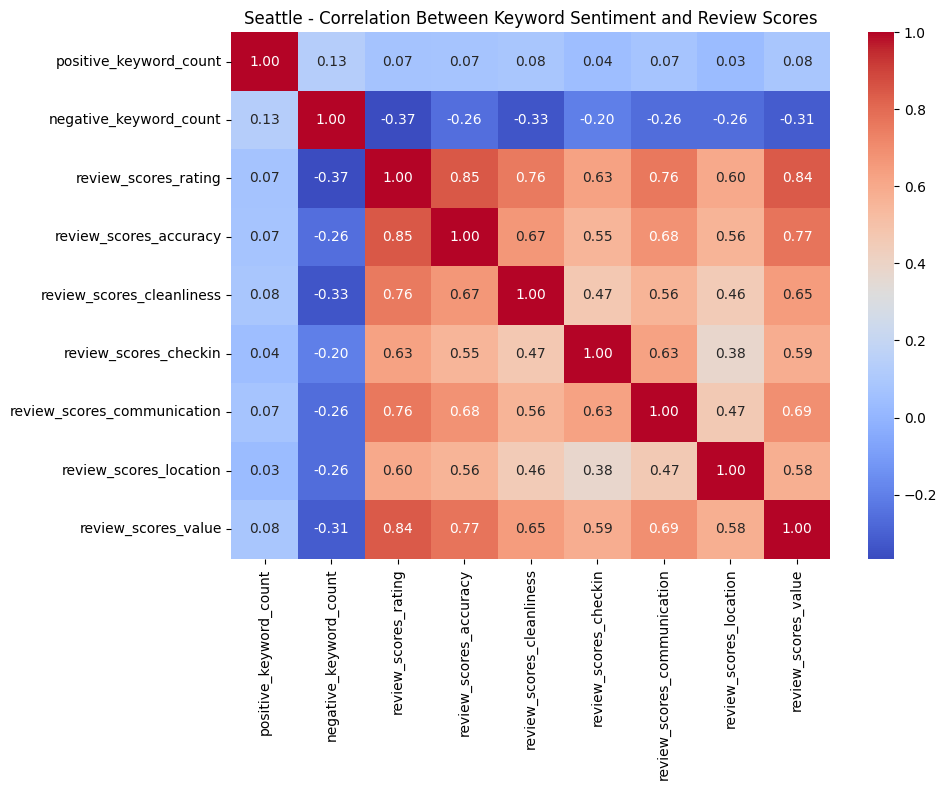


===== Keyword Sentiment Analysis for SanFrancisco =====


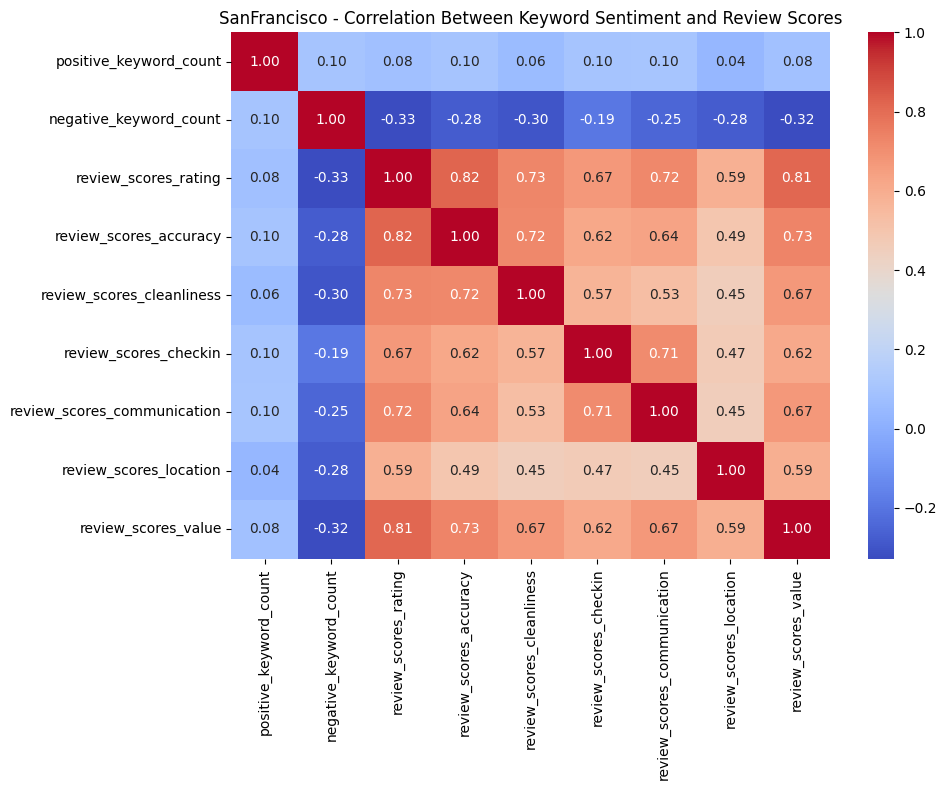


===== Keyword Sentiment Analysis for NewYorkCity =====


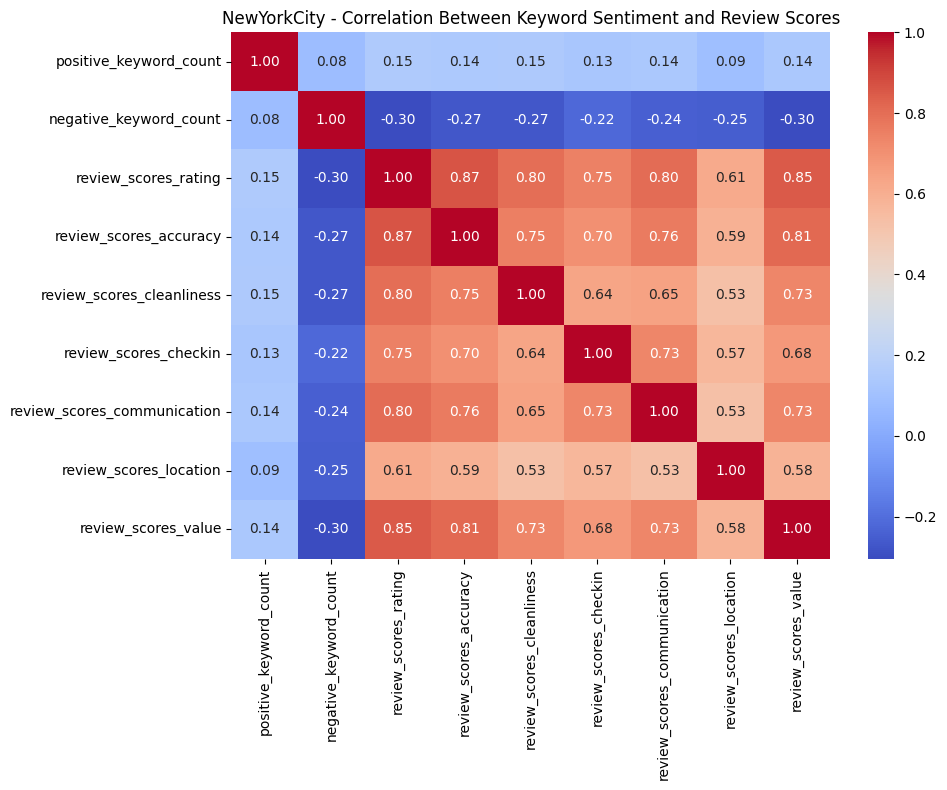


===== Keyword Sentiment Analysis for Hawaii =====


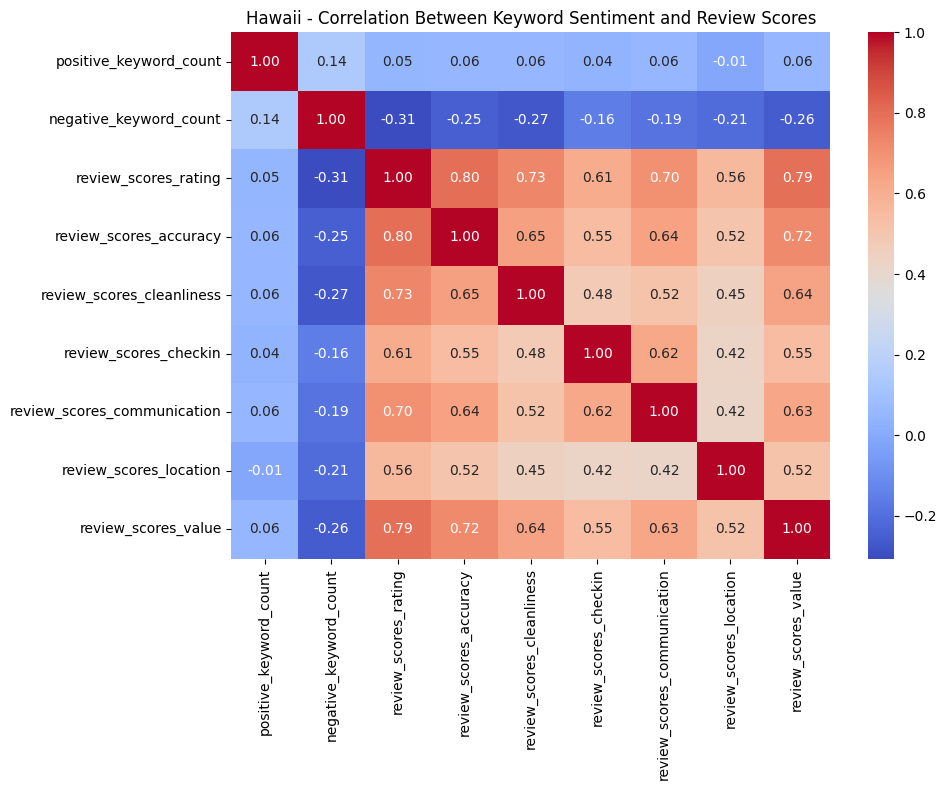


===== Keyword Sentiment Analysis for Boston =====


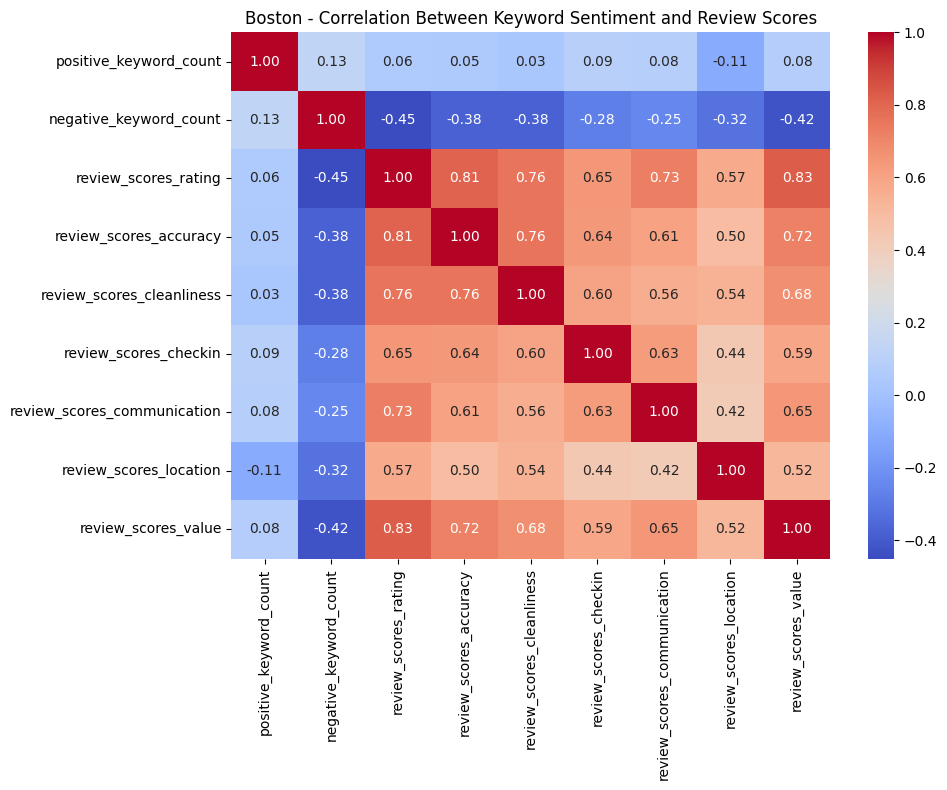

In [24]:
"""
8.) Keyword

Identifying and counting the occurence of specific keywords in the reviews.
Generating new features based on the presence of these keywords.
"""
positive_keywords = [
    'clean', 'comfortable', 'spotless',
    'quiet', 'peaceful',  
    'friendly', 'helpful',  
    'wifi', 'kitchen', 'parking',  
    'convenient', 'central', 'safe',  
    'affordable', 'worth',  
    'charming', 'cozy', 'spacious' 
]

negative_keywords = [
    'dirty', 'dust',  
    'noisy', 'loud',  
    'rude', 'unhelpful',  
    'sketchy', 'far',  
    'expensive', 'overpriced',  
    'outdated', 'cramped'  
]

# Add the counts of the positive/negative keywords in the reviews to the reviews_df
def add_keyword_count(reviews_df, positive_keywords, negative_keywords):
    reviews_df['positive_keyword_count'] = reviews_df['comments'].apply(lambda x: sum([1 for kw in positive_keywords if kw in x.lower()]))
    reviews_df['negative_keyword_count'] = reviews_df['comments'].apply(lambda x: sum([1 for kw in negative_keywords if kw in x.lower()]))
    return reviews_df

# Merge the modified reviews_df, with word counts, with the relevant listings_df
def merge_listings_and_reviews_with_sentiment(listings_df, reviews_df):
    keyword_count_df = reviews_df.groupby('listing_id').agg({
        'positive_keyword_count': 'mean',
        'negative_keyword_count': 'mean'
    }).reset_index()

    return pd.merge(listings_df, keyword_count_df, left_on='id', right_on='listing_id', how='left')

# Analyze "positivity" and "negativity" with various review features
def analyze_keyword_sentiment_and_reviews(cities):
    for city, dfs in cities.items():
        print(f"\n===== Keyword Sentiment Analysis for {city} =====")

        reviews_df = dfs['reviews_df']
        listings_df = dfs['listings_review_based_df'] # Use review-based listings

        # Add keyword count features to reviews_df
        reviews_with_keywords = add_keyword_count(reviews_df, positive_keywords, negative_keywords)
        
        # Merge with listings_df (review based)
        listings_with_keywords = merge_listings_and_reviews_with_sentiment(listings_df, reviews_with_keywords)

        # Correlation matrix between positive/negative keyword counts and review scores
        correlation_matrix = listings_with_keywords[['positive_keyword_count', 'negative_keyword_count', 
                                                     'review_scores_rating', 'review_scores_accuracy', 
                                                     'review_scores_cleanliness', 'review_scores_checkin', 
                                                     'review_scores_communication', 'review_scores_location', 
                                                     'review_scores_value']].corr().round(3)

        # Display heatmap
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title(f"{city} - Correlation Between Keyword Sentiment and Review Scores")
        plt.tight_layout()
        plt.show()

analyze_keyword_sentiment_and_reviews(city_dfs)

#END

